# Model- Vibronic Dark states study 
## Johana A. Gómez - Dic 2020


In [2]:
import array
import numpy as np
import pandas as pd
import scipy.interpolate as spi
import scipy.constants as conts
import matplotlib.pyplot as plt
import astropy.units

from matplotlib import cm
from scipy import signal
from decimal import Decimal
from astropy import units as u
from astropy.table import Table, Column
from scipy.fftpack import fft, fftshift
from astropy.constants import a0, hbar, m_e
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from numpy import *
prop_cycle = plt.rcParams['axes.prop_cycle']
colors = prop_cycle.by_key()['color']

cm1_au=0.0000046
amu_me=1822.888483250000
Deb_au=0.393456

def myplotparams(myplot,myfont,mystring1,mystring2,mystring3='upper right'):
    myplot.xaxis.set_tick_params(labelsize=myfont)
    myplot.yaxis.set_tick_params(labelsize=myfont)
    myplot.set_xlabel(mystring1,fontsize=myfont)
    myplot.set_ylabel(mystring2,fontsize=myfont)
    
    legend = myplot.legend(loc=mystring3, shadow=False,fontsize=myfont-4,borderpad = 0.1, labelspacing = 0, handlelength = 0.8)


## 1.1 The model 

The total Hamiltonian of the system is:

$\hat{H}_{tot}=$ $\hat{H}_c$ + $\displaystyle\sum_{m=1}^{N} \hat{H}_m$ + $\hat{H}_{1}^{(m)}$ + $\hat{W}_{c}^{(m)}$ + $\hat{I}_{1}^{(m)}$

$\hat{H}_c = \left(\hbar \omega_c + \frac{1}{2} \right) \hat{a}_c^\dagger  \hat{a}_c $ 
    
$\hat{H}_m = \left(\hbar \omega_m + \frac{1}{2} \right) \hat{a}_m^\dagger  \hat{a}_m$


$\hat{H}_{1}^{(m)} = \frac{1}{2 M_1} \hat{P}_1^2 + \frac{1}{2} M_1 \omega_1^2 \hat{Q}_1^2$

$\hat{W}_{c}^{(m)} = g\vec{\epsilon}_c \vec{\hat{D}} \left( \hat{a}^\dagger  + \hat{a} \right) + \frac{1}{2}  \left( g\vec{\epsilon}_c \vec{\hat{D}} \right)^2$

$\hat{I}_{1}^{(m)} = \beta \hat{Q}_1 \hat{Q}_m^2$

In [3]:
# Constants
hwc  = 1989.9 # [cm-1]   
hwm  = 1989.9 # [cm-1]  Vibrational mode 30  // Symmetry T1u
hw1  = 448.7  # [cm-1]  Vibrational mode 16-17 // Symmetry Eg
hw2  = 463.2  # [cm-1]  Vibrational mode 18  // Symmetry A1g
Mm   = 13.3959 # [AMU]  Vmode 30
M1   = 14.1305 # [AMU]  Vmode 16-17
M2   = 14.2118 # [AMU]  Vmode 18
mu01 = 1.0     # [D]

The Rabi splitting is being defined as:

$\hbar \Omega_{R}$ = $2 g \mu_{01} \sqrt{N} $

For the vibrational modes ($\hat{Q}_1$) that have a non-negligible anharmonic coupling $\beta  \hat{Q}_1 \hat{q}_m^2$, the Rabi splitting will be modified to satisfy $\hbar \Omega = \hbar \omega_1$

$\hbar \Omega_{R}$ = $2 \left( \cfrac{\hbar \omega_c g_{w_n}}{\sqrt{N}} \right) \mu_{01} \sqrt{N} $

$g_{w_n}$ = $\cfrac{ \hbar \Omega_{R}}{ 2 \hbar \omega_c \mu_{01}}$ 


In [4]:
def my_gw1(Wc,Wr,Mu):
    aWc=Wc*cm1_au
    aWr=Wr*cm1_au
    aMu=Mu*Deb_au
    g1=(aWr/(2*aWc*aMu))
    print(g1)

In [5]:
my_gw1(hwc,hw1,mu01)
my_gw1(hwc,hw2,mu01)

0.2865488364976407
0.29580882787097657


In [11]:
#            Rab   Excit  Beta  Mols   
def readall(coup,filedirs,decs,mols,tfinal=1200,dt1=0.5,dt2=1.0):
    strings=['_up.dat','_lp.dat','_p_GS.dat','_p_plt.dat','_p_ex1.dat','_p_FS.dat','_pop_cv.dat','_pop_ml.dat','_pop_ho.dat','_spec.dat','_auto.dat']
    #str1 = 'C:/Users/Johana Alexandra/Documents/PhD/'
    str1 = '/Users/jagg/PhD/WCO6/model/files/'
    
    str2  = '/m'
    sk    = 7                   # Skipped rows 
    dtC   = 0.999000999
    Efin  = 2500.0
    rgrid = 7
    vibstates = 3
    nmol  = len(mols)
    nodec = len(decs)        # Beta values
    nodirs= len(filedirs)   # Excitation
    tgrid1 = int(tfinal/dt1+1)
    t1 = arange(0,tfinal+dt1,dt1)
    t2 = arange(0,tfinal*2,dt2)
    Egrid1 = int((Efin-1500)/dtC)
    E1 = arange(1500,Efin-dtC,dtC)
    
    pUP  = zeros([nmol,nodirs,nodec,tgrid1])
    pLP  = zeros([nmol,nodirs,nodec,tgrid1])
    pGS  = zeros([nmol,nodirs,nodec,tgrid1])
    pplt = zeros([nmol,nodirs,nodec,tgrid1])
    pex1 = zeros([nmol,nodirs,nodec,tgrid1])
    pFS  = zeros([nmol,nodirs,nodec,tgrid1])
    pDS  = zeros([nmol,nodirs,nodec,tgrid1])
    vib_cv = zeros([nmol,nodirs,nodec,vibstates,tgrid1])
    vib_ml = zeros([nmol,nodirs,nodec,vibstates,tgrid1])
    vib_ho = zeros([nmol,nodirs,nodec,tgrid1,rgrid])
    
    POL   = zeros([nmol,nodirs,nodec,tgrid1])
    DARK  = zeros([nmol,nodirs,nodec,tgrid1])
    
    spcA = zeros([nmol,nodirs,nodec,3,Egrid1])
    auto = zeros([nmol,nodirs,nodec,tgrid1])

    for tm, j in enumerate(mols):
        for i in range(nodirs):
            for k in range(nodec):
                nUP = str1+coup+str2+str(j)+filedirs[i]+decs[k]+strings[0]
                print('Reading from {}'.format(nUP))
                ptemp = pd.read_csv(nUP, '\s+', header=None,skiprows=sk) 
                pUP[tm,i,k]=ptemp[1].values
                nLP = str1+coup+str2+str(j)+filedirs[i]+decs[k]+strings[1]
                print('Reading from {}'.format(nLP))
                ptemp = pd.read_csv(nLP, '\s+', header=None,skiprows=sk) 
                pLP[tm,i,k]=ptemp[1].values
                nGS = str1+coup+str2+str(j)+filedirs[i]+decs[k]+strings[2]
                print('Reading from {}'.format(nGS))
                ptemp = pd.read_csv(nGS, '\s+', header=None,skiprows=sk) 
                pGS[tm,i,k]=ptemp[1].values
                nplt = str1+coup+str2+str(j)+filedirs[i]+decs[k]+strings[3]
                print('Reading from {}'.format(nplt))
                ptemp = pd.read_csv(nplt, '\s+', header=None,skiprows=sk) 
                pplt[tm,i,k]=ptemp[1].values
                nex1 = str1+coup+str2+str(j)+filedirs[i]+decs[k]+strings[4]
                print('Reading from {}'.format(nex1))
                ptemp = pd.read_csv(nex1, '\s+', header=None,skiprows=sk) 
                pex1[tm,i,k]=ptemp[1].values     
                nFS = str1+coup+str2+str(j)+filedirs[i]+decs[k]+strings[5]
                print('Reading from {}'.format(nFS))
                ptemp = pd.read_csv(nFS, '\s+', header=None,skiprows=sk) 
                pFS[tm,i,k]=ptemp[1].values
                name_cv = str1+coup+str2+str(j)+filedirs[i]+decs[k]+strings[6]
                print('Reading from {}'.format(name_cv))
                ptemp = pd.read_csv(name_cv, '\s+', header=None,skiprows=sk) 
                for m in range(vibstates):
                    vib_cv[tm,i,k,m]=ptemp[m+1].values
                name_ml = str1+coup+str2+str(j)+filedirs[i]+decs[k]+strings[7]
                print('Reading from {}'.format(name_ml))
                ptemp = pd.read_csv(name_ml, '\s+', header=None,skiprows=sk) 
                for m in range(vibstates):
                    vib_ml[tm,i,k,m]=ptemp[m+1].values
                name_ho = str1+coup+str2+str(j)+filedirs[i]+decs[k]+strings[8]
                print('Reading from {}'.format(name_ho))
                ptemp = pd.read_csv(name_ho, '\s+', header=None,skiprows=0) 
                vib_ho[tm,i,k] = ptemp[2].values.reshape(tgrid1,rgrid)
                
                pDS[tm,i,k]=pex1[tm,i,k]-pplt[tm,i,k]
                POL[tm,i,k]=pUP[tm,i,k]+pLP[tm,i,k]               # Expec UP + LP
                DARK[tm,i,k]=pFS[tm,i,k]-POL[tm,i,k]-pGS[tm,i,k]
                
                nspec = str1+coup+str2+str(j)+filedirs[i]+decs[k]+strings[9]
                print('Reading from {}'.format(nspec))
                ptemp = pd.read_csv(nspec,'\s+',header=None,skiprows=3)
                spcA[tm,i,k,0]=ptemp[0].values
                spcA[tm,i,k,1]=ptemp[2].values
                
                nauto = str1+coup+str2+str(j)+filedirs[i]+decs[k]+strings[10]
                print('Reading from {}'.format(nauto))
                ptemp = pd.read_csv(nauto, '\s+', header=None,skiprows=1) 
                auto[tm,i,k]=ptemp[1].values
                

    return  pUP, pLP, pGS, pplt, pex1, pFS, vib_cv, vib_ml, vib_ho, pDS, POL, DARK, spcA, auto                               

In [12]:
def my_gw1(Wc,Wr,Mu):
    aWc=Wc*cm1_au
    aWr=Wr*cm1_au
    aMu=Mu*Deb_au
    g1=(aWr/(2*aWc*aMu))
    print(g1)

m7_cv_b20 --> All files  --> REPETIR     --> DOING THE CALCULATION, NOT YET PLOTS!


In [13]:
Ext  = ['_cv','_ex','_ho','_up','_lp']
#Beta = ['_b0','_b10','_b20','_b30','_b40','_b50','_b60','_b70']
Beta = ['_b0','_b10','_b30','_b40','_b50','_b60']
N_m  = ['1','2','3','4','5','6','7']
cpu1 = 'rab_ho1'

UP1, LP1, GS1, plt1, ex11, FS1, Vcv1, Vml1, Vho1 , DS1, POL1, DARK1= readall(cpu1,Ext,Beta,N_m,1200)

Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m1_cv_b0_up.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m1_cv_b0_lp.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m1_cv_b0_p_GS.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m1_cv_b0_p_plt.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m1_cv_b0_p_ex1.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m1_cv_b0_p_FS.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m1_cv_b0_pop_cv.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m1_cv_b0_pop_ml.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m1_cv_b0_pop_ho.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m1_cv_b0_spec.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m1_cv_b0_auto.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m1_cv_b10_up.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m1_cv_b10_lp.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m1_cv_b1

Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m1_ex_b60_auto.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m1_ho_b0_up.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m1_ho_b0_lp.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m1_ho_b0_p_GS.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m1_ho_b0_p_plt.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m1_ho_b0_p_ex1.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m1_ho_b0_p_FS.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m1_ho_b0_pop_cv.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m1_ho_b0_pop_ml.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m1_ho_b0_pop_ho.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m1_ho_b0_spec.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m1_ho_b0_auto.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m1_ho_b10_up.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m1_ho_

Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m1_up_b60_spec.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m1_up_b60_auto.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m1_lp_b0_up.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m1_lp_b0_lp.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m1_lp_b0_p_GS.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m1_lp_b0_p_plt.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m1_lp_b0_p_ex1.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m1_lp_b0_p_FS.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m1_lp_b0_pop_cv.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m1_lp_b0_pop_ml.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m1_lp_b0_pop_ho.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m1_lp_b0_spec.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m1_lp_b0_auto.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m1_l

Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m2_cv_b60_spec.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m2_cv_b60_auto.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m2_ex_b0_up.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m2_ex_b0_lp.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m2_ex_b0_p_GS.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m2_ex_b0_p_plt.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m2_ex_b0_p_ex1.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m2_ex_b0_p_FS.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m2_ex_b0_pop_cv.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m2_ex_b0_pop_ml.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m2_ex_b0_pop_ho.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m2_ex_b0_spec.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m2_ex_b0_auto.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m2_e

Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m2_ho_b60_spec.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m2_ho_b60_auto.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m2_up_b0_up.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m2_up_b0_lp.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m2_up_b0_p_GS.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m2_up_b0_p_plt.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m2_up_b0_p_ex1.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m2_up_b0_p_FS.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m2_up_b0_pop_cv.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m2_up_b0_pop_ml.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m2_up_b0_pop_ho.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m2_up_b0_spec.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m2_up_b0_auto.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m2_u

Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m2_lp_b60_spec.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m2_lp_b60_auto.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m3_cv_b0_up.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m3_cv_b0_lp.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m3_cv_b0_p_GS.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m3_cv_b0_p_plt.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m3_cv_b0_p_ex1.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m3_cv_b0_p_FS.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m3_cv_b0_pop_cv.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m3_cv_b0_pop_ml.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m3_cv_b0_pop_ho.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m3_cv_b0_spec.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m3_cv_b0_auto.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m3_c

Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m3_ho_b0_up.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m3_ho_b0_lp.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m3_ho_b0_p_GS.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m3_ho_b0_p_plt.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m3_ho_b0_p_ex1.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m3_ho_b0_p_FS.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m3_ho_b0_pop_cv.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m3_ho_b0_pop_ml.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m3_ho_b0_pop_ho.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m3_ho_b0_spec.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m3_ho_b0_auto.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m3_ho_b10_up.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m3_ho_b10_lp.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m3_ho_b1

Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m3_lp_b0_p_plt.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m3_lp_b0_p_ex1.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m3_lp_b0_p_FS.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m3_lp_b0_pop_cv.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m3_lp_b0_pop_ml.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m3_lp_b0_pop_ho.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m3_lp_b0_spec.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m3_lp_b0_auto.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m3_lp_b10_up.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m3_lp_b10_lp.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m3_lp_b10_p_GS.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m3_lp_b10_p_plt.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m3_lp_b10_p_ex1.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1

Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m4_ex_b0_p_FS.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m4_ex_b0_pop_cv.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m4_ex_b0_pop_ml.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m4_ex_b0_pop_ho.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m4_ex_b0_spec.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m4_ex_b0_auto.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m4_ex_b10_up.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m4_ex_b10_lp.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m4_ex_b10_p_GS.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m4_ex_b10_p_plt.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m4_ex_b10_p_ex1.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m4_ex_b10_p_FS.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m4_ex_b10_pop_cv.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_h

Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m4_up_b0_p_FS.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m4_up_b0_pop_cv.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m4_up_b0_pop_ml.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m4_up_b0_pop_ho.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m4_up_b0_spec.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m4_up_b0_auto.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m4_up_b10_up.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m4_up_b10_lp.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m4_up_b10_p_GS.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m4_up_b10_p_plt.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m4_up_b10_p_ex1.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m4_up_b10_p_FS.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m4_up_b10_pop_cv.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_h

Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m5_cv_b0_pop_ml.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m5_cv_b0_pop_ho.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m5_cv_b0_spec.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m5_cv_b0_auto.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m5_cv_b10_up.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m5_cv_b10_lp.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m5_cv_b10_p_GS.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m5_cv_b10_p_plt.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m5_cv_b10_p_ex1.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m5_cv_b10_p_FS.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m5_cv_b10_pop_cv.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m5_cv_b10_pop_ml.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m5_cv_b10_pop_ho.dat
Reading from /Users/jagg/PhD/WCO6/model/files/r

Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m5_ho_b0_pop_ml.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m5_ho_b0_pop_ho.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m5_ho_b0_spec.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m5_ho_b0_auto.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m5_ho_b10_up.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m5_ho_b10_lp.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m5_ho_b10_p_GS.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m5_ho_b10_p_plt.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m5_ho_b10_p_ex1.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m5_ho_b10_p_FS.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m5_ho_b10_pop_cv.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m5_ho_b10_pop_ml.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m5_ho_b10_pop_ho.dat
Reading from /Users/jagg/PhD/WCO6/model/files/r

Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m5_lp_b0_pop_ho.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m5_lp_b0_spec.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m5_lp_b0_auto.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m5_lp_b10_up.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m5_lp_b10_lp.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m5_lp_b10_p_GS.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m5_lp_b10_p_plt.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m5_lp_b10_p_ex1.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m5_lp_b10_p_FS.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m5_lp_b10_pop_cv.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m5_lp_b10_pop_ml.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m5_lp_b10_pop_ho.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m5_lp_b10_spec.dat
Reading from /Users/jagg/PhD/WCO6/model/files/ra

Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m6_ex_b10_p_plt.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m6_ex_b10_p_ex1.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m6_ex_b10_p_FS.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m6_ex_b10_pop_cv.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m6_ex_b10_pop_ml.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m6_ex_b10_pop_ho.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m6_ex_b10_spec.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m6_ex_b10_auto.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m6_ex_b30_up.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m6_ex_b30_lp.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m6_ex_b30_p_GS.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m6_ex_b30_p_plt.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m6_ex_b30_p_ex1.dat
Reading from /Users/jagg/PhD/WCO6/model/files

Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m6_up_b10_p_FS.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m6_up_b10_pop_cv.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m6_up_b10_pop_ml.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m6_up_b10_pop_ho.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m6_up_b10_spec.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m6_up_b10_auto.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m6_up_b30_up.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m6_up_b30_lp.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m6_up_b30_p_GS.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m6_up_b30_p_plt.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m6_up_b30_p_ex1.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m6_up_b30_p_FS.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m6_up_b30_pop_cv.dat
Reading from /Users/jagg/PhD/WCO6/model/files

Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m7_cv_b10_pop_ho.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m7_cv_b10_spec.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m7_cv_b10_auto.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m7_cv_b30_up.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m7_cv_b30_lp.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m7_cv_b30_p_GS.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m7_cv_b30_p_plt.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m7_cv_b30_p_ex1.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m7_cv_b30_p_FS.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m7_cv_b30_pop_cv.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m7_cv_b30_pop_ml.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m7_cv_b30_pop_ho.dat
Reading from /Users/jagg/PhD/WCO6/model/files/rab_ho1/m7_cv_b30_spec.dat
Reading from /Users/jagg/PhD/WCO6/model/files

FileNotFoundError: [Errno 2] No such file or directory: '/Users/jagg/PhD/WCO6/model/files/rab_ho1/m7_ex_b50_up.dat'

In [130]:
N_m2  = ['1','2','3','4','5','6']
Beta2 = ['_b0','_b10','_b20']
cpu2 = 'rab_ho2'

UP2, LP2, GS2, plt2, ex12, FS2, Vcv2, Vml2, Vho2 , DS2, POL2, DARK2= readall(cpu2,Ext,Beta2,N_m2,1200)

Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m1_cv_b0_up.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m1_cv_b0_lp.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m1_cv_b0_p_GS.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m1_cv_b0_p_plt.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m1_cv_b0_p_ex1.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m1_cv_b0_p_FS.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m1_cv_b0_pop_cv.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m1_cv_b0_pop_ml.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m1_cv_b0_pop_ho.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m1_cv_b10_up.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m1_cv_b10_lp.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m1_cv_b10_p_GS.dat
Reading from C:/Users/Johana Alexandra/Documents/

Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m1_up_b20_p_ex1.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m1_up_b20_p_FS.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m1_up_b20_pop_cv.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m1_up_b20_pop_ml.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m1_up_b20_pop_ho.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m1_lp_b0_up.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m1_lp_b0_lp.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m1_lp_b0_p_GS.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m1_lp_b0_p_plt.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m1_lp_b0_p_ex1.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m1_lp_b0_p_FS.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m1_lp_b0_pop_cv.dat
Reading from C:/Users/Johana Alexandra/D

Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m2_ho_b20_up.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m2_ho_b20_lp.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m2_ho_b20_p_GS.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m2_ho_b20_p_plt.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m2_ho_b20_p_ex1.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m2_ho_b20_p_FS.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m2_ho_b20_pop_cv.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m2_ho_b20_pop_ml.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m2_ho_b20_pop_ho.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m2_up_b0_up.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m2_up_b0_lp.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m2_up_b0_p_GS.dat
Reading from C:/Users/Johana Alexandra/Docu

Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m3_ex_b20_lp.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m3_ex_b20_p_GS.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m3_ex_b20_p_plt.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m3_ex_b20_p_ex1.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m3_ex_b20_p_FS.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m3_ex_b20_pop_cv.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m3_ex_b20_pop_ml.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m3_ex_b20_pop_ho.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m3_ho_b0_up.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m3_ho_b0_lp.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m3_ho_b0_p_GS.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m3_ho_b0_p_plt.dat
Reading from C:/Users/Johana Alexandra/Do

Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m4_cv_b20_up.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m4_cv_b20_lp.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m4_cv_b20_p_GS.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m4_cv_b20_p_plt.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m4_cv_b20_p_ex1.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m4_cv_b20_p_FS.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m4_cv_b20_pop_cv.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m4_cv_b20_pop_ml.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m4_cv_b20_pop_ho.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m4_ex_b0_up.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m4_ex_b0_lp.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m4_ex_b0_p_GS.dat
Reading from C:/Users/Johana Alexandra/Docu

Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m4_lp_b10_pop_ml.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m4_lp_b10_pop_ho.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m4_lp_b20_up.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m4_lp_b20_lp.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m4_lp_b20_p_GS.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m4_lp_b20_p_plt.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m4_lp_b20_p_ex1.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m4_lp_b20_p_FS.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m4_lp_b20_pop_cv.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m4_lp_b20_pop_ml.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m4_lp_b20_pop_ho.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m5_cv_b0_up.dat
Reading from C:/Users/Johana Alexan

Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m5_up_b10_p_GS.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m5_up_b10_p_plt.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m5_up_b10_p_ex1.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m5_up_b10_p_FS.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m5_up_b10_pop_cv.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m5_up_b10_pop_ml.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m5_up_b10_pop_ho.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m5_up_b20_up.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m5_up_b20_lp.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m5_up_b20_p_GS.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m5_up_b20_p_plt.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m5_up_b20_p_ex1.dat
Reading from C:/Users/Johana Alexa

Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m6_ho_b10_up.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m6_ho_b10_lp.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m6_ho_b10_p_GS.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m6_ho_b10_p_plt.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m6_ho_b10_p_ex1.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m6_ho_b10_p_FS.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m6_ho_b10_pop_cv.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m6_ho_b10_pop_ml.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m6_ho_b10_pop_ho.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m6_ho_b20_up.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m6_ho_b20_lp.dat
Reading from C:/Users/Johana Alexandra/Documents/PhD/rab_ho2/m6_ho_b20_p_GS.dat
Reading from C:/Users/Johana Alexandra/D

In [1]:
EXC=[r'$|1_c,0_M,0_b\rangle$',r'$|0_c,1_M,0_b\rangle$',r'$|0_c,0_M,1_b\rangle$',r'$|UP\rangle$',r'$|LP\rangle$']
alp1=[0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0]
mkd1 = ['','<','x','.','1','>','']
clrP=['blue','red']
Vlbt=4
t1 = arange(0,1200+0.5,0.5)

fig, ax = plt.subplots(5,3,figsize=(14,18)) #, sharex=True)
for i in range(len(Ext)):
#    for k in range(len(Beta)):
#    for j in range(len(N_m)):
    for j in (0,2,4,6):
        ax[i,0].plot(t1,UP1[j,i,Vlbt],color='red',alpha=alp1[j],marker=mkd1[j],markevery=200,label=r'N={}'.format(j+1))
        ax[i,0].plot(t1,LP1[j,i,Vlbt],color='blue',alpha=alp1[j],marker=mkd1[j],markevery=200)
        
        ax[i,1].plot(t1,GS1[j,i,Vlbt],color='black',alpha=alp1[j],marker=mkd1[j],markevery=200,label=r'N={}'.format(j+1))
        ax[i,1].plot(t1,FS1[j,i,Vlbt],color='purple',alpha=alp1[j],marker=mkd1[j],markevery=200)
        ax[i,1].plot(t1,POL1[j,i,Vlbt],color='grey',alpha=alp1[j],marker=mkd1[j],markevery=200)
        ax[i,1].plot(t1,DARK1[j,i,Vlbt],color='blue',alpha=alp1[j],marker=mkd1[j],markevery=200)

        ax[i,2].plot(t1,Vcv1[j,i,Vlbt,1],color='green',alpha=alp1[j],marker=mkd1[j],markevery=200)
        ax[i,2].plot(t1,Vml1[j,i,Vlbt,1],color='blue',alpha=alp1[j],marker=mkd1[j],markevery=200)
        ax[i,2].plot(t1,Vho1[j,i,Vlbt,:,1],color='brown',alpha=alp1[j],marker=mkd1[j],markevery=200)

 #           for p in (1,2):
 #               ax[2].plot(TimeC,Model1[i,j,0,p],marker=mkds[p],markevery=50,alpha=alp1[j],color=colors[i],label=r'1{}_{}'.format(EXC[i],Beta[j])if p == 1 else "")

for i in range(len(Ext)):
    myplotparams(ax[i,0],12,'Time (fs)',r'{}'.format(EXC[i]))
    ax[i,0].set_ylim(0.0,1.01)
    #ax[i,1].set_ylim(0.8,1.21)
    for m in (1,2):
        myplotparams(ax[i,m],12,'Time (fs)','')
        ax[i,m].set_ylim(0.0,1.01)

#         ax[j,k].axvline(x=1034.4, color='grey', linestyle='--')

#
# ax[0].legend(bbox_to_anchor=(0.01, 1.2,2, -0.05),ncol=7,mode="expand")
plt.tight_layout()
# plt.subplots_adjust(wspace=.0)
# plt.savefig('spectraparaHW_molsgs1234-10.png', dpi=600,bbox_inches='tight')    
plt.show()

NameError: name 'arange' is not defined

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


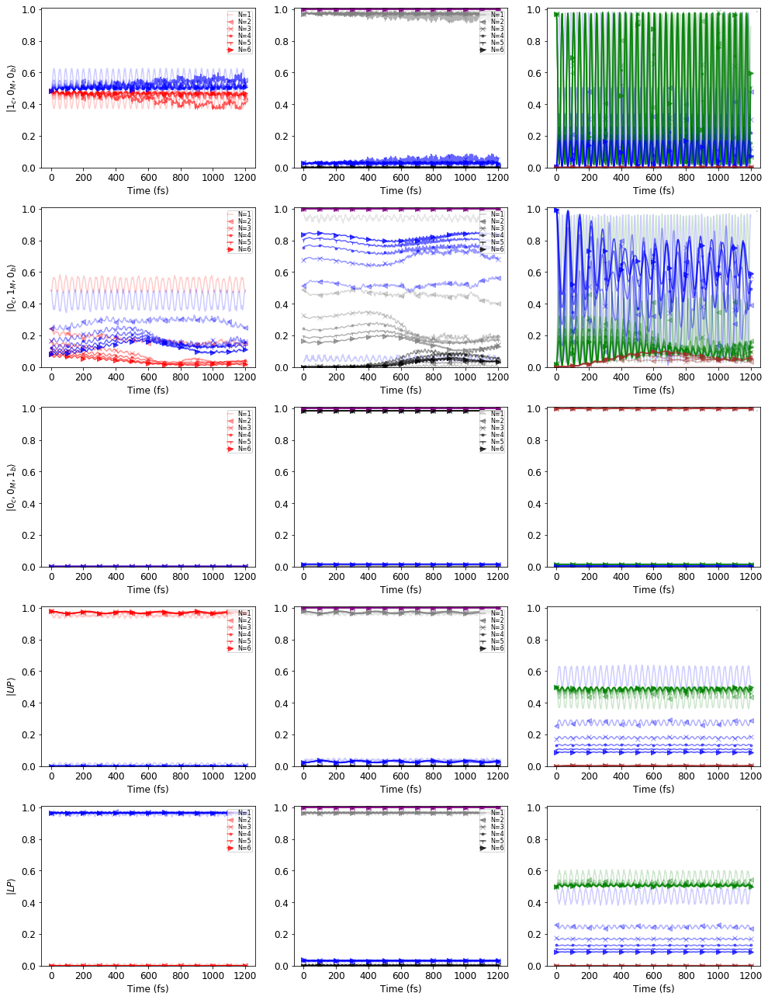

In [136]:
EXC=[r'$|1_c,0_M,0_b\rangle$',r'$|0_c,1_M,0_b\rangle$',r'$|0_c,0_M,1_b\rangle$',r'$|UP\rangle$',r'$|LP\rangle$']
alp1=[0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0]
mkd1 = ['','<','x','.','1','>','']
clrP=['blue','red']
Vlbt=2
t1 = arange(0,1200+0.5,0.5)

fig, ax = plt.subplots(5,3,figsize=(14,18)) #, sharex=True)
for i in range(len(Ext)):
#    for k in range(len(Beta)):
    for j in range(len(N_m2)):
#    for j in (0,2,4,6):
        ax[i,0].plot(t1,UP2[j,i,Vlbt],color='red',alpha=alp1[j],marker=mkd1[j],markevery=200,label=r'N={}'.format(j+1))
        ax[i,0].plot(t1,LP2[j,i,Vlbt],color='blue',alpha=alp1[j],marker=mkd1[j],markevery=200)
        
        ax[i,1].plot(t1,GS2[j,i,Vlbt],color='black',alpha=alp1[j],marker=mkd1[j],markevery=200,label=r'N={}'.format(j+1))
        ax[i,1].plot(t1,FS2[j,i,Vlbt],color='purple',alpha=alp1[j],marker=mkd1[j],markevery=200)
        ax[i,1].plot(t1,POL2[j,i,Vlbt],color='grey',alpha=alp1[j],marker=mkd1[j],markevery=200)
        ax[i,1].plot(t1,DARK2[j,i,Vlbt],color='blue',alpha=alp1[j],marker=mkd1[j],markevery=200)

        ax[i,2].plot(t1,Vcv2[j,i,Vlbt,1],color='green',alpha=alp1[j],marker=mkd1[j],markevery=200)
        ax[i,2].plot(t1,Vml2[j,i,Vlbt,1],color='blue',alpha=alp1[j],marker=mkd1[j],markevery=200)
        ax[i,2].plot(t1,Vho2[j,i,Vlbt,:,1],color='brown',alpha=alp1[j],marker=mkd1[j],markevery=200)

 #           for p in (1,2):
 #               ax[2].plot(TimeC,Model1[i,j,0,p],marker=mkds[p],markevery=50,alpha=alp1[j],color=colors[i],label=r'1{}_{}'.format(EXC[i],Beta[j])if p == 1 else "")

for i in range(len(Ext)):
    myplotparams(ax[i,0],12,'Time (fs)',r'{}'.format(EXC[i]))
    ax[i,0].set_ylim(0.0,1.01)
    #ax[i,1].set_ylim(0.8,1.21)
    for m in (1,2):
        myplotparams(ax[i,m],12,'Time (fs)','')
        ax[i,m].set_ylim(0.0,1.01)

#         ax[j,k].axvline(x=1034.4, color='grey', linestyle='--')

#
# ax[0].legend(bbox_to_anchor=(0.01, 1.2,2, -0.05),ncol=7,mode="expand")
plt.tight_layout()
# plt.subplots_adjust(wspace=.0)
# plt.savefig('spectraparaHW_molsgs1234-10.png', dpi=600,bbox_inches='tight')    
plt.show()

## 1.1.1 Coupling  $\alpha \hat{Q}_1 \hat{q}_m$ , $\beta \hat{Q}_1 \hat{q}_m^2$, $\gamma \hat{Q}_1^2 \hat{q}_m$ & $\delta \hat{Q}_1^2 \hat{q}_m^2$ 

$\alpha=\beta=\gamma=\delta=20cm^{-1}$,$N=1$  

$\hbar \Omega_R = \hbar \omega_1 = 463 cm^{-1} $

In [ ]:
coup=[r'$\alpha$',r'$\beta$',r'$\gamma$',r'$\delta$','all']
alpC = [0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0]
mkdsC = ['x','.','','<']

fig, ax = plt.subplots(4,3,figsize=(14,16)) #, sharex=True)
for i in range(len(Ext)):
    for j in range(len(str3)-1): 
 #   for j in (5,6,7,8,9): 
        ax[i,0].plot(TimeC,CavC[i,j,0,1],marker=mkdsC[j],markevery=100,alpha=alpC[j],color='mediumturquoise',label=r'$|0_C \rangle $' if j==3 else "")
        ax[i,0].plot(TimeC,CavC[i,j,0,2],marker=mkdsC[j],markevery=100,alpha=alpC[j],color='mediumvioletred',label=r'$|1_C \rangle$' if j==3 else "")
        ax[i,1].plot(TimeC,ExcC[i,j,0,1],marker=mkdsC[j],markevery=100,alpha=alpC[j],color='mediumturquoise')
        ax[i,1].plot(TimeC,ExcC[i,j,0,2],marker=mkdsC[j],markevery=100,alpha=alpC[j],color='mediumvioletred',label=r'{}'.format(coup[j]))
        ax[i,2].plot(TimeC,Bas2C[i,j,0,:,0],marker=mkdsC[j],markevery=100,alpha=alpC[j],color='mediumturquoise')
        ax[i,2].plot(TimeC,Bas2C[i,j,0,:,1],marker=mkdsC[j],markevery=100,alpha=alpC[j],color='mediumvioletred')
        for p in (0,1):
            for m in (0,1,2):
                ax[i,m].plot(TimeC,ModelC[i,j,0,p+1],marker=mkdsC[j],markevery=100,alpha=alpC[j],color=clrs[p],label=r'$ |UP \rangle $' if m==2 and j==3 and p==0 else "")
                ax[i,m].plot(TimeC,ModelC[i,j,0,p+1],marker=mkdsC[j],markevery=100,alpha=alpC[j],color=clrs[p],label=r'$ |LP \rangle $' if m==2 and j==3 and p==1 else "")

for m in (0,1,2):
    ax[0,m].set_title(r'{}'.format(Otls[m]),fontsize=16)    
    for i in range(len(Ext)):
        myplotparams(ax[i,m],12,'Time (fs)',r'Exitation {}'.format(Titles[i]))
        ax[i,m].set_ylim(-0.04,1.04)
        ax[i,m].set_xlim(-0.1,800)

        
plt.tight_layout()
# plt.subplots_adjust(wspace=.0)
# plt.savefig('spectraparaHW_molsgs1234-10.png', dpi=600,bbox_inches='tight')    
plt.show()

## 1.1.2 Coupling  $\beta \hat{Q}_1 \hat{q}_m^2$ , $N=1$ , $ \hbar \Omega_R = \hbar \omega_1 = 463 cm^{-1} $

In [ ]:
fig, ax = plt.subplots(4,3,figsize=(14,16)) #, sharex=True)
for i in range(len(Ext)):
    #for j in range(len(Beta)): 
    #for j in (0,3,6,9): 
    for j in (0,1,2,3,4): 
 #   for j in (5,6,7,8,9): 
        ax[i,0].plot(TimeC,Cavr[i,j,0,1],marker=mkds[j],markevery=100,alpha=alp1[j],color='mediumturquoise',label=r'$|0_C \rangle $' if j==3 else "")
        ax[i,0].plot(TimeC,Cavr[i,j,0,2],marker=mkds[j],markevery=100,alpha=alp1[j],color='mediumvioletred',label=r'$|1_C \rangle$' if j==3 else "")
        ax[i,1].plot(TimeC,Excr[i,j,0,1],marker=mkds[j],markevery=100,alpha=alp1[j],color='mediumturquoise')
        ax[i,1].plot(TimeC,Excr[i,j,0,2],marker=mkds[j],markevery=100,alpha=alp1[j],color='mediumvioletred',label=r'$\beta$ ={}'.format(Beta[j]))
        ax[i,2].plot(TimeC,Bas2r[i,j,0,:,0],marker=mkds[j],markevery=100,alpha=alp1[j],color='mediumturquoise')
        ax[i,2].plot(TimeC,Bas2r[i,j,0,:,1],marker=mkds[j],markevery=100,alpha=alp1[j],color='mediumvioletred')
        for p in (0,1):
            for m in (0,1,2):
                ax[i,m].plot(TimeC,Modelr[i,j,0,p+1],marker=mkds[j],markevery=100,alpha=alp1[j],color=clrs[p],label=r'$ |UP \rangle $' if m==2 and j==3 and p==0 else "")
                ax[i,m].plot(TimeC,Modelr[i,j,0,p+1],marker=mkds[j],markevery=100,alpha=alp1[j],color=clrs[p],label=r'$ |LP \rangle $' if m==2 and j==3 and p==1 else "")

for m in (0,1,2):
    ax[0,m].set_title(r'{}'.format(Otls[m]),fontsize=16)    
    for i in range(len(Ext)):
        myplotparams(ax[i,m],12,'Time (fs)',r'Exitation {}'.format(Titles[i]))
        ax[i,m].set_ylim(-0.04,1.04)
        ax[i,m].set_xlim(-0.1,800)

        
plt.tight_layout()
# plt.subplots_adjust(wspace=.0)
# plt.savefig('spectraparaHW_molsgs1234-10.png', dpi=600,bbox_inches='tight')    
plt.show()

## 1.1.1 Morse Potential coupled to Ohmic Bath 

In [10]:
#Modefiable variables
N_k = 60              # Number of HO in the Bath
I_G = [50,150,1500]           # Inverso de Gamma [fs] --> Coupling strength
#----------------------------------------------------------------------
#Important convertions
fs_au = 41.341374575751       # 1 fs in au
au_eV = 27.21138386           # 1 au in ev 
au_fs = 0.0241888             # 1 au in fs 

#Fixed parameters
alp = 2.0                     # Alpha - Morse Potential (MP)
D_z = 0.018                   # Effective Potential Energy - Counter Potentail        
M_z = 100000                  # Mass of Molecule
m_k = 10000                   # Mass of each HO in the bath
z_d = 0.09129                 # Displacement - MP - Counter Potential

# Parameters dependent on Fixed ones
Ome = alp*((2*D_z/M_z)**0.5)  # Frequency of MP
Xhi = (alp**2)/(2*M_z)        # Anharmonicity of the system
w_f = 2.5*Ome                 # Wn Frequency - Last highest frequency of the bath
z_0 = z_d*2                   # Displacement of HO - Counter Potential

cnt = ((2*m_k*M_z*(w_f**3))/(pi))**0.5 # Constant part of Ck
#--------------------------------------------------------------------
def EnerMP(ome,xhi,n): 
    return (ome*(n+0.5))-(xhi*(n+0.5)**2)-D_z # Energy of v MP
#----------------------------------------------------------------------
def Param(n_k,i_G):
    IGau = i_G*fs_au           # Inverso de Gamma [au]
    kap  = arange(1,n_k+1)    # Counter for HO in the Bath k=1,...,N
    D_w  = w_f/n_k            # Delta frequency
    w_k  = D_w*kap            # Frecuency for each HO in the Bath
    Nc_k = kap/n_k            # Kappa / N 

    c_z = cnt/(((IGau*n_k)**0.5))
    C_k = Nc_k*c_z
    X_0 = (C_k/(m_k*(w_k**2)))*((1-(e**(-alp*z_0)))/alp)  # Displmnt HO Bath
    return kap, w_k, Nc_k, c_z , X_0

#----------------------------------------------------------------------

C_z = zeros((len(I_G)))
x_0 = zeros((len(I_G),N_k))

for i in range(len(I_G)):
    Kap, W_k, nc_k, C_z[i], x_0[i] = Param(N_k,I_G[i])
#----------------------------------------------------------------------

nmod10 = int(N_k/10)
mod = np.full((nmod10), 4)
mod[0]=3
mod[nmod10-1]=3

In [11]:
def EnerMP(ome,xhi,n): 
    return (ome*(n+0.5))-(xhi*(n+0.5)**2)-D_z # Energy of v MP
def TrEnMP(ome,xhi,n2,m1):
    return (ome*(n2-m1))*(1-(xhi*(n2+m1+0.5))) # Transition Energy v1-v0 MP

In [12]:
def yMP(zmin,zmax,dz,z,y):
    z1=arange(zmin,zmax,dz)
    p=zeros((len(z1)))
    
    p=D_z*(exp(-2*alp*z1)-(2*exp(-alp*z1)))
    
    for i in range(len(z1)): 
        print(z1[i]) if y==p[i] else ""  

In [13]:
Z1 = arange(-0.5,20,0.00002)
MP = zeros((len(Z1)))
# print(Z1)
# for z in arange(-5,len(Z1+5),0.02):
#     MP[z]=D_z*(exp(-2*alp*z)-(2*exp(-alp*z)))

fig, ax1 = plt.subplots(1,figsize=(10,8))
ax1.plot(Z1,D_z*(exp(-2*alp*Z1)-(2*exp(-alp*Z1))),color='tomato',label=r'$V_{1} (R)$')
ax1.set_xlim(-0.5,4)
ax1.set_xlabel('Z [au]')
ax1.set_ylabel('V(Z) [au]')
ax1.set_ylim(-0.02,0.01)
for y in range(28):
    ax1.axhline(y=EnerMP(Ome,Xhi,y), xmin=-0.50, xmax=0.50, color='lightblue', linestyle='-')
plt.show()
# ax1.plot(rgrid,0.5*om2*(rgrid-5.0)**2-250,color='steelblue',label=r'$V_{2} (R)$')

AttributeError: 'str' object has no attribute 'subplots'

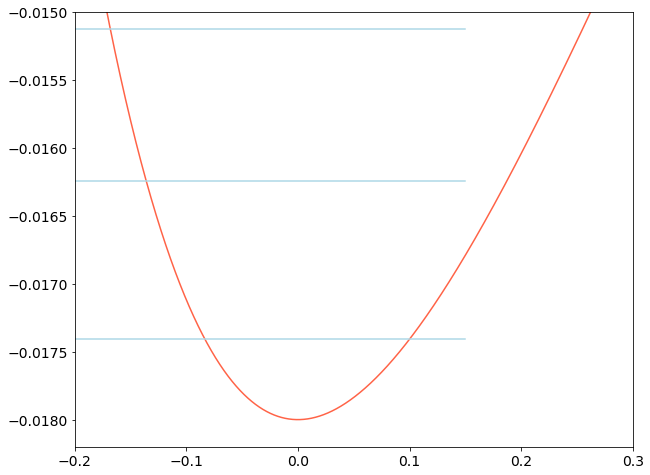

In [325]:
Z1 = arange(-0.5,20,0.00002)
MP = zeros((len(Z1)))
# print(Z1)
# for z in arange(-5,len(Z1+5),0.02):
#     MP[z]=D_z*(exp(-2*alp*z)-(2*exp(-alp*z)))

fig, ax1 = plt.subplots(1,figsize=(10,8))
ax1.plot(Z1,D_z*(exp(-2*alp*Z1)-(2*exp(-alp*Z1))),color='tomato',label=r'$V_{1} (R)$')
ax1.set_xlim(-0.2,0.3)
ax1.set_ylim(-0.0182,-0.015)
for y in range(28):
    ax1.axhline(y=EnerMP(Ome,Xhi,y), xmin=-0.50, xmax=0.70, color='lightblue', linestyle='-')
plt.show()
# ax1.plot(rgrid,0.5*om2*(rgrid-5.0)**2-250,color='steelblue',label=r'$V_{2} (R)$')

In [378]:
for i in range(N_k):
    zpeHO=(sum(W_k[i]/2))
print(zpeHO)
print((D_z-zpeHO)*au_eV)
# print((EnerMP(Ome,Xhi,0)+zpeHO))
# print((EnerMP(Ome,Xhi,1)+zpeHO))
# print((EnerMP(Ome,Xhi,0)zpeHO)*au_eV)
# print((EnerMP(Ome,Xhi,1)+zpeHO)*au_eV)
# print((EnerMP(Ome,Xhi,1)+EnerMP(Ome,Xhi,0))*au_eV)
# print((EnerMP(Ome,Xhi,1)+EnerMP(Ome,Xhi,0)+(2.5)*zpeHO)*au_eV)
# print((EnerMP(Ome,Xhi,2)+EnerMP(Ome,Xhi,1)+EnerMP(Ome,Xhi,0)+zpeHO)*au_eV)

0.0014999999999999998
-0.44898783368999995


In [396]:
# 0.812407/au_eV
# print((EnerMP(Ome,Xhi,0)/2)*au_eV)
# print((zpeHO+0.018)*au_eV)
print((0.771684)-(EnerMP(Ome,Xhi,1)-EnerMP(Ome,Xhi,0))*au_eV)

0.7401187947223999


In [537]:
#SPECTRA
import pandas as pd
import matplotlib.pyplot as plt
import array
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

efinalC = 0.15
dtC     = 0.00019980019
Enrspec   = arange(-0.05,efinalC-dtC,dtC)
Egrid  = int(((efinalC+0.05)/dtC))

tfinalC = 1500
dtfC    = 2.0
TimeC   = arange(0.0,tfinalC+dtfC,dtfC)
Tgrid  = int(((tfinalC+dtfC)/dtfC))

afinal = 3000
dta    = 4.0
Timea  = arange(0.0,afinal+dta,dta)
Agrid  = int(((afinal+dta)/dta))

str1='/worka/johana/Polaritons/Bath/files/'
str2 = 'mp'
str3 = '/'
str4 = ['_g','_ho']
I_G1 = ['50','150','1500']
# I_G1 = ['50','150','1500','0']
nk   = ['10','20','30','40','50','60','70']
plt1 = ['_spec.dat','_f1all.dat','_f1_P12a.dat','_impz.dat','_posit.dat','_mode1.dat','_enersub.dat','_enersubin.dat','_auto.dat']

Spec  = zeros((len(I_G1),len(nk),2,Egrid))
Auto  = zeros((len(I_G1),len(nk),2,Agrid))
#F1all = str1+str2+str4[0]+nk[j]+str4[1]+I_G1[i]+plt[1]
#F1P12 = str1+str2+str4[0]+nk[j]+str4[1]+I_G1[i]+plt[2]
Impz  = zeros((len(I_G1),len(nk),2,Tgrid))
Posit = zeros((len(I_G1),len(nk),2,Tgrid))
Mode1 = zeros((len(I_G1),len(nk),2,Tgrid))
Ensb  = zeros((len(I_G1),len(nk),2,Tgrid))
Ensin = zeros((len(I_G1),len(nk),2,Tgrid))

for i in range(len(I_G1)):
    for j in range(len(nk)):
        auto=str1+str2+str4[0]+nk[j]+str4[1]+I_G1[i]+plt1[8]
        ptemp = pd.read_csv(auto,'\s+',header=None,skiprows=1)
        Auto[i,j,0]=ptemp[0].values
        Auto[i,j,1]=ptemp[1].values
        Auto[i,j,1]=ptemp[3].values
        
        spec=str1+str2+str4[0]+nk[j]+str4[1]+I_G1[i]+plt1[0]
        ptemp = pd.read_csv(spec,'\s+',header=None,skiprows=3)
        Spec[i,j,0]=ptemp[0].values
        Spec[i,j,1]=ptemp[2].values

        impz=str1+str2+str4[0]+nk[j]+str4[1]+I_G1[i]+plt1[3]
#         print(impz)
        ptemp = pd.read_csv(impz,'\s+',header=None,skiprows=7)
        Impz[i,j,0]=ptemp[0].values
        Impz[i,j,1]=ptemp[3].values
#             
        posit=str1+str2+str4[0]+nk[j]+str4[1]+I_G1[i]+plt1[4]
        ptemp = pd.read_csv(posit,'\s+',header=None,skiprows=7)
        Posit[i,j,0]=ptemp[0].values
        Posit[i,j,1]=ptemp[1].values
#             
        mode1=str1+str2+str4[0]+nk[j]+str4[1]+I_G1[i]+plt1[5]
        ptemp = pd.read_csv(mode1,'\s+',header=None,skiprows=7)
        Mode1[i,j,0]=ptemp[0].values
        Mode1[i,j,1]=ptemp[1].values
            
        enersub=str1+str2+str4[0]+nk[j]+str4[1]+I_G1[i]+plt1[6]
        ptemp = pd.read_csv(enersub,'\s+',header=None,skiprows=7)
        Ensb[i,j,0]=ptemp[0].values
        Ensb[i,j,1]=ptemp[1].values
            
        enersubint=str1+str2+str4[0]+nk[j]+str4[1]+I_G1[i]+plt1[7]
        ptemp = pd.read_csv(enersubint,'\s+',header=None,skiprows=7)
        Ensin[i,j,0]=ptemp[0].values
        Ensin[i,j,1]=ptemp[1].values
            
#             f1all=str1+str2+str4[0]+nk[j]+str4[1]+I_G1[i]+plt1[1]
#             f1P12=str1+str2+str4[0]+nk[j]+str4[1]+I_G1[i]+plt1[2]

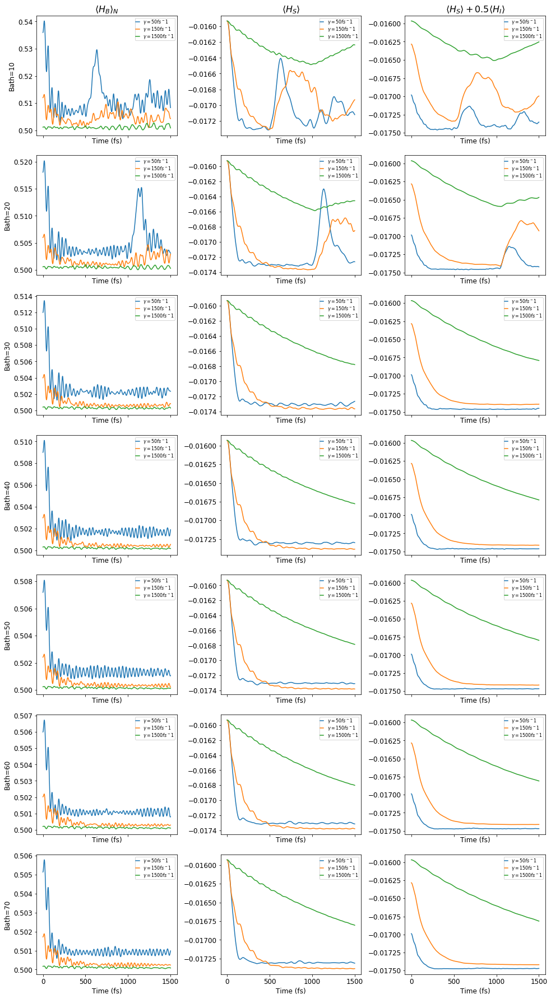

In [538]:
# n_k  = [10,20,30,40,50,60,70]

fig, ax = plt.subplots(7,3,figsize=(14,25),sharex=True) #, sharex=True)
for j in range(len(nk)):
    for i in range(len(I_G1)):
        ax[j,0].plot(TimeC,Mode1[i,j,1],label=r'$\gamma={}fs^-1$'.format(I_G1[i]))
#         ax[j,0].plot(TimeC,Mode1[i,j,1],label=r'$\gamma={}fs^-1$'.format(I_G1[i]))
        ax[j,1].plot(TimeC,Ensb[i,j,1],label=r'$\gamma={}fs^-1$'.format(I_G1[i]))
        ax[j,2].plot(TimeC,Ensin[i,j,1],label=r'$\gamma={}fs^-1$'.format(I_G1[i]))
        
#         ax[j].text(-0.040,6000,'Bath-No={}'.format(nk[j]),fontsize=15)
    myplotparams(ax[j,0],12,'Time (fs)','')
    myplotparams(ax[j,1],12,'Time (fs)','')
    myplotparams(ax[j,2],12,'Time (fs)','')
    ax[j,0].set_ylabel('Bath={}'.format(nk[j]))

ax[0,0].set_title(r'$\langle H_{B} \rangle_{N} $',fontsize=16)
ax[0,1].set_title(r'$\langle H_{S} \rangle$',fontsize=16)
ax[0,2].set_title(r'$\langle H_{S} \rangle + 0.5\langle H_{I} \rangle$',fontsize=16)

#         ax[j,k].set_xlim(400,1600)
#         ax[j,k].axvline(x=924.8, color='grey', linestyle='--')
#         ax[j,k].axvline(x=1034.4, color='grey', linestyle='--')

#
# ax[0].legend(bbox_to_anchor=(0.01, 1.2,2, -0.05),ncol=7,mode="expand")
plt.tight_layout()
# plt.subplots_adjust(wspace=.0)
# plt.savefig('spectraparaHW_molsgs1234-10.png', dpi=600,bbox_inches='tight')    
plt.show()

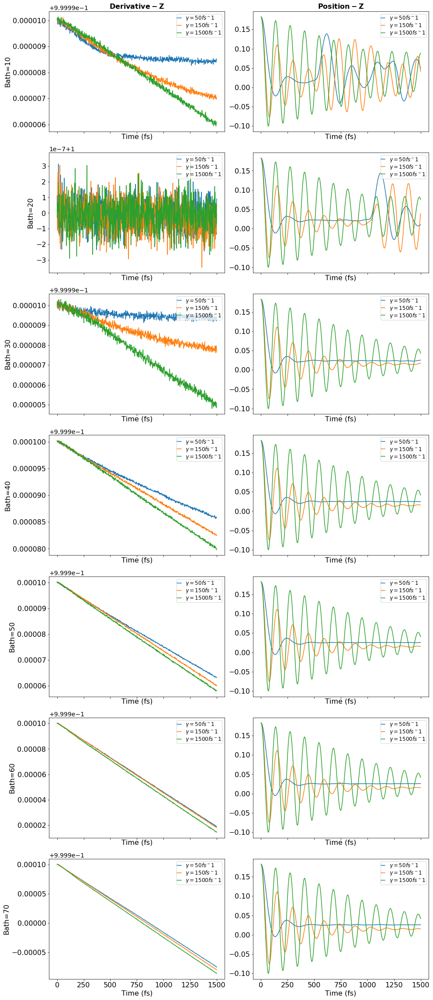

In [516]:
fig, ax = plt.subplots(7,2,figsize=(14,32),sharex=True) #, sharex=True)

for j in range(len(nk)):
    for i in range(len(I_G1)):
        ax[j,0].plot(TimeC,Impz[i,j,1],label=r'$\gamma={}fs^-1$'.format(I_G1[i]))
        ax[j,1].plot(TimeC,Posit[i,j,1],label=r'$\gamma={}fs^-1$'.format(I_G1[i]))
#         ax[j].text(-0.040,6000,'Bath-No={}'.format(nk[j]),fontsize=15)
    myplotparams(ax[j,0],16,'Time (fs)','')
    myplotparams(ax[j,1],16,'Time (fs)','')
    ax[j,0].set_ylabel('Bath={}'.format(nk[j]))

ax[0,0].set_title(r'$\mathbf{Derivative-Z}$',fontsize=16)
ax[0,1].set_title(r'$\mathbf{Position-Z}$',fontsize=16)

#         ax[j,k].set_xlim(400,1600)
#         ax[j,k].axvline(x=924.8, color='grey', linestyle='--')
#         ax[j,k].axvline(x=1034.4, color='grey', linestyle='--')

#
# ax[0].legend(bbox_to_anchor=(0.01, 1.2,2, -0.05),ncol=7,mode="expand")
plt.tight_layout()
# plt.subplots_adjust(wspace=.0)
# plt.savefig('spectraparaHW_molsgs1234-10.png', dpi=600,bbox_inches='tight')    
plt.show()

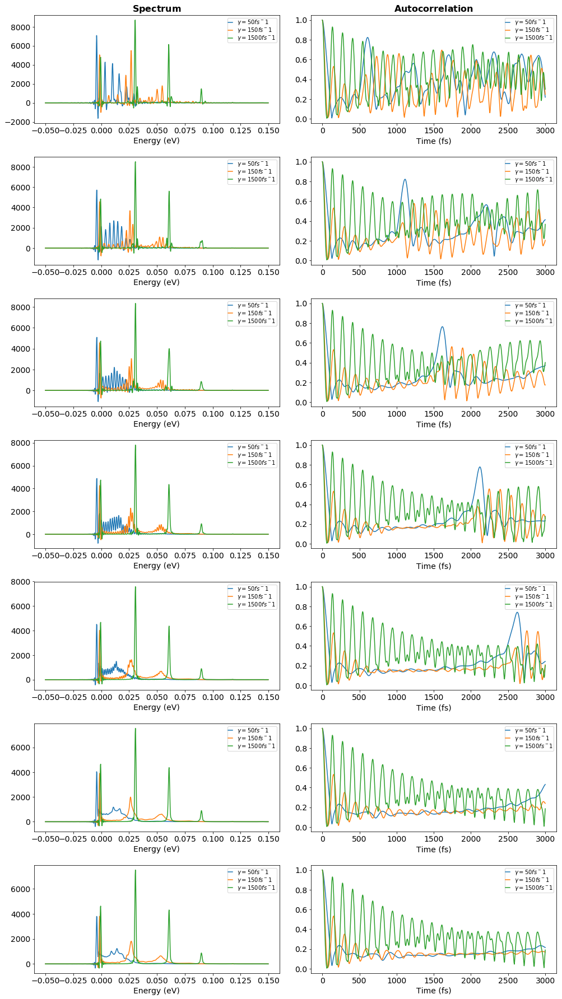

In [528]:
fig, ax = plt.subplots(7,2,figsize=(14,25)) #, sharex=True)

for j in range(len(nk)):
    for i in range(len(I_G1)):
        ax[j,0].plot(Enrspec,Spec[i,j,1],label=r'$\gamma={}fs^-1$'.format(I_G1[i]))
        ax[j,1].plot(Timea,Auto[i,j,1],label=r'$\gamma={}fs^-1$'.format(I_G1[i]))
#         ax[j,0].text(-0.040,6000,'Bath-No={}'.format(nk[j]),fontsize=15)
    myplotparams(ax[j,0],14,'Energy (eV)','')
    myplotparams(ax[j,1],14,'Time (fs)','')

#         ax[j,k].set_xlim(400,1600)
#         ax[j,k].axvline(x=924.8, color='grey', linestyle='--')
#         ax[j,k].axvline(x=1034.4, color='grey', linestyle='--')
ax[0,0].set_title(r'$\mathbf{Spectrum}$',fontsize=16)
ax[0,1].set_title(r'$\mathbf{Autocorrelation}$',fontsize=16)


#
# ax[0].legend(bbox_to_anchor=(0.01, 1.2,2, -0.05),ncol=7,mode="expand")
plt.tight_layout()
# plt.subplots_adjust(wspace=.0)
# plt.savefig('spectraparaHW_molsgs1234-10.png', dpi=600,bbox_inches='tight')    
plt.show()

In [399]:
for n in (0,1,2,3,4,5):
#     print(EnerMP(Ome,Xhi,n))
    print(EnerMP(Ome,Xhi,n)*au_eV)    
#     print(round(2*(EnerMP(Ome,Xhi,n))*au_eV,4))    
#     print((EnerMP(Ome,Xhi,n)-zpeHO)*au_eV)    
#     print((EnerMP(Ome,Xhi,n)/2)*au_eV)    
#     print((D_z+EnerMP(Ome,Xhi,n))*au_eV)    
#     print(TrEnMP(Ome,Xhi,n+1,n)*au_eV)    
#     print((EnerMP(Ome,Xhi,n+1)-EnerMP(Ome,Xhi,n))*au_eV)
# print(Ome*au_eV)
# print(Ome*au_eV/2)

-0.47361413608330005
-0.4420489308057
-0.4115721808825
-0.3821838863137
-0.3538840470993
-0.3266726632393


In [ ]:
ReEner=zeros((n))
ReEner=(ome*(n+0.5))-(xhi*(n+0.5)**2)-D_z


In [170]:
# corre=(1-((3*Xhi*HB)/(Ome)))
corre1=(1-((3*Xhi)/(Ome)))
corre2=(1-((2*Xhi)/(Ome)))
# corre=(1-((3*Xhi)/(0.0012)))
print(corre1*corre2)

0.9183333333333333


In [168]:
HB=1.0545718*(10**(-34))

In [207]:
A_ener=zeros((len(I_G)))
I_G1 = [54,163,1630]           # Inverso de Gamma [fs] --> Coupling strength

for i in range(len(I_G)):
    A_ener[i]=(M_z*w_f)/((I_G[i]*fs_au)*pi*(alp**2))
# print(D_z - A_ener)
    print(I_G1[i]*0.92,I_G[i]*0.92,I_G[i]/0.92)

49.68 46.0 54.347826086956516
149.96 138.0 163.04347826086956
1499.6000000000001 1380.0 1630.4347826086955


[3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 5, 5, 5, 5, 5, 5, 4, 4, 4, 4, 4, 4, 4, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3]
4


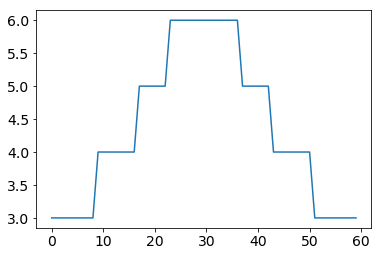

In [195]:
import math

N_k=60
pnt_ho1= zeros((N_k))
# pnt_ho = signal.gaussian(N_k, std=11)
pnt_ho = signal.gaussian(N_k, std=(-1+N_k/5))
pnt_ho = (pnt_ho*3)+3

for i in range(N_k):
    pnt_ho[i]=round(pnt_ho[i])

pnt_ho1 = [math.trunc(value) for value in pnt_ho]

plt.plot(pnt_ho)
print((pnt_ho1))
print(math.trunc(pnt_ho[10]))

In [80]:
my_K = []
my_Wk = []
my_Ck = []
my_X0 = []

for i in range(N_k):
    my_K.append(Kap[i])
    my_Wk.append(round(W_k[i],6))
    my_Ck.append(round(C_k[i],7))
    my_X0.append(round(x_0[i],4))
    
t_1=Table([my_K,my_Wk,my_Ck,my_X0],names=(r'$\kappa$',r'$\omega_\kappa$',r'$c_\kappa$',r'$x_0$'))
print(x_0)t_1

$\kappa$,$\omega_\kappa$,$c_\kappa$,$x_0$
int64,float64,float64,float64
1,5e-05,6.2e-05,0.3796
2,0.0001,0.0001241,0.1898
3,0.00015,0.0001861,0.1265
4,0.0002,0.0002482,0.0949
5,0.00025,0.0003102,0.0759
6,0.0003,0.0003723,0.0633
7,0.00035,0.0004343,0.0542
8,0.0004,0.0004964,0.0475
9,0.00045,0.0005584,0.0422


In [205]:
half=int(N_k/20)
mod1 = np.full((half), 4)
print(mod1[:])

[4 4 4]


In [203]:
print('mlbasis-section')
print('0> 4 4')
print('  1> [Z]')
print('  1> 4 4')
for p in (0,1):
    print('    2> {}'.format(mod1[:]))

    for l in range(half):
        print('      3> 3 3')
        for k in (0,1):
            print('        4> 3 3')
            print('          5> [q{} q{}]'.format(1+(k*5)+(10*l),2+(k*5)+(10*l)))
            print('          5> [q{} q{} q{}]'.format(3+(k*5)+(10*l),4+(k*5)+(10*l),5+(k*5)+(10*l)))
print('end-mlbasis-section')


mlbasis-section
0> 4 4
  1> [Z]
  1> 4 4
    2> [4 4 4]
      3> 3 3
        4> 3 3
          5> [q1 q2]
          5> [q3 q4 q5]
        4> 3 3
          5> [q6 q7]
          5> [q8 q9 q10]
      3> 3 3
        4> 3 3
          5> [q11 q12]
          5> [q13 q14 q15]
        4> 3 3
          5> [q16 q17]
          5> [q18 q19 q20]
      3> 3 3
        4> 3 3
          5> [q21 q22]
          5> [q23 q24 q25]
        4> 3 3
          5> [q26 q27]
          5> [q28 q29 q30]
    2> [4 4 4]
      3> 3 3
        4> 3 3
          5> [q1 q2]
          5> [q3 q4 q5]
        4> 3 3
          5> [q6 q7]
          5> [q8 q9 q10]
      3> 3 3
        4> 3 3
          5> [q11 q12]
          5> [q13 q14 q15]
        4> 3 3
          5> [q16 q17]
          5> [q18 q19 q20]
      3> 3 3
        4> 3 3
          5> [q21 q22]
          5> [q23 q24 q25]
        4> 3 3
          5> [q26 q27]
          5> [q28 q29 q30]
end-mlbasis-section


In [71]:
print('mlbasis-section')
print('0> 4 4')
print('  1> [Z]')
for l in range(nmod10):
    print('    2> 3 3')
    for k in (0,1):
        print('      3> 3 3')
        print('        4> [q{} q{}]'.format(1+(k*5)+(10*l),2+(k*5)+(10*l)))
        print('        4> [q{} q{} q{}]'.format(3+(k*5)+(10*l),4+(k*5)+(10*l),5+(k*5)+(10*l)))
print('end-mlbasis-section')


mlbasis-section
0> 4 4
  1> [Z]
    2> 3 3
      3> 3 3
        4> [q1 q2]
        4> [q3 q4 q5]
      3> 3 3
        4> [q6 q7]
        4> [q8 q9 q10]
    2> 3 3
      3> 3 3
        4> [q11 q12]
        4> [q13 q14 q15]
      3> 3 3
        4> [q16 q17]
        4> [q18 q19 q20]
    2> 3 3
      3> 3 3
        4> [q21 q22]
        4> [q23 q24 q25]
      3> 3 3
        4> [q26 q27]
        4> [q28 q29 q30]
    2> 3 3
      3> 3 3
        4> [q31 q32]
        4> [q33 q34 q35]
      3> 3 3
        4> [q36 q37]
        4> [q38 q39 q40]
    2> 3 3
      3> 3 3
        4> [q41 q42]
        4> [q43 q44 q45]
      3> 3 3
        4> [q46 q47]
        4> [q48 q49 q50]
    2> 3 3
      3> 3 3
        4> [q51 q52]
        4> [q53 q54 q55]
      3> 3 3
        4> [q56 q57]
        4> [q58 q59 q60]
end-mlbasis-section


In [73]:
for j in range(len(I_G)):
    print('INIT_WF-SECTION')
    print('build')
    print('{:<6} {:^5} {:^5} {:^10} {:^10}'.format('Z','gauss',z_0,'0.0','0.0645497'))
    for i in range(N_k):
        print('q{:<5} {:^5} {:^5,.4f} {:^10} {:^10,.6f} {:>5}'.format(Kap[i],'HO',x_0[j,i],'0.0',W_k[i],m_k))

INIT_WF-SECTION
build
Z      gauss 0.18258    0.0     0.0645497 
q1      HO   1.2005    0.0      0.000050  10000
q2      HO   0.6002    0.0      0.000100  10000
q3      HO   0.4002    0.0      0.000150  10000
q4      HO   0.3001    0.0      0.000200  10000
q5      HO   0.2401    0.0      0.000250  10000
q6      HO   0.2001    0.0      0.000300  10000
q7      HO   0.1715    0.0      0.000350  10000
q8      HO   0.1501    0.0      0.000400  10000
q9      HO   0.1334    0.0      0.000450  10000
q10     HO   0.1200    0.0      0.000500  10000
q11     HO   0.1091    0.0      0.000550  10000
q12     HO   0.1000    0.0      0.000600  10000
q13     HO   0.0923    0.0      0.000650  10000
q14     HO   0.0857    0.0      0.000700  10000
q15     HO   0.0800    0.0      0.000750  10000
q16     HO   0.0750    0.0      0.000800  10000
q17     HO   0.0706    0.0      0.000850  10000
q18     HO   0.0667    0.0      0.000900  10000
q19     HO   0.0632    0.0      0.000950  10000
q20     HO   0.0600    

In [52]:
print('OP_DEFINE-section\n' 'title' '1dsys-prop, {} ohmic bath\n' 'end-title\n' 'end-OP_DEFINE-section\n'.format(N_k))

print('PARAMETER-SECTION\n' 'alfaz = {}\n' 'mass = {}\n' 'm2 = {}\n' 'mass_Z = mass'.format(alp,M_1,B_1))
for i in range(N_k):
    print('mass_q{} = m2'.format(i+1))
for i in range(N_k):    
    print('omq{} = {:.6f}'.format(i+1,W_k[i]))
print('e0z = {}\n' 'cz = {:.8f}\n' 'end-parameter-section'.format(A_D,C_z))


OP_DEFINE-section
title1dsys-prop, 60 ohmic bath
end-title
end-OP_DEFINE-section

PARAMETER-SECTION
alfaz = 2.0
mass = 100000
m2 = 10000
mass_Z = mass
mass_q1 = m2
mass_q2 = m2
mass_q3 = m2
mass_q4 = m2
mass_q5 = m2
mass_q6 = m2
mass_q7 = m2
mass_q8 = m2
mass_q9 = m2
mass_q10 = m2
mass_q11 = m2
mass_q12 = m2
mass_q13 = m2
mass_q14 = m2
mass_q15 = m2
mass_q16 = m2
mass_q17 = m2
mass_q18 = m2
mass_q19 = m2
mass_q20 = m2
mass_q21 = m2
mass_q22 = m2
mass_q23 = m2
mass_q24 = m2
mass_q25 = m2
mass_q26 = m2
mass_q27 = m2
mass_q28 = m2
mass_q29 = m2
mass_q30 = m2
mass_q31 = m2
mass_q32 = m2
mass_q33 = m2
mass_q34 = m2
mass_q35 = m2
mass_q36 = m2
mass_q37 = m2
mass_q38 = m2
mass_q39 = m2
mass_q40 = m2
mass_q41 = m2
mass_q42 = m2
mass_q43 = m2
mass_q44 = m2
mass_q45 = m2
mass_q46 = m2
mass_q47 = m2
mass_q48 = m2
mass_q49 = m2
mass_q50 = m2
mass_q51 = m2
mass_q52 = m2
mass_q53 = m2
mass_q54 = m2
mass_q55 = m2
mass_q56 = m2
mass_q57 = m2
mass_q58 = m2
mass_q59 = m2
mass_q60 = m2
omq1 = 0.000050
om

In [139]:
print('HAMILTONIAN-section\n')

for i in range(N_k):
    print('1.0               |' '{}  KE'.format(i+1))
print('1.0               |1  morsez ')
for i in range(N_k):
    print('m2*omq{}*omq{}/2.0  |{}  q^2 '.format(i+1,i+1,i+2))
for i in range(N_k):
    print('-{:7f}*cz/alfaz   |1 expz  |{} q'.format(nc_k[i],i+2))
print('end-HAMILTONIAN-section\n')

print('labels-section\n' 'morsez = morse1[e0z,alfaz,0.0,-e0z]\n' 'expz = exp1[-alfaz,0.0]\n' 'end-labels-section\n')
print('HAMILTONIAN-section_enersub\n' 'modes |  Z\n' '1.0   |  KE\n' '1.0   | morsez\n' 'end-HAMILTONIAN-section\n')

print('HAMILTONIAN-section_enersubint\n')

print('1.0    |  KE\n' '1.0    | morsez')
for i in range(N_k):
    print('-{:7f}*0.5*cz/alfaz   |1 expz  |{} q'.format(nc_k[i],i+2))
print('end-HAMILTONIAN-section\n')

print('HAMILTONIAN-section_impz\n' 'modes  |  Z\n' '1.0    |  dq\n' 'end-HAMILTONIAN-section\n' '\n')
print('HAMILTONIAN-section_posit\n' 'modes  | Z\n' '1.0    | q\n' 'end-HAMILTONIAN-section\n' '\n')
print('HAMILTONIAN-section_mode1\n' 'modes         | q60\n' '1.0/omq60     | KE\n' 'm2*omq60/2.0  | q^2\n' 'end-HAMILTONIAN-section\n' '\n' 'end-operator')


HAMILTONIAN-section

1.0               |1  KE
1.0               |2  KE
1.0               |3  KE
1.0               |4  KE
1.0               |5  KE
1.0               |6  KE
1.0               |7  KE
1.0               |8  KE
1.0               |9  KE
1.0               |10  KE
1.0               |11  KE
1.0               |12  KE
1.0               |13  KE
1.0               |14  KE
1.0               |15  KE
1.0               |16  KE
1.0               |17  KE
1.0               |18  KE
1.0               |19  KE
1.0               |20  KE
1.0               |21  KE
1.0               |22  KE
1.0               |23  KE
1.0               |24  KE
1.0               |25  KE
1.0               |26  KE
1.0               |27  KE
1.0               |28  KE
1.0               |29  KE
1.0               |30  KE
1.0               |31  KE
1.0               |32  KE
1.0               |33  KE
1.0               |34  KE
1.0               |35  KE
1.0               |36  KE
1.0               |37  KE
1.0               |38  KE


In [141]:
print('{:<6} {:^5} {:^5} {:^10} {:^10,.6f} {:>5}'.format('Z','HO','25','0.0',w_f,M_z))
for i in range(N_k):
#     print('q{:<5} {:^5} {:^5} {:^10} {:^10,.6f} {:>5}'.format(Kap[i],'HO',pnt_ho1[N_k],'0.0',W_k[i],m_k))
    print('q{:<5} {:^5} {:^5} {:^10} {:^10,.6f} {:>5}'.format(Kap[i],'HO',pnt_ho1[i],'0.0',W_k[i],m_k))    

Z       HO    25      0.0      0.003000  100000
q1      HO     3      0.0      0.000050  10000
q2      HO     3      0.0      0.000100  10000
q3      HO     3      0.0      0.000150  10000
q4      HO     3      0.0      0.000200  10000
q5      HO     3      0.0      0.000250  10000
q6      HO     3      0.0      0.000300  10000
q7      HO     3      0.0      0.000350  10000
q8      HO     3      0.0      0.000400  10000
q9      HO     3      0.0      0.000450  10000
q10     HO     4      0.0      0.000500  10000
q11     HO     4      0.0      0.000550  10000
q12     HO     4      0.0      0.000600  10000
q13     HO     4      0.0      0.000650  10000
q14     HO     4      0.0      0.000700  10000
q15     HO     4      0.0      0.000750  10000
q16     HO     4      0.0      0.000800  10000
q17     HO     4      0.0      0.000850  10000
q18     HO     5      0.0      0.000900  10000
q19     HO     5      0.0      0.000950  10000
q20     HO     5      0.0      0.001000  10000
q21     HO  

In [26]:
print('INIT_WF-SECTION')
print('build')
print('{:<6} {:^5} {:^5} {:^10} {:^10}'.format('Z','gauss',z_0,'0.0','0.0645497'))
for i in range(N_k):
    print('q{:<5} {:^5} {:^5,.4f} {:^10} {:^10,.6f} {:>5}'.format(Kap[i],'HO',x_0[i],'0.0',W_k[i],B_1))
#     print('q{:<5} {:^5} {:^5} {:^10} {:^10,.6f} {:>5}'.format(Kap[i],'HO','4','0.0',W_k[i],B_1))    
#     print('q{:<5} {:^5} {:^5} {:^10} {:^10,.6f} {:>5}'.format(Kap[i],'HO',x_0,'0.0',W_k[i],B_1))    

INIT_WF-SECTION
build
Z      gauss 0.18258    0.0     0.0645497 
q1      HO   0.3796    0.0      0.000050  10000
q2      HO   0.1898    0.0      0.000100  10000
q3      HO   0.1265    0.0      0.000150  10000
q4      HO   0.0949    0.0      0.000200  10000
q5      HO   0.0759    0.0      0.000250  10000
q6      HO   0.0633    0.0      0.000300  10000
q7      HO   0.0542    0.0      0.000350  10000
q8      HO   0.0475    0.0      0.000400  10000
q9      HO   0.0422    0.0      0.000450  10000
q10     HO   0.0380    0.0      0.000500  10000
q11     HO   0.0345    0.0      0.000550  10000
q12     HO   0.0316    0.0      0.000600  10000
q13     HO   0.0292    0.0      0.000650  10000
q14     HO   0.0271    0.0      0.000700  10000
q15     HO   0.0253    0.0      0.000750  10000
q16     HO   0.0237    0.0      0.000800  10000
q17     HO   0.0223    0.0      0.000850  10000
q18     HO   0.0211    0.0      0.000900  10000
q19     HO   0.0200    0.0      0.000950  10000
q20     HO   0.0190    

In [7]:
for i in range(N_k):
    print('{:<10,.5f} {:^10,.5f} {:>10,.5f}'.format(Kap[i],W_k[i],C_k[i]))

1.00000     0.00005      0.00006
2.00000     0.00010      0.00012
3.00000     0.00015      0.00019
4.00000     0.00020      0.00025
5.00000     0.00025      0.00031
6.00000     0.00030      0.00037
7.00000     0.00035      0.00043
8.00000     0.00040      0.00050
9.00000     0.00045      0.00056
10.00000    0.00050      0.00062
11.00000    0.00055      0.00068
12.00000    0.00060      0.00074
13.00000    0.00065      0.00081
14.00000    0.00070      0.00087
15.00000    0.00075      0.00093
16.00000    0.00080      0.00099
17.00000    0.00085      0.00105
18.00000    0.00090      0.00112
19.00000    0.00095      0.00118
20.00000    0.00100      0.00124
21.00000    0.00105      0.00130
22.00000    0.00110      0.00137
23.00000    0.00115      0.00143
24.00000    0.00120      0.00149
25.00000    0.00125      0.00155
26.00000    0.00130      0.00161
27.00000    0.00135      0.00168
28.00000    0.00140      0.00174
29.00000    0.00145      0.00180
30.00000    0.00150      0.00186
31.00000  

In [106]:
print('L {:<20} R'.format('x'))
# Example 2
print('L {:^20} R'.format('x'))
# Example 3
print('L {:>20} R'.format('x'))

L x                    R
L          x           R
L                    x R



### Spectral Function

In [52]:
e0z   = 0.018
cz    = 0.00372286
alfaz = 2.0

In [21]:
g_g=((cz/w_f)**2)*(pi/(2*M_m*B_m*D_w))
G_au  = 1/g_g
G_fs = G_au/f_au
print(G_fs)

499.98193714150517


In [58]:
#Article
alpha = 2.0
A_enr = 0.018
f_au  = 41.3413746 # 1 ft to au
# f_au  = 41.341374575751 # 1 ft to au

#Variables to modify
N_k = 60         # Number of HO in the Bath
fts = 50         # Coupling strength - It defines Gamma value - [fs]
w_f = 0.003      # Wn Frequency - Last highest frequency of the bath
B_m = 1000      # Mass of each HO in the bath
M_m = 100000     # Mass of Molecule

Fau = fts*f_au   # fs a atomic units
gam = 1/Fau      # Relaxation rate

D_w = w_f/N_k    # Delta frequency
N_1 = 1/N_k      # 1/No HO

#-----------------------------------------------------------------------

kapp = arange(1,N_k+1)   # Kappa   --> Interger that represents each HO in the Bath
w_kp = (kapp)*D_w        # omega_k --> Frequency for each HO in the Bath

cnts = ((2*M_m*B_m*gam*((D_w)**3))/pi)**0.5
c_kp = (kapp)*cnts       # C_k --> Coupling of each HO in the Bath to the Molecule

cnt1 = (((2*M_m*B_m*gam*D_w)/pi)**0.5)*w_f # Aparece en Operador
Ohn = arange(N_1,1+N_1,N_1)
c_k1 = cnt1*Ohn
print(cnt1)

0.003722792752807478


In [58]:
# look=((c_k/k)**2)
print(D_w)

5e-05


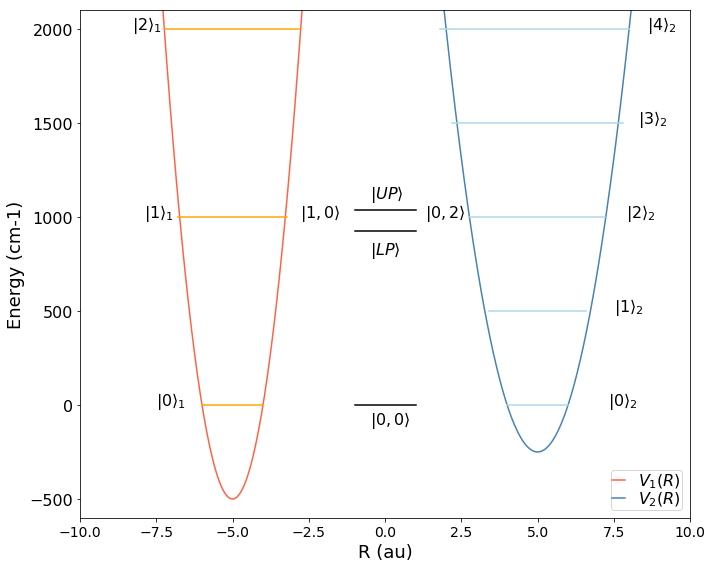

In [3]:
fig, ax1 = plt.subplots(1,figsize=(10,8))

ax1.plot(rgrid,0.5*om1*(rgrid+5.0)**2-500,color='tomato',label=r'$V_{1} (R)$')
ax1.plot(rgrid,0.5*om2*(rgrid-5.0)**2-250,color='steelblue',label=r'$V_{2} (R)$')

ax1.set_xlim(-10,10)
ax1.set_ylim(-600,2100)

ax1.axhline(y=0.0, xmin=0.20, xmax=0.30,color='orange', linestyle='-')
ax1.axhline(y=1000, xmin=0.16, xmax=0.34,color='orange', linestyle='-')
ax1.axhline(y=2000, xmin=0.14, xmax=0.36,color='orange', linestyle='-')

ax1.axhline(y=0.0, xmin=0.70, xmax=0.80, color='lightblue', linestyle='-')
ax1.axhline(y=500, xmin=0.67, xmax=0.83, color='lightblue', linestyle='-')
ax1.axhline(y=1000, xmin=0.64, xmax=0.86, color='lightblue', linestyle='-')
ax1.axhline(y=1500, xmin=0.61, xmax=0.89, color='lightblue', linestyle='-')
ax1.axhline(y=2000, xmin=0.59, xmax=0.90, color='lightblue', linestyle='-')

ax1.axhline(y=0.0, xmin=0.45, xmax=0.55,color='black', linestyle='-')
ax1.axhline(y=924.8, xmin=0.45, xmax=0.55,color='black', linestyle='-')
ax1.axhline(y=1034.4, xmin=0.45, xmax=0.55,color='black', linestyle='-')

ax1.text(-7.5,0.0,r'${|0\rangle}_1$',fontsize=16)
ax1.text(-7.9,1000,r'${|1\rangle}_1$',fontsize=16)
ax1.text(-8.3,2000,r'${|2\rangle}_1$',fontsize=16)
ax1.text(7.3,0.0,r'${|0\rangle}_2$',fontsize=16)
ax1.text(7.5,500,r'${|1\rangle}_2$',fontsize=16)
ax1.text(7.9,1000,r'${|2\rangle}_2$',fontsize=16)
ax1.text(8.3,1500,r'${|3\rangle}_2$',fontsize=16)
ax1.text(8.6,2000,r'${|4\rangle}_2$',fontsize=16)

ax1.text(-0.5,-100,r'${|0,0\rangle}$',fontsize=16)
ax1.text(-0.5,800,r'${|LP\rangle}$',fontsize=16)
ax1.text(-0.5,1100,r'${|UP\rangle}$',fontsize=16)


ax1.text(-2.8,1000,r'${|1,0\rangle}$',fontsize=16)
ax1.text(1.3,1000,r'${|0,2\rangle}$',fontsize=16)

# ax1.text(0.0,-2,0,r'${|0\rangle$}',fontsize=16)


ax1.set_ylabel('Energy (cm-1)',fontsize=18)
ax1.set_xlabel('R (au)',fontsize=18)

ax1.yaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)


# ax[0].text(12.6, 5.15 ,r'(a)',fontsize=18)
# ax[1].text(7.0, 4.33 ,r'(b)',fontsize=18)

ax1.legend(loc='lower right',fontsize=16,borderpad = 0.1, labelspacing = 0, handlelength = 0.8)

fig.tight_layout()
#plt.subplots_adjust(wspace=.0)
# plt.savefig('V1-V2.png', dpi=800, bbox_inches='tight')
plt.show()

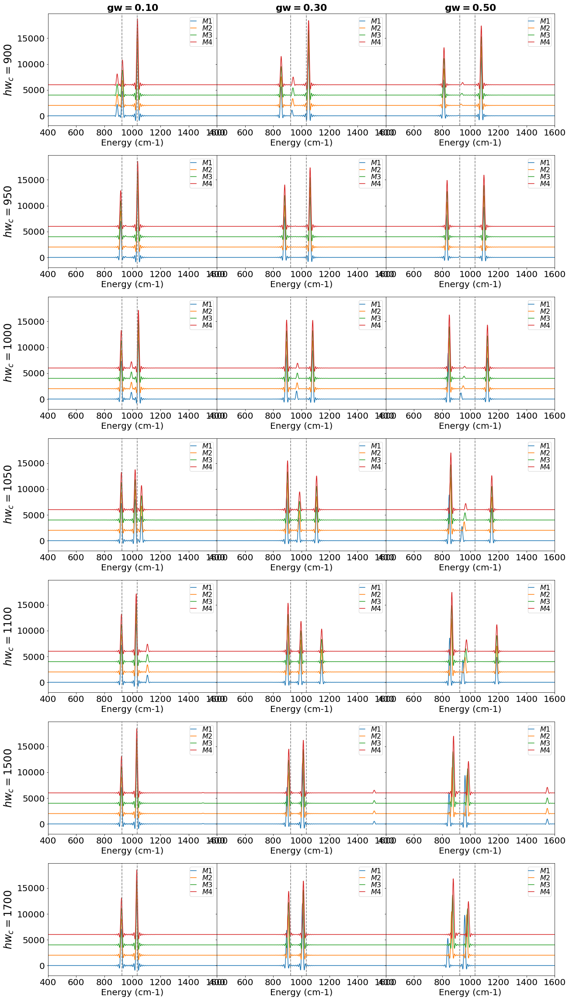

In [28]:
fig, ax = plt.subplots(7,3,figsize=(18,32),sharey=True) #, sharex=True)

# KK=(12,14,15,17,18,26,30)
KK=(9,10,11,12,13)
mykk=len(KK)
# for i in range(mycav):
for k in range(mygw):
    for j in range(mykk):
        ax[j,k].plot(EnerC,specP[KK[j],0,0,k,1],label=r'${M1}$')
        ax[j,k].plot(EnerC,specP[KK[j],1,1,k,1]+2000,label=r'${M2}$')
        ax[j,k].plot(EnerC,specP[KK[j],2,1,k,1]+4000,label=r'${M3}$')
        ax[j,k].plot(EnerC,specP[KK[j],3,1,k,1]+6000,label=r'${M4}$')
#         for j in (1,2,3):
#             ax[j,k].plot(EnerC,specP[i,j,1,k,1]+KK[i]*10,label=r'${}$'.format(A[i]))
#     ax[1,p].set_xticks(arange(3.55,4.01, step=0.1))

for j in range(mykk):
    for k in range(mygw):
        myplotparams(ax[j,k],20,'Energy (cm-1)','')
        ax[j,k].set_xlim(400,1600)
        ax[j,k].axvline(x=924.8, color='grey', linestyle='--')
        ax[j,k].axvline(x=1034.4, color='grey', linestyle='--')

ax[0,0].set_title(r'$\mathbf{gw=0.10}$',fontsize=22)
ax[0,1].set_title(r'$\mathbf{gw=0.30}$',fontsize=22)
ax[0,2].set_title(r'$\mathbf{gw=0.50}$',fontsize=22)
ax[0,0].set_ylabel(r'$hw_c=900$',fontsize=24)
ax[1,0].set_ylabel(r'$hw_c=950$',fontsize=24)
ax[2,0].set_ylabel(r'$hw_c=1000$',fontsize=24)
ax[3,0].set_ylabel(r'$hw_c=1050$',fontsize=24)
ax[4,0].set_ylabel(r'$hw_c=1100$',fontsize=24)
ax[5,0].set_ylabel(r'$hw_c=1500$',fontsize=24)
ax[6,0].set_ylabel(r'$hw_c=1700$',fontsize=24)


# ax[0].legend(bbox_to_anchor=(0.01, 1.2,2, -0.05),ncol=7,mode="expand")
plt.tight_layout()
plt.subplots_adjust(wspace=.0)
# plt.savefig('spectraparaHW_molsgs1234-10.png', dpi=600,bbox_inches='tight')    
plt.show()

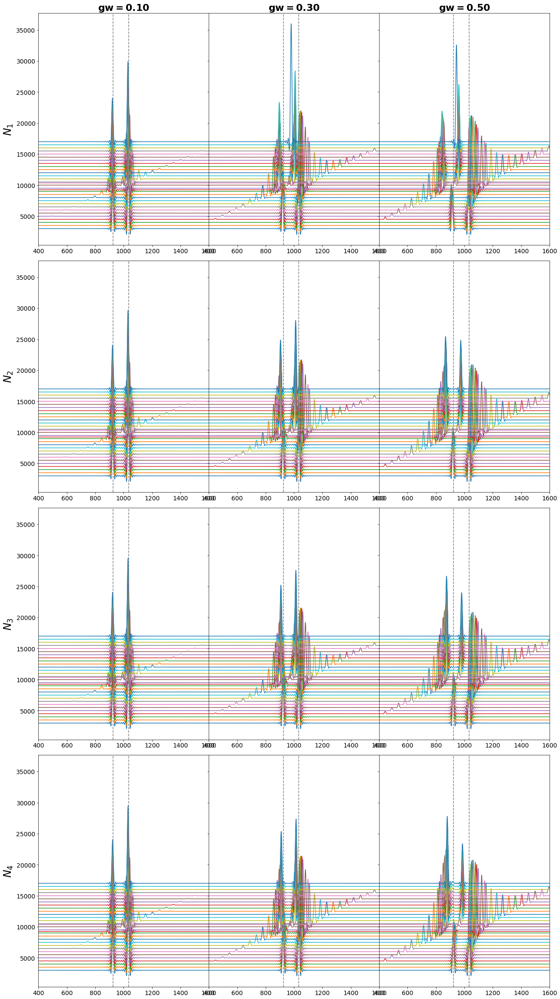

In [17]:
fig, ax = plt.subplots(4,3,figsize=(18,32),sharey=True) #, sharex=True)

# KK = arange(300,1700,50)
KK = (300,350,400,450,500,550,600,650,700,750,800,850,900,924.8,950,1000,1034.4,1050,1100,1150,1200,1250,1300,1350,1400,1450,1500,1550,1600,1650,1700)
for i in range(mycav):
    for k in range(mygw):
        ax[0,k].plot(EnerC,specP[i,0,0,k,1]+KK[i]*10,label=r'${}$'.format(A[i]))
        for j in (1,2,3):
            ax[j,k].plot(EnerC,specP[i,j,1,k,1]+KK[i]*10,label=r'${}$'.format(A[i]))
#     ax[1,p].set_xticks(arange(3.55,4.01, step=0.1))

for j in range(mymol):
    ax[j,0].set_ylabel(r'$N_{}$'.format(j+1),fontsize=24)
    for k in range(mygw):
#         myplotparams(ax[j,k],20,'Energy (cm-1)','')
        ax[j,k].set_xlim(400,1600)
        ax[j,k].axvline(x=924.8, color='grey', linestyle='--')
        ax[j,k].axvline(x=1034.4, color='grey', linestyle='--')

ax[0,0].set_title(r'$\mathbf{gw=0.10}$',fontsize=22)
ax[0,1].set_title(r'$\mathbf{gw=0.30}$',fontsize=22)
ax[0,2].set_title(r'$\mathbf{gw=0.50}$',fontsize=22)
# ax[0,1].set_title(r'$\mathbf{alp2 gw=0.10}$',fontsize=22)
# ax[1,1].set_title(r'$\mathbf{alp2 gw=0.30}$',fontsize=22)
# ax[2,1].set_title(r'$\mathbf{alp2 gw=0.50}$',fontsize=22)

# ax[0].legend(bbox_to_anchor=(0.01, 1.2,2, -0.05),ncol=7,mode="expand")
plt.tight_layout()
plt.subplots_adjust(wspace=.0)
# plt.savefig('spectra_molsgs1234-10.png', dpi=600,bbox_inches='tight')    
plt.show()

# 1.Spectra - Mol_Dif_Frq

In [23]:
#SPECTRA
import pandas as pd
import matplotlib.pyplot as plt
import array
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

efinalC = 1600
dtC     = 1.1988011988
EnerC   = arange(400,efinalC-1,dtC)
EgridC  = int(((efinalC-400)/dtC))

efinalCr = 2200
dtCr     = 1.998001998
EnerCr   = arange(200,efinalCr-1,dtCr)
EgridCr  = int(((efinalCr-200)/dtCr))

tfinalC = 1200
dtfC    = 0.5
TimeC   = arange(0.0,tfinalC,dtfC)
TgridC  = int((tfinalC)/dtfC)

A = ['M4-','M8-','M12-']
B = ['500','550','600','650','700','750','800','850','900','950','1000','1050','1100','1150','1200','1250','1300','1350','1400','1450','1500']
C = ['-gm1-','-gm2-','-gm3-']
D = ['rnd-','eqfr-']
E = ['lg.pl','st.pl','pop2cav_f1']
str1='/worka/johana/Polaritons/Q1Q22/DiffFrq/alles/'

mymol=len(A)
mycav=len(B)
mygw=len(C)
myfrq=len(D)


spcRnSt = zeros((myfrq,mymol,mycav,mygw,2,EgridC))
spcRnLg = zeros((mymol,mycav,mygw,2,EgridCr))
popcav = zeros((myfrq,mymol,mycav,mygw,2,TgridC))

spcRnSt1 = zeros((myfrq,mymol,mycav,mygw,2,EgridC))
popcav1 = zeros((myfrq,mymol,mycav,mygw,2,TgridC))

for j in range(mycav):
    for k in range(mygw):
        Eqfrq=str1+A[0]+B[j]+C[k]+D[1]+E[1]
        ptemp = pd.read_csv(Eqfrq,'\s+',header=None,skiprows=3)
        spcRnSt[1,0,j,k,0]=ptemp[0].values
        spcRnSt[1,0,j,k,1]=ptemp[2].values
        
        Eqpop=str1+A[0]+B[j]+C[k]+D[1]+E[2]
#         print(Eqpop)
        ptemp = pd.read_csv(Eqpop,'\s+',header=None,skiprows=6)
        popcav[1,0,j,k,0]=ptemp[0].values
        popcav[1,0,j,k,1]=ptemp[2].values
        
        for i in range(mymol-1):
            Diffwst=str1+A[i]+B[j]+C[k]+D[0]+E[1]
            ptemp = pd.read_csv(Diffwst,'\s+',header=None,skiprows=3)
            spcRnSt[0,i,j,k,0]=ptemp[0].values
            spcRnSt[0,i,j,k,1]=ptemp[2].values
            
            Diffwlg=str1+A[i]+B[j]+C[k]+D[0]+E[0]
            ptemp = pd.read_csv(Diffwlg,'\s+',header=None,skiprows=3)
            spcRnLg[i,j,k,0]=ptemp[0].values            
            spcRnLg[i,j,k,1]=ptemp[2].values
            
            Diffpop=str1+A[i]+B[j]+C[k]+E[2]
            ptemp = pd.read_csv(Diffpop,'\s+',header=None,skiprows=6)
            popcav[0,i,j,k,0]=ptemp[0].values
            popcav[0,i,j,k,1]=ptemp[2].values


(array([1., 0., 1., 1., 1., 0., 1., 0., 1., 1.]),
 array([ 920.46001148,  933.21073422,  945.96145695,  958.71217969,
         971.46290243,  984.21362516,  996.9643479 , 1009.71507064,
        1022.46579337, 1035.21651611, 1047.96723885]),
 <a list of 10 Patch objects>)

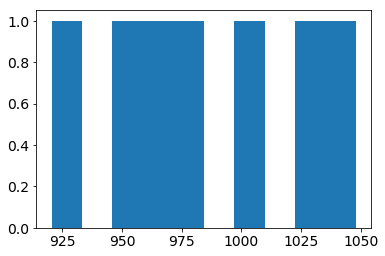

In [6]:
import numpy as np
import matplotlib.pyplot as plt

wA= 1000 + 50*np.random.standard_normal(7)
# w1= 500 + 100*np.random.standard_normal(11)

plt.hist(wA)
# plt.hist(w1)

In [7]:
from  astropy.table import Table, Column
import numpy as np
  
my_nu  = []
my_fi  = []

for i in range(1,7):
    my_fi.append(round(wA[i],0))

my_nu=(arange(1,7))
    
tA=Table([my_nu,my_fi],names=(r'$N$',r'$\hbar \omega_A$'))
tA

$N$,$\hbar \omega_A$
int64,float64
1,983.0
2,1048.0
3,1032.0
4,1009.0
5,965.0
6,951.0


## Diff Frequencies ℏ𝜔 ℏω 	Δ= 100 cm-1

(array([2., 1., 0., 2., 1., 2., 1., 0., 1., 1.]),
 array([365.95315593, 397.75949879, 429.56584166, 461.37218452,
        493.17852739, 524.98487025, 556.79121312, 588.59755598,
        620.40389884, 652.21024171, 684.01658457]),
 <a list of 10 Patch objects>)

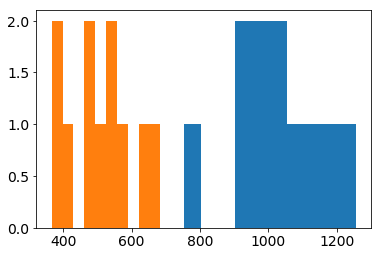

In [41]:
import numpy as np
import matplotlib.pyplot as plt

w0= 1000 + 100*np.random.standard_normal(11)
w1= 500 + 100*np.random.standard_normal(11)

plt.hist(w0)
plt.hist(w1)

In [42]:
from  astropy.table import Table, Column
import numpy as np
  
my_num1    = []
my_first1  = []
my_second1 = []
my_dif1    = []
my_pro     = []

for i in range(1,11):
    my_first1.append(round(w0[i],0))
    my_second1.append(round(w1[i],0))
    Diff1= w0[i]-w1[i]
    Prop1= w0[i]/w1[i]
    my_dif1.append(round(Diff1,0))
    my_pro.append(round(Prop1,1))

my_num1=(arange(1,11))
    
t1=Table([my_num1,my_first1,my_second1,my_dif1,my_pro],names=(r'$N$',r'$\hbar \omega_0$',r'$\hbar \omega_1$',r'$\Delta$',r'$Ratio$'))
t1

$N$,$\hbar \omega_0$,$\hbar \omega_1$,$\Delta$,$Ratio$
int64,float64,float64,float64,float64
1,1019.0,563.0,455.0,1.8
2,1051.0,503.0,548.0,2.1
3,1140.0,627.0,513.0,1.8
4,1256.0,527.0,730.0,2.4
5,955.0,684.0,271.0,1.4
6,932.0,373.0,559.0,2.5
7,931.0,419.0,512.0,2.2
8,752.0,487.0,265.0,1.5
9,1204.0,545.0,658.0,2.2


## Diff Frequencies ℏ𝜔 ℏω 	Δ= 20 cm-1

In [4]:
from  astropy.table import Table, Column
import numpy as np

my_num = []
my_first = []
my_second = []
my_dif = []

# my_num.append(arange(12))
# my_first.append(1023,989,987,1027,999,1003,977,1019,1006,1013,992,1007)
# my_second.append(514,514,492,473,495,504,512,505,505,536,492,500)

my_num=(arange(1,13))
my_first=(1023,989,987,1027,999,1003,977,1019,1006,1013,992,1007)
my_second=(514,514,492,473,495,504,512,505,505,536,492,500)
    
for i in range(12):
    Diff=my_first[i]-my_second[i]
    my_dif.append(round(Diff,5))
    
t=Table([my_num,my_first,my_second,my_dif],names=(r'$N$',r'$\hbar \omega_0$',r'$\hbar \omega_1$',r'$\Delta$'))
t

$N$,$\hbar \omega_0$,$\hbar \omega_1$,$\Delta$
int64,int64,int64,int64
1,1023,514,509
2,989,514,475
3,987,492,495
4,1027,473,554
5,999,495,504
6,1003,504,499
7,977,512,465
8,1019,505,514
9,1006,505,501


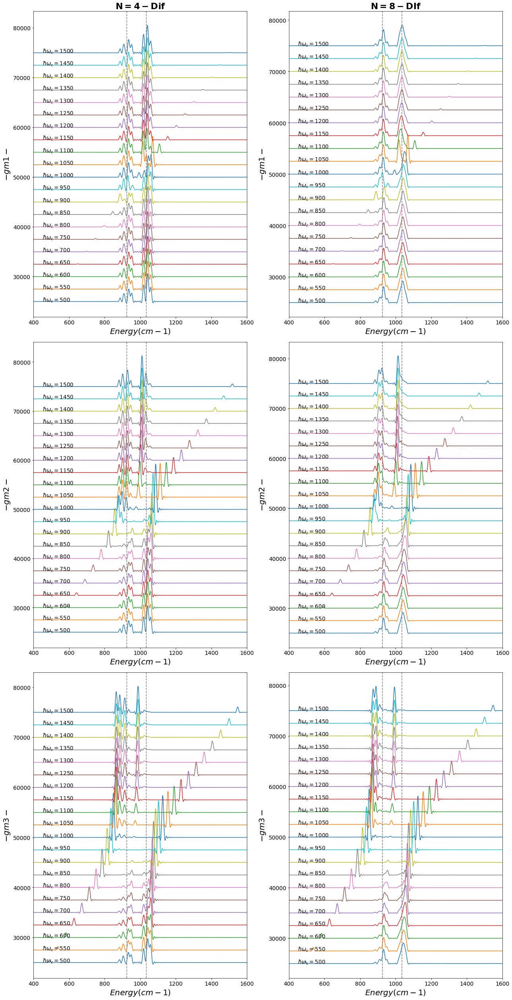

In [43]:
fig, ax = plt.subplots(3,2,figsize=(18,35)) #,sharey=True) #, sharex=True)

# KK = arange(500,1500,50)
# KK = arange(500,1500,50)
KK = (500,550,600,650,700,750,800,850,900,950,1000,1050,1100,1150,1200,1250,1300,1350,1400,1450,1500)

for i in range(mymol-1):
    for j in range(mycav):
        for k in range(mygw):
            ax[k,i].plot(EnerC,spcRnSt[0,i,j,k,1]+KK[j]*50,label=r'${}$'.format(B[j]))
            ax[k,i].text(450,KK[j]*50,r'$\hbar \omega_c={}$'.format(KK[j]),fontsize=13.5)

# for j in range(mymol):
#     ax[j,0].set_ylabel(r'$N_{}$'.format(j+1),fontsize=24)
for i in range(mymol-1):
    for k in range(mygw):
        ax[k,i].set_ylabel(r'${}$'.format(C[k]),fontsize=20)
        ax[k,i].set_xlabel(r'${Energy (cm-1)}$',fontsize=20)
#         myplotparams(ax[k,i],20,'Energy (cm-1)','{}'.format(C[k]))
        ax[k,i].set_xlim(400,1600)
        ax[k,i].axvline(x=924.8, color='grey', linestyle='--')
        ax[k,i].axvline(x=1034.4, color='grey', linestyle='--')
        
ax[0,0].set_title(r'$\mathbf{N=4-Dif}$',fontsize=22)
ax[0,1].set_title(r'$\mathbf{N=8-DIf}$',fontsize=22)

# ax[0].legend(bbox_to_anchor=(0.01, 1.2,2, -0.05),ncol=7,mode="expand")
plt.tight_layout()
# plt.subplots_adjust(wspace=.0)
# plt.savefig('spectra_molsgs1234-100.png', dpi=600,bbox_inches='tight')    
plt.show()

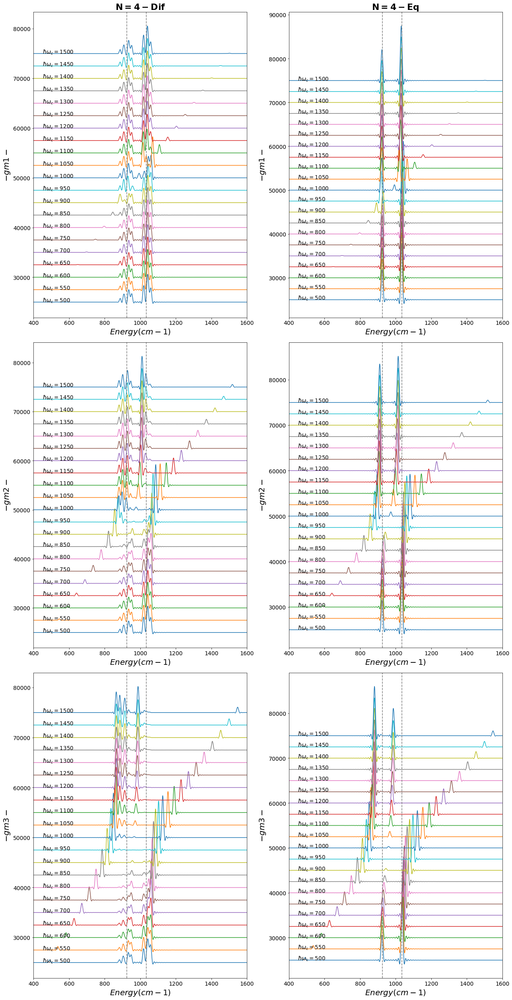

In [44]:
fig, ax = plt.subplots(3,2,figsize=(18,35)) #,sharey=True) #, sharex=True)

# KK = arange(500,1500,50)
# KK = arange(500,1500,50)
KK = (500,550,600,650,700,750,800,850,900,950,1000,1050,1100,1150,1200,1250,1300,1350,1400,1450,1500)

for i in range(myfrq):
    for j in range(mycav):
        for k in range(mygw):
            ax[k,i].plot(EnerC,spcRnSt[i,0,j,k,1]+KK[j]*50,label=r'${}$'.format(B[j]))
            ax[k,i].text(450,KK[j]*50,r'$\hbar \omega_c={}$'.format(KK[j]),fontsize=13.5)

for i in range(myfrq):
    for k in range(mygw):
        ax[k,i].set_ylabel(r'${}$'.format(C[k]),fontsize=20)
        ax[k,i].set_xlabel(r'${Energy (cm-1)}$',fontsize=20)
#         myplotparams(ax[k,i],20,'Energy (cm-1)','{}'.format(C[k]))
        ax[k,i].set_xlim(400,1600)
        ax[k,i].axvline(x=924.8, color='grey', linestyle='--')
        ax[k,i].axvline(x=1034.4, color='grey', linestyle='--')
        
ax[0,0].set_title(r'$\mathbf{N=4-Dif}$',fontsize=22)
ax[0,1].set_title(r'$\mathbf{N=4-Eq}$',fontsize=22)

# ax[0].legend(bbox_to_anchor=(0.01, 1.2,2, -0.05),ncol=7,mode="expand")
plt.tight_layout()
# plt.subplots_adjust(wspace=.0)
# plt.savefig('spectra_molsgs1234-100.png', dpi=600,bbox_inches='tight')    
plt.show()

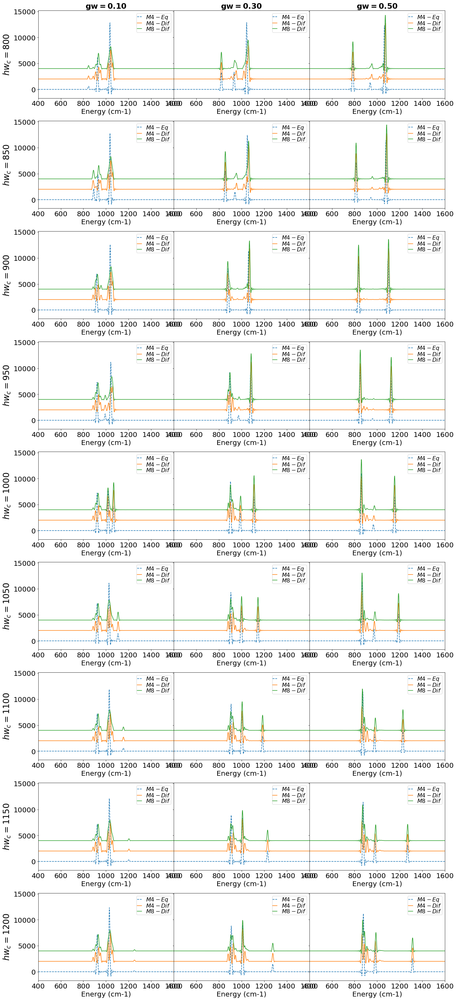

In [42]:
fig, ax = plt.subplots(9,3,figsize=(18,40),sharey=True) #, sharex=True)

# KK=(12,14,15,17,18,26,30)
KK1=(7,8,9,10,11,12,13,14,15)
mykk1=len(KK1)
# for i in range(mycav):
for k in range(mygw):
    for j in range(mykk1):
        ax[j,k].plot(EnerC,spcRnSt[1,0,KK1[j],k,1],'--',label=r'${M4-Eq}$')
        ax[j,k].plot(EnerC,spcRnSt[0,0,KK1[j],k,1]+2000,label=r'${M4-Dif}$')
        ax[j,k].plot(EnerC,spcRnSt[0,1,KK1[j],k,1]+4000,label=r'${M8-Dif}$')
#         ax[j,k].plot(EnerC,spcRnSt[0,KK[j],2,1,k,1]+4000,label=r'${M3}$')
#         ax[j,k].plot(EnerC,spcRnSt[0,KK[j],3,1,k,1]+6000,label=r'${M4}$')
#         for j in (1,2,3):
#             ax[j,k].plot(EnerC,specP[i,j,1,k,1]+KK[i]*10,label=r'${}$'.format(A[i]))
#     ax[1,p].set_xticks(arange(3.55,4.01, step=0.1))

for j in range(mykk):
    for k in range(mygw):
        myplotparams(ax[j,k],20,'Energy (cm-1)','')
        ax[j,k].set_xlim(400,1600)
#         ax[j,k].axvline(x=924.8, color='grey', linestyle='--')
#         ax[j,k].axvline(x=1034.4, color='grey', linestyle='--')

ax[0,0].set_title(r'$\mathbf{gw=0.10}$',fontsize=22)
ax[0,1].set_title(r'$\mathbf{gw=0.30}$',fontsize=22)
ax[0,2].set_title(r'$\mathbf{gw=0.50}$',fontsize=22)
ax[0,0].set_ylabel(r'$hw_c=800$',fontsize=24)
ax[1,0].set_ylabel(r'$hw_c=850$',fontsize=24)
ax[2,0].set_ylabel(r'$hw_c=900$',fontsize=24)
ax[3,0].set_ylabel(r'$hw_c=950$',fontsize=24)
ax[4,0].set_ylabel(r'$hw_c=1000$',fontsize=24)
ax[5,0].set_ylabel(r'$hw_c=1050$',fontsize=24)
ax[6,0].set_ylabel(r'$hw_c=1100$',fontsize=24)
ax[7,0].set_ylabel(r'$hw_c=1150$',fontsize=24)
ax[8,0].set_ylabel(r'$hw_c=1200$',fontsize=24)


# ax[0].legend(bbox_to_anchor=(0.01, 1.2,2, -0.05),ncol=7,mode="expand")
plt.tight_layout()
plt.subplots_adjust(wspace=.0)
# plt.savefig('spectraparaHW_molsgs1234-10.png', dpi=600,bbox_inches='tight')    
plt.show()

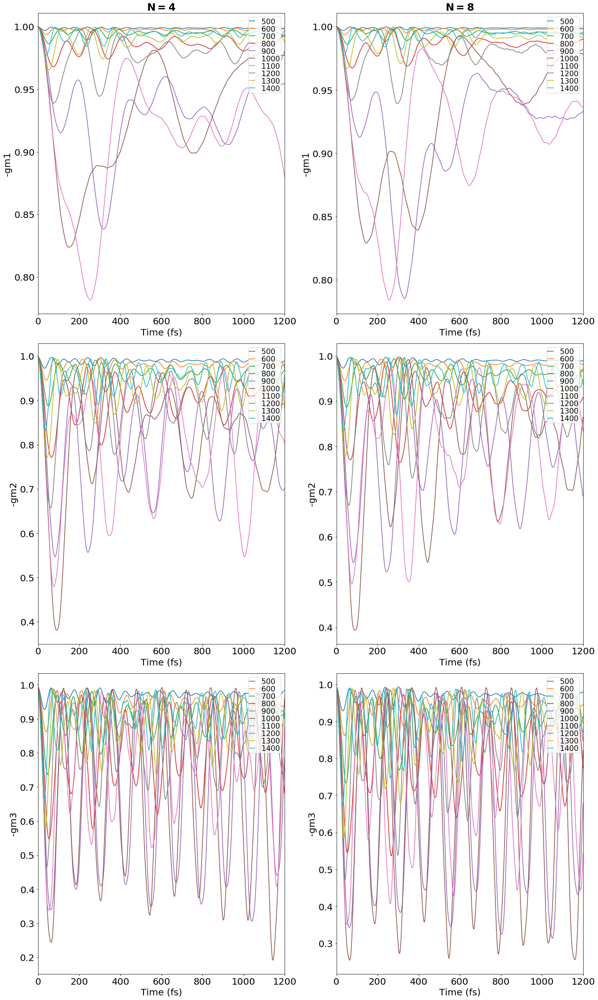

In [3]:
fig, ax = plt.subplots(3,2,figsize=(18,30)) #,sharey=True) #, sharex=True)

# for j in range(mycav):
for i in range(mymol-1):
    for j in range(0,20,2):
        for k in range(mygw):
            ax[k,i].plot(TimeC,popcav[i,j,k,1],label=r'${}$'.format(B[j]))

for i in range(mymol-1):
    for k in range(mygw):
        myplotparams(ax[k,i],20,'Time (fs)','{}'.format(C[k]))
        ax[k,i].set_xlim(0.0,1200)

ax[0,0].set_title(r'$\mathbf{N=4}$',fontsize=22)
ax[0,1].set_title(r'$\mathbf{N=8}$',fontsize=22)

# ax[0].legend(bbox_to_anchor=(0.01, 1.2,2, -0.05),ncol=7,mode="expand")
plt.tight_layout()
# plt.subplots_adjust(wspace=.0)
# plt.savefig('spectra_molsgs1234-100.png', dpi=600,bbox_inches='tight')    
plt.show()

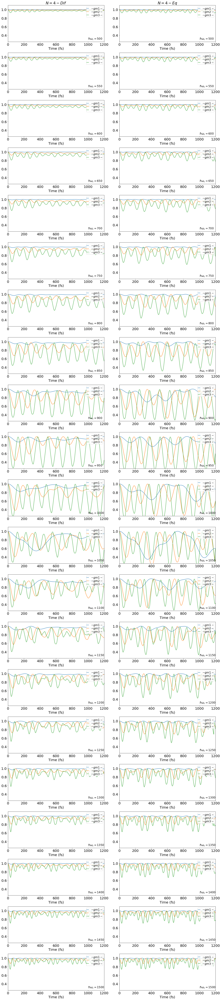

In [25]:
fig, ax = plt.subplots(21,2,figsize=(18,80)) #,sharey=True) #, sharex=True)

for i in range(myfrq):
    for j in range(mycav):
        for k in range(mygw):
            ax[j,i].plot(TimeC,popcav[i,0,j,k,1],label=r'${}$'.format(C[k]))  

for i in range(mymol-1):        
    for j in range(mycav):
        ax[j,i].text(1000,0.30,r'$\hbar \omega_c={}$'.format(B[j]),fontsize=16)
        myplotparams(ax[j,i],20,'Time (fs)','')
        ax[j,i].set_xlim(0.0,1200)
        ax[j,i].set_ylim(0.25,1.1)


ax[0,0].set_title(r'$N=4-Dif$',fontsize=22)
ax[0,1].set_title(r'$N=4-Eq$',fontsize=22)
        
        
# ax[0].legend(bbox_to_anchor=(0.01, 1.2,2, -0.05),ncol=7,mode="expand")
plt.tight_layout()
# plt.subplots_adjust(wspace=.0)
# plt.savefig('spectra_molsgs1234-100.png', dpi=600,bbox_inches='tight')    
plt.show()

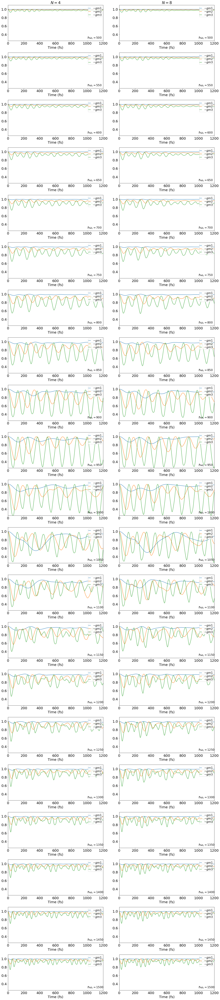

In [77]:
fig, ax = plt.subplots(21,2,figsize=(18,80)) #,sharey=True) #, sharex=True)

for i in range(mymol-1):
    for j in range(mycav):
        for k in range(mygw):
            ax[j,i].plot(TimeC,popcav[0,i,j,k,1],label=r'${}$'.format(C[k]))  

for i in range(mymol-1):        
    for j in range(mycav):
        ax[j,i].text(1000,0.30,r'$\hbar \omega_c={}$'.format(B[j]),fontsize=16)
        myplotparams(ax[j,i],20,'Time (fs)','')
        ax[j,i].set_xlim(0.0,1200)
        ax[j,i].set_ylim(0.25,1.1)


ax[0,0].set_title(r'$N=4$',fontsize=22)
ax[0,1].set_title(r'$N=8$',fontsize=22)
        
        
# ax[0].legend(bbox_to_anchor=(0.01, 1.2,2, -0.05),ncol=7,mode="expand")
plt.tight_layout()
# plt.subplots_adjust(wspace=.0)
# plt.savefig('spectra_molsgs1234-100.png', dpi=600,bbox_inches='tight')    
plt.show()

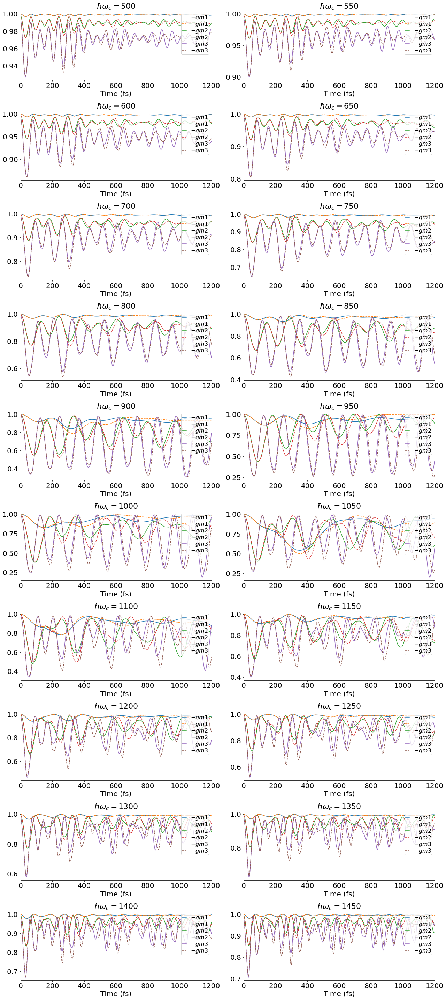

In [76]:
fig, ax = plt.subplots(10,2,figsize=(18,40)) #,sharey=True) #, sharex=True)

pr=range(0,20,2)
sg=range(1,20,2)
new=(len(B)-1)/2

# for i in range(mymol-1):
for k in range(mygw):
    for j in range(10):
        ax[j,0].plot(TimeC,popcav[0,0,j*2,k,1],label=r'${}$'.format(C[k]))  
        ax[j,1].plot(TimeC,popcav[0,0,(j*2+1),k,1],label=r'${}$'.format(C[k]))
        ax[j,0].plot(TimeC,popcav[0,1,j*2,k,1],'--',label=r'${}$'.format(C[k]))  
        ax[j,1].plot(TimeC,popcav[0,1,(j*2+1),k,1],'--',label=r'${}$'.format(C[k]))

for j in range(10):
    ax[j,0].set_title(r'$\hbar \omega_c={}$'.format(B[j*2]),fontsize=22)
    ax[j,1].set_title(r'$\hbar \omega_c={}$'.format(B[j*2+1]),fontsize=22)
    for l in (0,1):        
        myplotparams(ax[j,l],20,'Time (fs)','')
        ax[j,l].set_xlim(0.0,1200)


# ax[0].legend(bbox_to_anchor=(0.01, 1.2,2, -0.05),ncol=7,mode="expand")
plt.tight_layout()
# plt.subplots_adjust(wspace=.0)
# plt.savefig('spectra_molsgs1234-100.png', dpi=600,bbox_inches='tight')    
plt.show()

In [145]:
#USING RELAXATION AND PROPAGATION

GnBu = cm.get_cmap('GnBu', 14000)

EnerC = arange(400,efinalC-1,dtC)
Pht = (300,350,400,450,500,550,600,650,700,750,800,850,900,924.8,950,1000,1034.4,1050,1100,1150,1200,1250,1300,1350,1400,1450,1500,1550,1600,1650,1700)
yy,xx =np.meshgrid(Pht,EnerC)

#zz-Caracteristic-Mol#-gm#
zzHO11 = zeros((len(EnerC),len(Pht))) # 2HO - Mol 1 -gw1
zzHO12 = zeros((len(EnerC),len(Pht))) # 2HO - Mol 1 -gw2
zzHO13 = zeros((len(EnerC),len(Pht))) # 2HO - Mol 1 -gw3

zzBt11 = zeros((len(EnerC),len(Pht)))  # Mol 1 Cav -gw1  -beta=0.0
zzBt12 = zeros((len(EnerC),len(Pht)))  # Mol 1 Cav -gw2  -beta=0.0
zzBt13 = zeros((len(EnerC),len(Pht)))  # Mol 1 Cav -gw3  -beta=0.0

zzCv11 = zeros((len(EnerC),len(Pht))) # Mol 1 -gw1 -Cav -pop=2
zzCv12 = zeros((len(EnerC),len(Pht))) # Mol 1 -gw2 -Cav -pop=2
zzCv13 = zeros((len(EnerC),len(Pht))) # Mol 1 -gw3 -Cav -pop=2

zzIR11 = zeros((len(EnerC),len(Pht))) # Mol 1 -gw1 -IR1 -pop=2
zzIR12 = zeros((len(EnerC),len(Pht))) # Mol 1 -gw2 -IR1 -pop=2
zzIR13 = zeros((len(EnerC),len(Pht))) # Mol 1 -gw3 -IR1 -pop=2

zzRm11 = zeros((len(EnerC),len(Pht))) # Mol 1 -gw1 -Rm1 -pop=3
zzRm12 = zeros((len(EnerC),len(Pht))) # Mol 1 -gw2 -Rm1 -pop=3
zzRm13 = zeros((len(EnerC),len(Pht))) # Mol 1 -gw3 -Rm1 -pop=3

zzGN11 = zeros((len(EnerC),len(Pht))) # Mol 1 -gw1
zzGN12 = zeros((len(EnerC),len(Pht))) # Mol 1 -gw2
zzGN13 = zeros((len(EnerC),len(Pht))) # Mol 1 -gw3

zzGN21 = zeros((len(EnerC),len(Pht))) # Mol 2 -gw1
zzGN22 = zeros((len(EnerC),len(Pht))) # Mol 2 -gw2
zzGN23 = zeros((len(EnerC),len(Pht))) # Mol 2 -gw3

zzGN31 = zeros((len(EnerC),len(Pht))) # Mol 3 -gw1
zzGN32 = zeros((len(EnerC),len(Pht))) # Mol 3 -gw2
zzGN33 = zeros((len(EnerC),len(Pht))) # Mol 3 -gw3

zzGN41 = zeros((len(EnerC),len(Pht))) # Mol 4 -gw1
zzGN42 = zeros((len(EnerC),len(Pht))) # Mol 4 -gw2
zzGN43 = zeros((len(EnerC),len(Pht))) # Mol 4 -gw3

zzCv41 = zeros((len(EnerC),len(Pht))) # Mol 4 -gw1 - Cav -pop2
zzCv42 = zeros((len(EnerC),len(Pht))) # Mol 4 -gw2 - Cav -pop2
zzCv43 = zeros((len(EnerC),len(Pht))) # Mol 4 -gw3 - Cav -pop2

zzRd21 = zeros((len(EnerC),len(Pht))) # Mol 2 -gw1 - w1 =/ 2*w2
zzRd22 = zeros((len(EnerC),len(Pht))) # Mol 2 -gw2 - w1 =/ 2*w2
zzRd23 = zeros((len(EnerC),len(Pht))) # Mol 2 -gw3 - w1 =/ 2*w2

zzRd41 = zeros((len(EnerC),len(Pht))) # Mol 2 -gw1 - w1 =/ 2*w2
zzRd42 = zeros((len(EnerC),len(Pht))) # Mol 2 -gw2 - w1 =/ 2*w2
zzRd43 = zeros((len(EnerC),len(Pht))) # Mol 2 -gw3 - w1 =/ 2*w2

for i in range(len(Pht)):
    for j in range(len(EnerC)):
#                         hw,N,G,gw,        
        zzHO11[j,i] = specP[i,0,1,0,1,j] # 2HO - Mol 1 -gw1
        zzHO12[j,i] = specP[i,0,1,1,1,j] # 2HO - Mol 1 -gw2
        zzHO13[j,i] = specP[i,0,1,2,1,j] # 2HO - Mol 1 -gw3
        
        zzBt11[j,i] = specC[i,0,0,1,j] # Mol 1 Cav -gw1  -beta=0.0
        zzBt12[j,i] = specC[i,0,1,1,j] # Mol 1 Cav -gw2  -beta=0.0
        zzBt13[j,i] = specC[i,0,2,1,j] # Mol 1 Cav -gw3  -beta=0.0
        
        zzCv11[j,i] = CroC1[i,0,0,0,1,j]  # Mol 1 -gw1 -Cav -pop=2
        zzCv12[j,i] = CroC1[i,0,1,0,1,j]
        zzCv13[j,i] = CroC1[i,0,2,0,1,j]

        zzIR11[j,i] = CroC1[i,0,0,1,1,j] # Mol 1 -gw1 -IR1 -pop=2
        zzIR12[j,i] = CroC1[i,0,1,1,1,j]
        zzIR13[j,i] = CroC1[i,0,2,1,1,j]

        zzRm11[j,i] = CroC1[i,0,0,2,1,j] # Mol 1 -gw1 -Rm1 -pop=3
        zzRm12[j,i] = CroC1[i,0,1,2,1,j]
        zzRm13[j,i] = CroC1[i,0,2,2,1,j]
        
        zzGN11[j,i] = specP[i,0,0,0,1,j]
        zzGN12[j,i] = specP[i,0,0,1,1,j]
        zzGN13[j,i] = specP[i,0,0,2,1,j]
       
        zzGN21[j,i] = specP[i,1,0,0,1,j]
        zzGN22[j,i] = specP[i,1,0,1,1,j]
        zzGN23[j,i] = specP[i,1,0,2,1,j]
         
        zzGN31[j,i] = specP[i,2,0,0,1,j]        
        zzGN32[j,i] = specP[i,2,0,1,1,j]
        zzGN33[j,i] = specP[i,2,0,2,1,j]
        
        zzGN41[j,i] = specP[i,3,0,0,1,j]        
        zzGN42[j,i] = specP[i,3,0,1,1,j]
        zzGN43[j,i] = specP[i,3,0,2,1,j]
        
        zzCv41[j,i] = specC[i,3,0,1,j]
        zzCv42[j,i] = specC[i,3,1,1,j]
        zzCv43[j,i] = specC[i,3,2,1,j]
        
#         zzRd21[j,i] = specP[i,1,2,0,1,j]
#         zzRd22[j,i] = specP[i,1,2,1,1,j]
        zzRd23[j,i] = specP[i,1,2,2,1,j]
    
#         zzRd41[j,i] = specP[i,1,2,0,1,j]
#         zzRd42[j,i] = specP[i,1,2,1,1,j]
        zzRd43[j,i] = specP[i,3,2,2,1,j]
    

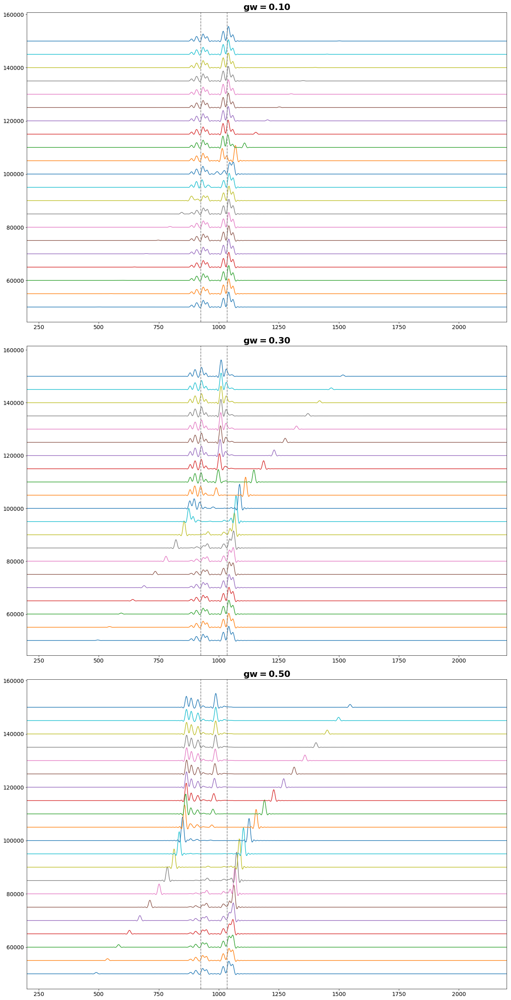

In [17]:
fig, ax = plt.subplots(3,figsize=(18,35)) #,sharey=True) #, sharex=True)

# KK = arange(500,1500,50)
# KK = arange(500,1500,50)
KK = (500,550,600,650,700,750,800,850,900,950,1000,1050,1100,1150,1200,1250,1300,1350,1400,1450,1500)


for j in range(mycav):
    for k in range(mygw):
        ax[k].plot(EnerCr,spcRnLg[0,j,k,1]+KK[j]*100,label=r'${}$'.format(B[j]))

# for j in range(mymol):
#     ax[j,0].set_ylabel(r'$N_{}$'.format(j+1),fontsize=24)
for k in range(mygw):
#         myplotparams(ax[j,k],20,'Energy (cm-1)','')
        ax[k].set_xlim(200,2200)
        ax[k].axvline(x=924.8, color='grey', linestyle='--')
        ax[k].axvline(x=1034.4, color='grey', linestyle='--')

ax[0].set_title(r'$\mathbf{gw=0.10}$',fontsize=22)
ax[1].set_title(r'$\mathbf{gw=0.30}$',fontsize=22)
ax[2].set_title(r'$\mathbf{gw=0.50}$',fontsize=22)

# ax[0].legend(bbox_to_anchor=(0.01, 1.2,2, -0.05),ncol=7,mode="expand")
plt.tight_layout()
plt.subplots_adjust(wspace=.0)
# plt.savefig('spectra_molsgs1234-100.png', dpi=600,bbox_inches='tight')    
plt.show()

In [145]:
#USING RELAXATION AND PROPAGATION

GnBu = cm.get_cmap('GnBu', 14000)

EnerC = arange(400,efinalC-1,dtC)
Pht = (300,350,400,450,500,550,600,650,700,750,800,850,900,924.8,950,1000,1034.4,1050,1100,1150,1200,1250,1300,1350,1400,1450,1500,1550,1600,1650,1700)
yy,xx =np.meshgrid(Pht,EnerC)

#zz-Caracteristic-Mol#-gm#
zzHO11 = zeros((len(EnerC),len(Pht))) # 2HO - Mol 1 -gw1
zzHO12 = zeros((len(EnerC),len(Pht))) # 2HO - Mol 1 -gw2
zzHO13 = zeros((len(EnerC),len(Pht))) # 2HO - Mol 1 -gw3

zzBt11 = zeros((len(EnerC),len(Pht)))  # Mol 1 Cav -gw1  -beta=0.0
zzBt12 = zeros((len(EnerC),len(Pht)))  # Mol 1 Cav -gw2  -beta=0.0
zzBt13 = zeros((len(EnerC),len(Pht)))  # Mol 1 Cav -gw3  -beta=0.0

zzCv11 = zeros((len(EnerC),len(Pht))) # Mol 1 -gw1 -Cav -pop=2
zzCv12 = zeros((len(EnerC),len(Pht))) # Mol 1 -gw2 -Cav -pop=2
zzCv13 = zeros((len(EnerC),len(Pht))) # Mol 1 -gw3 -Cav -pop=2

zzIR11 = zeros((len(EnerC),len(Pht))) # Mol 1 -gw1 -IR1 -pop=2
zzIR12 = zeros((len(EnerC),len(Pht))) # Mol 1 -gw2 -IR1 -pop=2
zzIR13 = zeros((len(EnerC),len(Pht))) # Mol 1 -gw3 -IR1 -pop=2

zzRm11 = zeros((len(EnerC),len(Pht))) # Mol 1 -gw1 -Rm1 -pop=3
zzRm12 = zeros((len(EnerC),len(Pht))) # Mol 1 -gw2 -Rm1 -pop=3
zzRm13 = zeros((len(EnerC),len(Pht))) # Mol 1 -gw3 -Rm1 -pop=3

zzGN11 = zeros((len(EnerC),len(Pht))) # Mol 1 -gw1
zzGN12 = zeros((len(EnerC),len(Pht))) # Mol 1 -gw2
zzGN13 = zeros((len(EnerC),len(Pht))) # Mol 1 -gw3

zzGN21 = zeros((len(EnerC),len(Pht))) # Mol 2 -gw1
zzGN22 = zeros((len(EnerC),len(Pht))) # Mol 2 -gw2
zzGN23 = zeros((len(EnerC),len(Pht))) # Mol 2 -gw3

zzGN31 = zeros((len(EnerC),len(Pht))) # Mol 3 -gw1
zzGN32 = zeros((len(EnerC),len(Pht))) # Mol 3 -gw2
zzGN33 = zeros((len(EnerC),len(Pht))) # Mol 3 -gw3

zzGN41 = zeros((len(EnerC),len(Pht))) # Mol 4 -gw1
zzGN42 = zeros((len(EnerC),len(Pht))) # Mol 4 -gw2
zzGN43 = zeros((len(EnerC),len(Pht))) # Mol 4 -gw3

zzCv41 = zeros((len(EnerC),len(Pht))) # Mol 4 -gw1 - Cav -pop2
zzCv42 = zeros((len(EnerC),len(Pht))) # Mol 4 -gw2 - Cav -pop2
zzCv43 = zeros((len(EnerC),len(Pht))) # Mol 4 -gw3 - Cav -pop2

zzRd21 = zeros((len(EnerC),len(Pht))) # Mol 2 -gw1 - w1 =/ 2*w2
zzRd22 = zeros((len(EnerC),len(Pht))) # Mol 2 -gw2 - w1 =/ 2*w2
zzRd23 = zeros((len(EnerC),len(Pht))) # Mol 2 -gw3 - w1 =/ 2*w2

zzRd41 = zeros((len(EnerC),len(Pht))) # Mol 2 -gw1 - w1 =/ 2*w2
zzRd42 = zeros((len(EnerC),len(Pht))) # Mol 2 -gw2 - w1 =/ 2*w2
zzRd43 = zeros((len(EnerC),len(Pht))) # Mol 2 -gw3 - w1 =/ 2*w2

for i in range(len(Pht)):
    for j in range(len(EnerC)):
#                         hw,N,G,gw,        
        zzHO11[j,i] = specP[i,0,1,0,1,j] # 2HO - Mol 1 -gw1
        zzHO12[j,i] = specP[i,0,1,1,1,j] # 2HO - Mol 1 -gw2
        zzHO13[j,i] = specP[i,0,1,2,1,j] # 2HO - Mol 1 -gw3
        
        zzBt11[j,i] = specC[i,0,0,1,j] # Mol 1 Cav -gw1  -beta=0.0
        zzBt12[j,i] = specC[i,0,1,1,j] # Mol 1 Cav -gw2  -beta=0.0
        zzBt13[j,i] = specC[i,0,2,1,j] # Mol 1 Cav -gw3  -beta=0.0
        
        zzCv11[j,i] = CroC1[i,0,0,0,1,j]  # Mol 1 -gw1 -Cav -pop=2
        zzCv12[j,i] = CroC1[i,0,1,0,1,j]
        zzCv13[j,i] = CroC1[i,0,2,0,1,j]

        zzIR11[j,i] = CroC1[i,0,0,1,1,j] # Mol 1 -gw1 -IR1 -pop=2
        zzIR12[j,i] = CroC1[i,0,1,1,1,j]
        zzIR13[j,i] = CroC1[i,0,2,1,1,j]

        zzRm11[j,i] = CroC1[i,0,0,2,1,j] # Mol 1 -gw1 -Rm1 -pop=3
        zzRm12[j,i] = CroC1[i,0,1,2,1,j]
        zzRm13[j,i] = CroC1[i,0,2,2,1,j]
        
        zzGN11[j,i] = specP[i,0,0,0,1,j]
        zzGN12[j,i] = specP[i,0,0,1,1,j]
        zzGN13[j,i] = specP[i,0,0,2,1,j]
       
        zzGN21[j,i] = specP[i,1,0,0,1,j]
        zzGN22[j,i] = specP[i,1,0,1,1,j]
        zzGN23[j,i] = specP[i,1,0,2,1,j]
         
        zzGN31[j,i] = specP[i,2,0,0,1,j]        
        zzGN32[j,i] = specP[i,2,0,1,1,j]
        zzGN33[j,i] = specP[i,2,0,2,1,j]
        
        zzGN41[j,i] = specP[i,3,0,0,1,j]        
        zzGN42[j,i] = specP[i,3,0,1,1,j]
        zzGN43[j,i] = specP[i,3,0,2,1,j]
        
        zzCv41[j,i] = specC[i,3,0,1,j]
        zzCv42[j,i] = specC[i,3,1,1,j]
        zzCv43[j,i] = specC[i,3,2,1,j]
        
#         zzRd21[j,i] = specP[i,1,2,0,1,j]
#         zzRd22[j,i] = specP[i,1,2,1,1,j]
        zzRd23[j,i] = specP[i,1,2,2,1,j]
    
#         zzRd41[j,i] = specP[i,1,2,0,1,j]
#         zzRd42[j,i] = specP[i,1,2,1,1,j]
        zzRd43[j,i] = specP[i,3,2,2,1,j]
    

In [135]:
#USING ONLY POP - M1 - LARGER SPECTRA 200-2200 cm-1

GnBu = cm.get_cmap('bwr', 14000)
EnerCr = arange(200,efinalCr-1,dtCr)
Pht = (300,350,400,450,500,550,600,650,700,750,800,850,900,924.8,950,1000,1034.4,1050,1100,1150,1200,1250,1300,1350,1400,1450,1500,1550,1600,1650,1700)
yy,xx =np.meshgrid(Pht,EnerCr)

zz13Cav = zeros((len(EnerCr),len(Pht))) # Mol 1 -gw3 -Cav
zz13IR1 = zeros((len(EnerCr),len(Pht))) # Mol 1 -gw3 -IR1
zz13Rm1 = zeros((len(EnerCr),len(Pht))) # Mol 1 -gw3 -Rm1
zz12Cav = zeros((len(EnerCr),len(Pht))) # Mol 1 -gw2 -Cav
zz12IR1 = zeros((len(EnerCr),len(Pht))) # Mol 1 -gw2 -IR1
zz12Rm1 = zeros((len(EnerCr),len(Pht))) # Mol 1 -gw2 -Rm1
zz11Cav = zeros((len(EnerCr),len(Pht))) # Mol 1 -gw1 -Cav
zz11IR1 = zeros((len(EnerCr),len(Pht))) # Mol 1 -gw1 -IR1
zz11Rm1 = zeros((len(EnerCr),len(Pht))) # Mol 1 -gw1 -Rm1


for i in range(len(Pht)):
    for j in range(len(EnerCr)):
        zz13Cav[j,i] = CrossC[i,0,2,0,1,j]
        zz13IR1[j,i] = CrossC[i,0,2,1,1,j]
        zz13Rm1[j,i] = CrossC[i,0,2,2,1,j]
        zz12Cav[j,i] = CrossC[i,0,1,0,1,j]
        zz12IR1[j,i] = CrossC[i,0,1,1,1,j]
        zz12Rm1[j,i] = CrossC[i,0,1,2,1,j]
        zz11Cav[j,i] = CrossC[i,0,0,0,1,j]
        zz11IR1[j,i] = CrossC[i,0,0,1,1,j]
        zz11Rm1[j,i] = CrossC[i,0,0,2,1,j]

## Anharmocity - Beta parameter - Cuadratic-Lineal Coupling

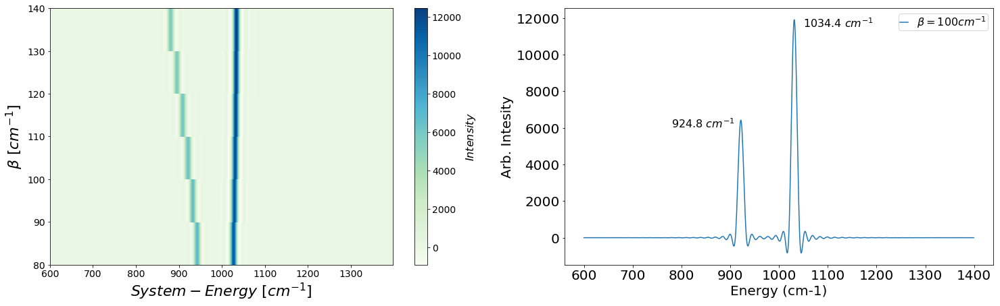

In [59]:
GnBu = cm.get_cmap('GnBu', 14000)
# newcolors = GnBu(np.linspace(0, 14000, 14000))

EnerB1 = arange(600,efinalB-1,dtB)
Bet = np.arange(80,150,10)
yy,xx =np.meshgrid(Bet,EnerB1)
zz = zeros((len(EnerB1),len(Bet)))

for i in range(len(Bet)):
    for j in range(len(EnerB1)):
        zz[j,i] = specB[i,1,j]

fig, ax = plt.subplots(1,2,figsize=(25,7))
img=ax[0].pcolormesh(xx,yy,zz,cmap=plt.cm.get_cmap('GnBu'))
ax[0].set_xlabel(r'$System-Energy$ [$cm^{-1}$]',fontsize=22)
ax[0].set_ylabel(r'$\beta$ [$cm^{-1}$]',fontsize=22)
bx=fig.colorbar(img,ax=ax[0])
bx.set_label(r'$Intensity$')
ax[1].plot(EnerB,specB[2,1],label=r'${\beta=100 cm^{-1}}$')
myplotparams(ax[1],20,'Energy (cm-1)','Arb. Intesity')
ax[1].text(780,6000,r'924.8 $cm^{-1}$',fontsize=16)
ax[1].text(1050,11500,r'1034.4 $cm^{-1}$',fontsize=16)
# plt.savefig('Beta.png', dpi=600,bbox_inches='tight')

plt.show()
# zz.shape

## Different Scenarios of Cavity coupled to a Harmonic Oscillator

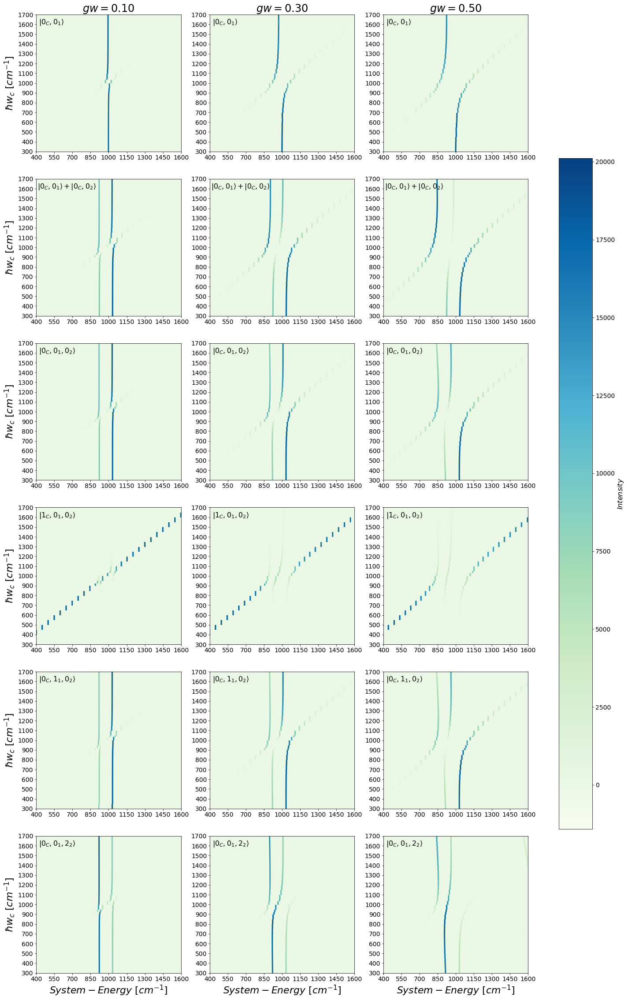

In [149]:
fig, ax = plt.subplots(6,3,figsize=(25,40)) #, sharex=True)

ImgM1=ax[0,0].pcolormesh(xx,yy,zzBt11,cmap=plt.cm.get_cmap('GnBu'))
ax[0,1].pcolormesh(xx,yy,zzBt12,cmap=plt.cm.get_cmap('GnBu'))
ax[0,2].pcolormesh(xx,yy,zzBt13,cmap=plt.cm.get_cmap('GnBu'))
ax[1,0].pcolormesh(xx,yy,zzHO11,cmap=plt.cm.get_cmap('GnBu'))
ax[1,1].pcolormesh(xx,yy,zzHO12,cmap=plt.cm.get_cmap('GnBu'))
ax[1,2].pcolormesh(xx,yy,zzHO13,cmap=plt.cm.get_cmap('GnBu'))
ax[2,0].pcolormesh(xx,yy,zzGN11,cmap=plt.cm.get_cmap('GnBu'))
ax[2,1].pcolormesh(xx,yy,zzGN12,cmap=plt.cm.get_cmap('GnBu'))
ax[2,2].pcolormesh(xx,yy,zzGN13,cmap=plt.cm.get_cmap('GnBu'))
ax[3,0].pcolormesh(xx,yy,zzCv11,cmap=plt.cm.get_cmap('GnBu'))
ax[3,1].pcolormesh(xx,yy,zzCv12,cmap=plt.cm.get_cmap('GnBu'))
ax[3,2].pcolormesh(xx,yy,zzCv13,cmap=plt.cm.get_cmap('GnBu'))
ax[4,0].pcolormesh(xx,yy,zzIR11,cmap=plt.cm.get_cmap('GnBu'))
ax[4,1].pcolormesh(xx,yy,zzIR12,cmap=plt.cm.get_cmap('GnBu'))
ax[4,2].pcolormesh(xx,yy,zzIR13,cmap=plt.cm.get_cmap('GnBu'))
ax[5,0].pcolormesh(xx,yy,zzRm11,cmap=plt.cm.get_cmap('GnBu'))
ax[5,1].pcolormesh(xx,yy,zzRm12,cmap=plt.cm.get_cmap('GnBu'))
ax[5,2].pcolormesh(xx,yy,zzRm13,cmap=plt.cm.get_cmap('GnBu'))

# Bx1=fig.colorbar(ImgM1, ax=ax[:,:], orientation="horizontal",shrink=0.7,ticklocation = 'top')
Bx1=fig.colorbar(ImgM1, ax=ax[:,:], orientation="vertical",shrink=0.7,ticklocation = 'top')
Bx1.set_label(r'$Intensity$')

ax[0,0].set_title(r'$gw=0.10$',fontsize=24)
ax[0,1].set_title(r'$gw=0.30$',fontsize=24)
ax[0,2].set_title(r'$gw=0.50$',fontsize=24)

for t in (0,1,2,3,4,5):
    ax[t,0].set_ylabel(r'$\hbar w_{c}$ [$cm^{-1}$]',fontsize=22)

for k in (0,1,2):
    ax[5,k].set_xlabel(r'$System-Energy$ [$cm^{-1}$]',fontsize=22)
    ax[0,k].text(420,1600,r'$|0_{C},0_{1}\rangle$',fontsize=16)
    ax[1,k].text(410,1600,r'$|0_{C},0_{1}\rangle + |0_{C},0_{2}\rangle$',fontsize=16)
    ax[2,k].text(420,1600,r'$|0_{C},0_{1},0_{2}\rangle$',fontsize=16)
    ax[3,k].text(420,1600,r'$|1_{C},0_{1},0_{2}\rangle$',fontsize=16)
    ax[4,k].text(420,1600,r'$|0_{C},1_{1},0_{2}\rangle$',fontsize=16)
    ax[5,k].text(420,1600,r'$|0_{C},0_{1},2_{2}\rangle$',fontsize=16)
    for q in (0,1,2,3,4,5):
        ax[q,k].set_yticks(arange(300,1700.1,step=100))
        ax[q,k].set_xticks(arange(400,1600.1,step=150))

# plt.tight_layout()
# plt.subplots_adjust(wspace=.0)
# plt.savefig('Mol1-Ev-gw135.pdf', dpi=600,bbox_inches='tight')    
plt.show()

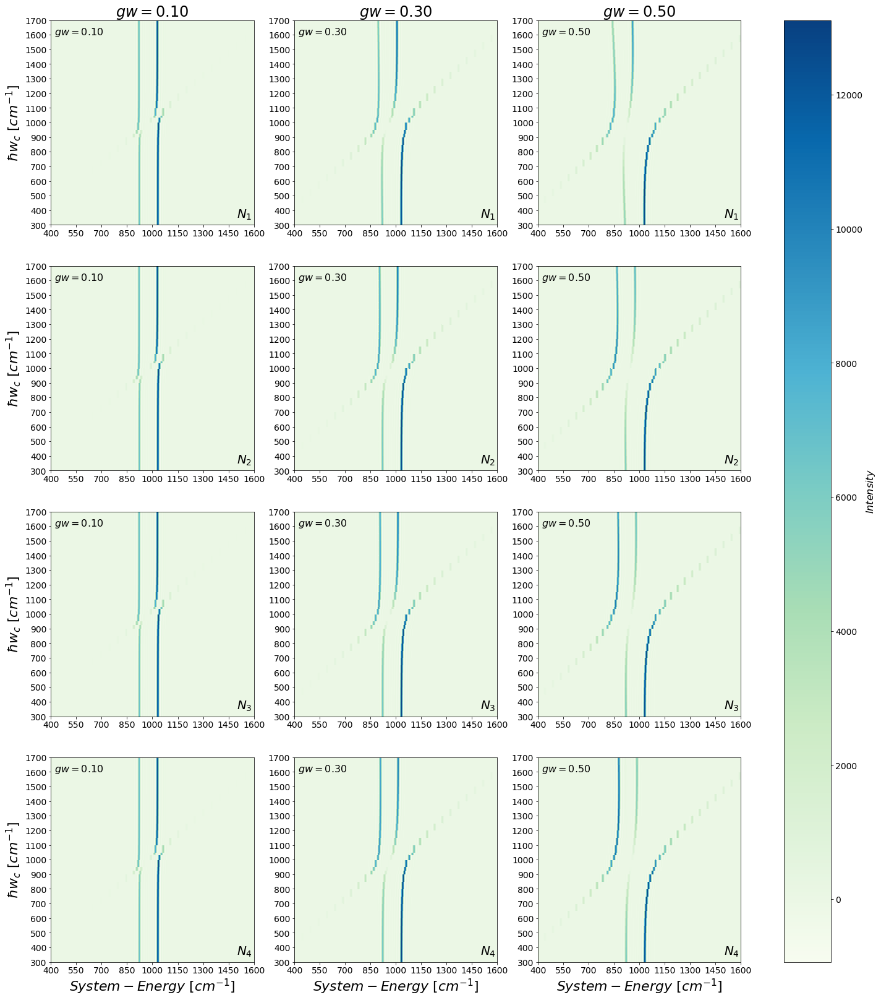

In [151]:
fig, ax = plt.subplots(4,3,figsize=(25,28)) #, sharex=True)

ImgM1234=ax[0,0].pcolormesh(xx,yy,zzGN11,cmap=plt.cm.get_cmap('GnBu'))
ax[0,1].pcolormesh(xx,yy,zzGN12,cmap=plt.cm.get_cmap('GnBu'))
ax[0,2].pcolormesh(xx,yy,zzGN13,cmap=plt.cm.get_cmap('GnBu'))
ax[1,0].pcolormesh(xx,yy,zzGN21,cmap=plt.cm.get_cmap('GnBu'))
ax[1,1].pcolormesh(xx,yy,zzGN22,cmap=plt.cm.get_cmap('GnBu'))
ax[1,2].pcolormesh(xx,yy,zzGN23,cmap=plt.cm.get_cmap('GnBu'))
ax[2,0].pcolormesh(xx,yy,zzGN31,cmap=plt.cm.get_cmap('GnBu'))
ax[2,1].pcolormesh(xx,yy,zzGN32,cmap=plt.cm.get_cmap('GnBu'))
ax[2,2].pcolormesh(xx,yy,zzGN33,cmap=plt.cm.get_cmap('GnBu'))
ax[3,0].pcolormesh(xx,yy,zzGN41,cmap=plt.cm.get_cmap('GnBu'))
ax[3,1].pcolormesh(xx,yy,zzGN42,cmap=plt.cm.get_cmap('GnBu'))
ax[3,2].pcolormesh(xx,yy,zzGN43,cmap=plt.cm.get_cmap('GnBu'))

# BxM1234= inset_axes(ax[0,0], width="100%", height="100%",bbox_to_anchor=(0.01, 1.2,3.3, 0.02),bbox_transform=ax[0,0].transAxes,borderpad=0)
BxM1234=fig.colorbar(ImgM1234, ax=ax[:,:], orientation="vertical",ticklocation="top")
BxM1234.set_label(r'$Intensity$')


ax[3,0].set_xlabel(r'$System-Energy$ [$cm^{-1}$]',fontsize=22)
ax[3,1].set_xlabel(r'$System-Energy$ [$cm^{-1}$]',fontsize=22)
ax[3,2].set_xlabel(r'$System-Energy$ [$cm^{-1}$]',fontsize=22)

ax[0,0].set_title(r'$gw=0.10$',fontsize=24)
ax[0,1].set_title(r'$gw=0.30$',fontsize=24)
ax[0,2].set_title(r'$gw=0.50$',fontsize=24)
    
for k in (0,1,2,3):
    ax[k,0].set_ylabel(r'$\hbar w_{c}$ [$cm^{-1}$]',fontsize=22)
    ax[k,0].text(420,1600,r'$gw=0.10$',fontsize=16)
    ax[k,1].text(420,1600,r'$gw=0.30$',fontsize=16)
    ax[k,2].text(420,1600,r'$gw=0.50$',fontsize=16)
    for q in (0,1,2):
#         ax[k,q].text(420,1600,r'$gw={}$'.format((0.1*(2**(q)))),fontsize=16)
        ax[k,q].text(1500,350,r'$N_{}$'.format(k+1),fontsize=20)
        ax[k,q].set_yticks(arange(300,1700.1,step=100))
        ax[k,q].set_xticks(arange(400,1600.1,step=150))

# ax[0].legend(bbox_to_anchor=(0.01, 1.2,2, -0.05),ncol=7,mode="expand")
# plt.tight_layout()
# plt.subplots_adjust(wspace=.0)
# plt.savefig('M123-gw135.pdf', dpi=600,bbox_inches='tight')    
# plt.colorbar()
plt.show()

## One Molecule - Larger Spectra 200-2200 cm-1

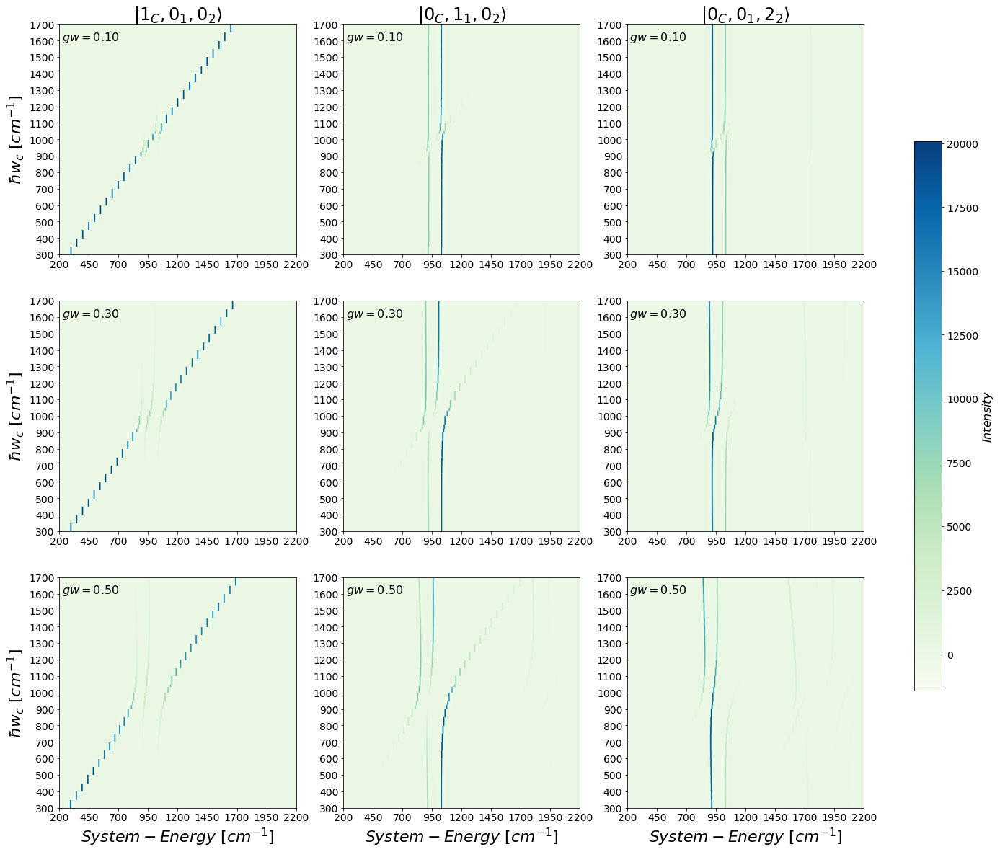

In [137]:
#M1
fig, ax = plt.subplots(3,3,figsize=(25,20)) #, sharex=True)

img1=ax[0,0].pcolormesh(xx,yy,zz11Cav,cmap=plt.cm.get_cmap('GnBu'))
ax[0,1].pcolormesh(xx,yy,zz11IR1,cmap=plt.cm.get_cmap('GnBu'))
ax[0,2].pcolormesh(xx,yy,zz11Rm1,cmap=plt.cm.get_cmap('GnBu'))
ax[1,0].pcolormesh(xx,yy,zz12Cav,cmap=plt.cm.get_cmap('GnBu'))
ax[1,1].pcolormesh(xx,yy,zz12IR1,cmap=plt.cm.get_cmap('GnBu'))
ax[1,2].pcolormesh(xx,yy,zz12Rm1,cmap=plt.cm.get_cmap('GnBu'))
ax[2,0].pcolormesh(xx,yy,zz13Cav,cmap=plt.cm.get_cmap('GnBu'))
ax[2,1].pcolormesh(xx,yy,zz13IR1,cmap=plt.cm.get_cmap('GnBu'))
ax[2,2].pcolormesh(xx,yy,zz13Rm1,cmap=plt.cm.get_cmap('GnBu'))


bx1=fig.colorbar(img1,ax=ax[:,:], orientation="vertical",shrink=0.7,ticklocation = 'top')
bx1.set_label(r'$Intensity$')
# fig.colorbar(img1, ax=ax[0,0], orientation="horizontal",ticklocation="top")
# inset_axes(img1,width="5%",height="50%",loc="upper right",bbox_to_anchor=(0.05, 0.95, 1))

ax[2,1].set_xlabel(r'$System-Energy$ [$cm^{-1}$]',fontsize=22)
ax[2,2].set_xlabel(r'$System-Energy$ [$cm^{-1}$]',fontsize=22)

ax[0,0].set_title(r'$|1_{C},0_{1},0_{2}\rangle$',fontsize=24)
ax[0,1].set_title(r'$|0_{C},1_{1},0_{2}\rangle$',fontsize=24)
ax[0,2].set_title(r'$|0_{C},0_{1},2_{2}\rangle$',fontsize=24)
# ax.set_title(r'$\beta$=0.00 $cm^{-1}$',fontsize=24)
for p in (0,1,2):
    ax[p,0].set_ylabel(r'$\hbar w_{c}$ [$cm^{-1}$]',fontsize=22)
    ax[2,p].set_xlabel(r'$System-Energy$ [$cm^{-1}$]',fontsize=22)
    ax[0,p].text(220,1600,r'$gw=0.10$',fontsize=16)
    ax[1,p].text(220,1600,r'$gw=0.30$',fontsize=16)
    ax[2,p].text(220,1600,r'$gw=0.50$',fontsize=16)
    
    for q in (0,1,2):
        ax[p,q].set_yticks(arange(300,1700.1,step=100))
        ax[p,q].set_xticks(arange(200,2200.1,step=250))


# ax[0].legend(bbox_to_anchor=(0.01, 1.2,2, -0.05),ncol=7,mode="expand")
# plt.tight_layout()
# plt.subplots_adjust(wspace=.0)
# plt.savefig('Mol1Cav-IR-Rm-gw135.pdf', dpi=600,bbox_inches='tight')    
# plt.colorbar()
plt.show()

In [73]:
for i in range(mycav):
#     for l in (1,3): 
    Diffw=str1+A[i]+B[1]+C[2]+D[2]+F[0]+A[i]+F[3]+D[2]+F[4]
    ptemp = pd.read_csv(Diffw,'\s+',header=None,skiprows=3)
    specP[i,1,2,2,0]=ptemp[0].values
    specP[i,1,2,2,1]=ptemp[2].values


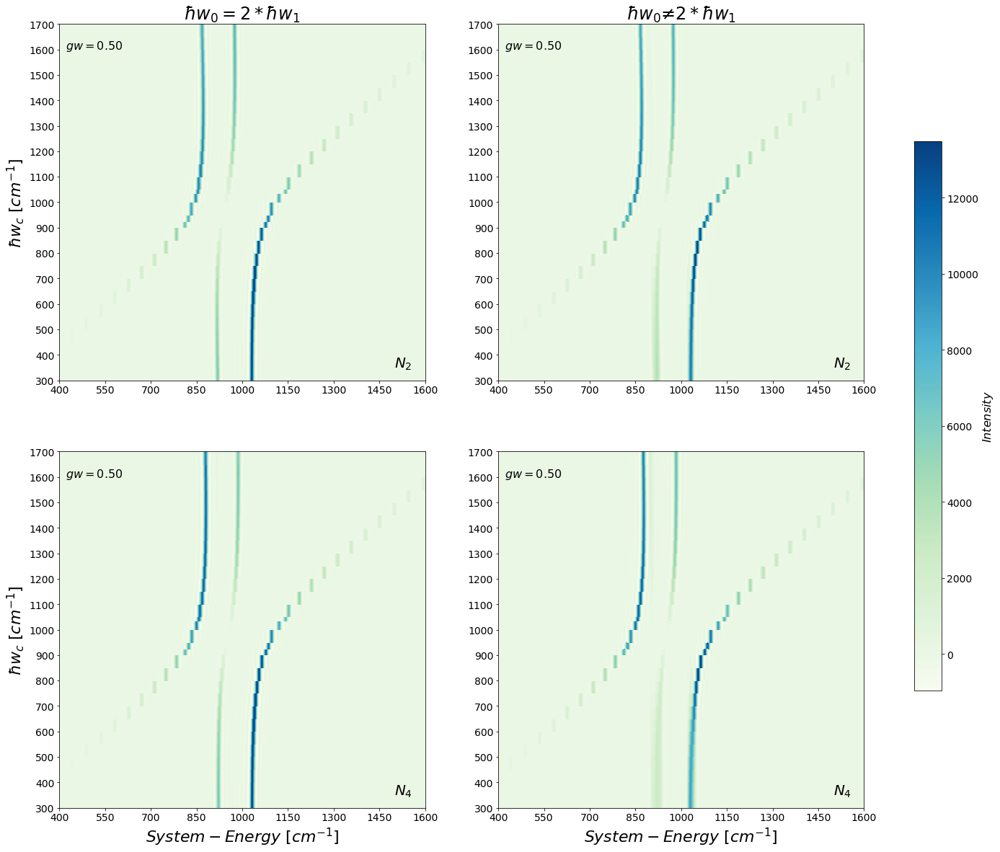

In [144]:
#M2
fig, ax = plt.subplots(2,2,figsize=(25,20)) #, sharex=True)

ImgM2M4=ax[0,0].pcolormesh(xx,yy,zzGN23,cmap=plt.cm.get_cmap('GnBu'))
ax[0,1].pcolormesh(xx,yy,zzRd23,cmap=plt.cm.get_cmap('GnBu'))
ax[1,0].pcolormesh(xx,yy,zzGN43,cmap=plt.cm.get_cmap('GnBu'))
ax[1,1].pcolormesh(xx,yy,zzRd43,cmap=plt.cm.get_cmap('GnBu'))

BxM2M4=fig.colorbar(ImgM2M4,ax=ax[:,:], orientation="vertical",shrink=0.7,ticklocation = 'top')
BxM2M4.set_label(r'$Intensity$')
# fig.colorbar(img1, ax=ax[0,0], orientation="horizontal",ticklocation="top")
# inset_axes(img1,width="5%",height="50%",loc="upper right",bbox_to_anchor=(0.05, 0.95, 1))


ax[0,0].set_title(r'$\hbar w_{0} = 2* \hbar w_{1}$',fontsize=24)
ax[0,1].set_title(r'$\hbar w_{0} \ne 2* \hbar w_{1}$',fontsize=24)

# ax.set_title(r'$\beta$=0.00 $cm^{-1}$',fontsize=24)
for p in (0,1):
    ax[p,0].set_ylabel(r'$\hbar w_{c}$ [$cm^{-1}$]',fontsize=22)
    ax[1,p].set_xlabel(r'$System-Energy$ [$cm^{-1}$]',fontsize=22)
    for q in (0,1):
        ax[q,p].text(420,1600,r'$gw=0.50$',fontsize=16)
        ax[q,p].set_yticks(arange(300,1700.1,step=100))
        ax[q,p].set_xticks(arange(400,1600.1,step=150))
        ax[q,p].text(1500,350,r'$N_{}$'.format(q*2+2),fontsize=20)


# ax[0].legend(bbox_to_anchor=(0.01, 1.2,2, -0.05),ncol=7,mode="expand")
# plt.tight_layout()
# plt.subplots_adjust(wspace=.0)
# plt.savefig('M2-M4-gw3-Diffw.pdf', dpi=600,bbox_inches='tight')    
# plt.colorbar()
plt.show()

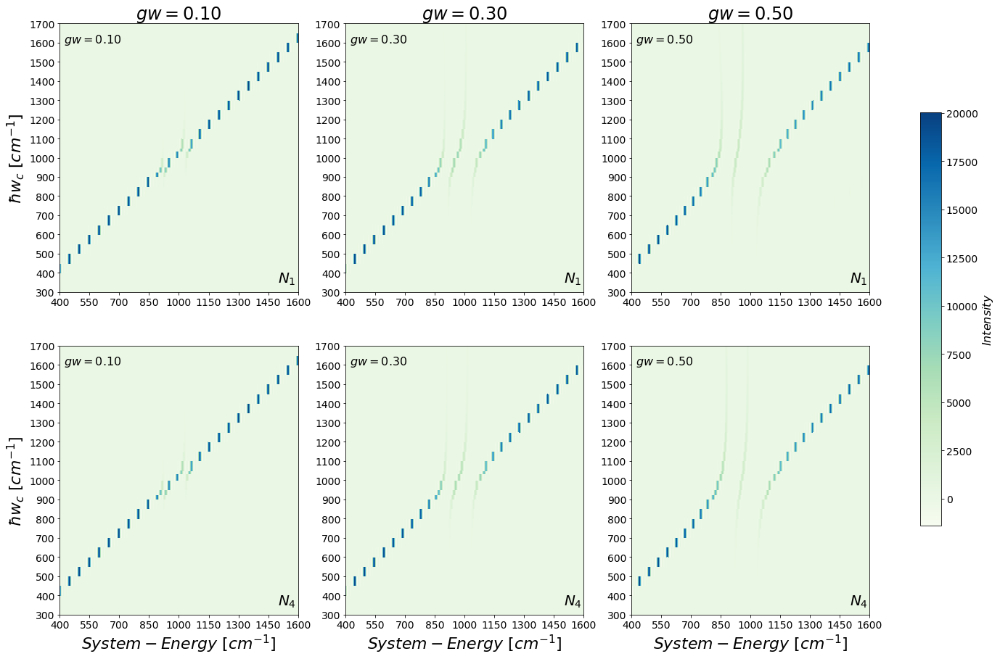

In [147]:
#M1-M4 pop2
fig, ax = plt.subplots(2,3,figsize=(25,15)) #, sharex=True)

ImgM1M4=ax[0,0].pcolormesh(xx,yy,zzCv11,cmap=plt.cm.get_cmap('GnBu'))
ax[0,1].pcolormesh(xx,yy,zzCv12,cmap=plt.cm.get_cmap('GnBu'))
ax[0,2].pcolormesh(xx,yy,zzCv13,cmap=plt.cm.get_cmap('GnBu'))
ax[1,0].pcolormesh(xx,yy,zzCv41,cmap=plt.cm.get_cmap('GnBu'))
ax[1,1].pcolormesh(xx,yy,zzCv42,cmap=plt.cm.get_cmap('GnBu'))
ax[1,2].pcolormesh(xx,yy,zzCv43,cmap=plt.cm.get_cmap('GnBu'))

BxM1M4=fig.colorbar(ImgM1M4,ax=ax[:,:], orientation="vertical",shrink=0.7,ticklocation = 'top')
BxM1M4.set_label(r'$Intensity$')
# fig.colorbar(img1, ax=ax[0,0], orientation="horizontal",ticklocation="top")
# inset_axes(img1,width="5%",height="50%",loc="upper right",bbox_to_anchor=(0.05, 0.95, 1))

ax[0,0].set_title(r'$gw=0.10$',fontsize=24)
ax[0,1].set_title(r'$gw=0.30$',fontsize=24)
ax[0,2].set_title(r'$gw=0.50$',fontsize=24)

for p in (0,1,2):
    ax[0,p].text(1500,350,r'$N_1$',fontsize=20)    
    ax[1,p].text(1500,350,r'$N_4$',fontsize=20)    
    ax[1,p].set_xlabel(r'$System-Energy$ [$cm^{-1}$]',fontsize=22)

for k in (0,1):
    ax[k,0].set_ylabel(r'$\hbar w_{c}$ [$cm^{-1}$]',fontsize=22)
    ax[k,0].text(420,1600,r'$gw=0.10$',fontsize=16)
    ax[k,1].text(420,1600,r'$gw=0.30$',fontsize=16)
    ax[k,2].text(420,1600,r'$gw=0.50$',fontsize=16)
    for q in (0,1,2):
        ax[k,q].set_yticks(arange(300,1700.1,step=100))
        ax[k,q].set_xticks(arange(400,1600.1,step=150))
# ax[0].legend(bbox_to_anchor=(0.01, 1.2,2, -0.05),ncol=7,mode="expand")
# plt.tight_layout()
# plt.subplots_adjust(wspace=.0)
# plt.savefig('M1M4-Cav-gw135.pdf', dpi=600,bbox_inches='tight')    
# plt.colorbar()
plt.show()

In [101]:
efinalCr = 2200
dtCr = 1.998001998
EnerCr = arange(200,efinalCr-1,dtCr)
# EnerC = arange(400,efinalC,dtC)
EgridCr = int(((efinalCr-200)/dtCr))
#print(EgridC)

A = ['300','350','400','450','500','550','600','650','700','750','800','850','900','924.8','950','1000','1034.4','1050','1100','1150','1200','1250','1300','1350','1400','1450','1500','1550','1600','1650','1700']
B = ['/M1/','/M2/','/M3/','/M4/']
C = ['alp1/','GN/','2HO/']
D = ['gm1','gm2','gm3']
E = ['b80','b90','b100','b110','b120','b130','b140']
F = ['/Prog/','/Cav/','Bt-Q1Q22/','-','.pl','/CoCav/','1']
G = ['/Relax/','Coeff/']
H = ['/Cav/','/IR1/','/Rm1/']
I = ['Cav2','IR12','Rm12']
str1='/worka/johana/Polaritons/Q1Q22/'

mycav=len(A)
mymol=len(B)
myGN=len(C)
mygw=len(D)
mybet=len(E)
myCross=len(I)

specP1 = zeros((mycav,mymol,myGN,mygw,2,EgridCr))

for i in range(mycav):
    for j in range(mygw):
        for k in range(mymol-3):
            Cavferalp1=str1+A[i]+B[k]+C[0]+D[j]+F[0]+A[i]+F[3]+D[j]+F[3]+F[6]+F[4]   
            ptemp = pd.read_csv(Cavferalp1,'\s+',header=None,skiprows=3)
            specP1[i,k,0,j,0]=ptemp[0].values
            specP1[i,k,0,j,1]=ptemp[2].values
        for l in (1,2,3): 
            CavferGN1=str1+A[i]+B[l]+C[1]+D[j]+F[0]+A[i]+F[3]+D[j]+F[3]+F[6]+F[4]
            ptemp = pd.read_csv(CavferGN1,'\s+',header=None,skiprows=3)
            specP1[i,l,1,j,0]=ptemp[0].values
            specP1[i,l,1,j,1]=ptemp[2].values
        


In [102]:
GnBu = cm.get_cmap('GnBu', 14000)
# newcolors = GnBu(np.linspace(0, 14000, 14000))


EnerCr = arange(200,efinalCr-1,dtCr)
# Pht = np.arange(300,1750,50)
Pht = (300,350,400,450,500,550,600,650,700,750,800,850,900,924.8,950,1000,1034.4,1050,1100,1150,1200,1250,1300,1350,1400,1450,1500,1550,1600,1650,1700)
yy,xx =np.meshgrid(Pht,EnerCr)

zz110 = zeros((len(EnerCr),len(Pht))) # Mol 1 -gw1
zz120 = zeros((len(EnerCr),len(Pht))) # Mol 1 -gw2
zz130 = zeros((len(EnerCr),len(Pht))) # Mol 1 -gw3

zz210 = zeros((len(EnerCr),len(Pht))) # Mol 2 -gw1
zz220 = zeros((len(EnerCr),len(Pht))) # Mol 2 -gw2
zz230 = zeros((len(EnerCr),len(Pht))) # Mol 2 -gw3

zz310 = zeros((len(EnerCr),len(Pht))) # Mol 3 -gw1
zz320 = zeros((len(EnerCr),len(Pht))) # Mol 3 -gw2
zz330 = zeros((len(EnerCr),len(Pht))) # Mol 3 -gw3

zz410 = zeros((len(EnerCr),len(Pht))) # Mol 4 -gw1
zz420 = zeros((len(EnerCr),len(Pht))) # Mol 4 -gw2
zz430 = zeros((len(EnerCr),len(Pht))) # Mol 4 -gw3

for i in range(len(Pht)):
    for j in range(len(EnerCr)):
#                         hw,N,G,gw,        
        zz110[j,i] = specP1[i,0,0,0,1,j]
        zz120[j,i] = specP1[i,0,0,1,1,j]
        zz130[j,i] = specP1[i,0,0,2,1,j]
       
        zz210[j,i] = specP1[i,1,1,0,1,j]
        zz220[j,i] = specP1[i,1,1,1,1,j]
        zz230[j,i] = specP1[i,1,1,2,1,j]
         
        zz310[j,i] = specP1[i,2,1,0,1,j]        
        zz320[j,i] = specP1[i,2,1,1,1,j]
        zz330[j,i] = specP1[i,2,1,2,1,j]
        
        zz410[j,i] = specP1[i,3,1,0,1,j]        
        zz420[j,i] = specP1[i,3,1,1,1,j]
        zz430[j,i] = specP1[i,3,1,2,1,j]


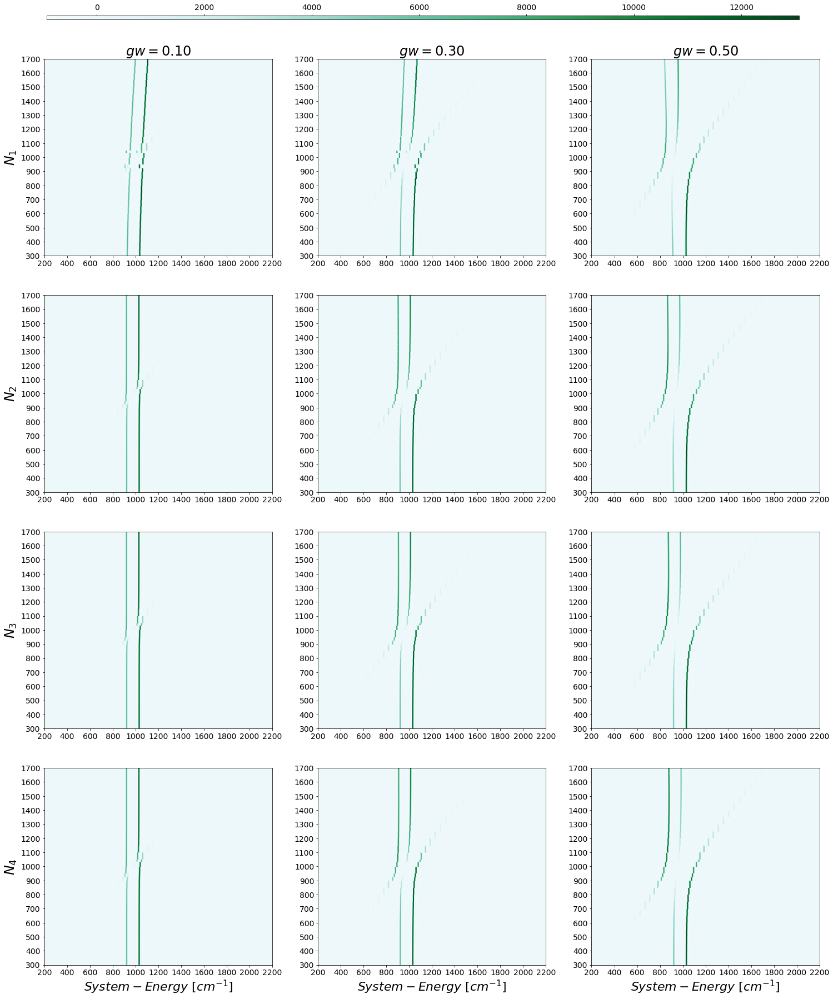

In [105]:
fig, ax = plt.subplots(4,3,figsize=(25,30)) #, sharex=True)

img123=ax[0,0].pcolormesh(xx,yy,zz110,cmap=plt.cm.get_cmap('BuGn'))
ax[0,1].pcolormesh(xx,yy,zz120,cmap=plt.cm.get_cmap('BuGn'))
ax[0,2].pcolormesh(xx,yy,zz130,cmap=plt.cm.get_cmap('BuGn'))
ax[1,0].pcolormesh(xx,yy,zz210,cmap=plt.cm.get_cmap('BuGn'))
ax[1,1].pcolormesh(xx,yy,zz220,cmap=plt.cm.get_cmap('BuGn'))
ax[1,2].pcolormesh(xx,yy,zz230,cmap=plt.cm.get_cmap('BuGn'))
ax[2,0].pcolormesh(xx,yy,zz310,cmap=plt.cm.get_cmap('BuGn'))
ax[2,1].pcolormesh(xx,yy,zz320,cmap=plt.cm.get_cmap('BuGn'))
ax[2,2].pcolormesh(xx,yy,zz330,cmap=plt.cm.get_cmap('BuGn'))
ax[3,0].pcolormesh(xx,yy,zz410,cmap=plt.cm.get_cmap('BuGn'))
ax[3,1].pcolormesh(xx,yy,zz420,cmap=plt.cm.get_cmap('BuGn'))
ax[3,2].pcolormesh(xx,yy,zz430,cmap=plt.cm.get_cmap('BuGn'))

# bx321=fig.colorbar(img321, ax=ax[:],bbox_to_anchor=(1.05, 0., 1, 1),shrink=0.7,ticklocation = 'top')
bx321= inset_axes(ax[0,0], width="100%", height="100%",loc='upper left',bbox_to_anchor=(0.01, 1.2,3.3, 0.02),
                   bbox_transform=ax[0,0].transAxes,borderpad=0)
fig.colorbar(img123, cax=bx321, orientation="horizontal",ticklocation="top")

bx321.set_label(r'$Intensity$')
# fig.colorbar(img1, ax=ax[0,0], orientation="horizontal",ticklocation="top")
# inset_axes(img1,width="5%",height="50%",loc="upper right",bbox_to_anchor=(0.05, 0.95, 1))
ax[0,0].set_title(r'$gw=0.10$',fontsize=24)
ax[0,1].set_title(r'$gw=0.30$',fontsize=24)
ax[0,2].set_title(r'$gw=0.50$',fontsize=24)


for k in (0,1,2,3):
    ax[k,0].set_ylabel(r'$N_{}$'.format(k+1),fontsize=24)
    for q in (0,1,2):
        ax[k,q].set_yticks(arange(300,1700.1,step=100))
        ax[k,q].set_xticks(arange(200,2200.1,step=200))

for p in (0,1,2):
    ax[3,p].set_xlabel(r'$System-Energy$ [$cm^{-1}$]',fontsize=22)
#     ax[0,p].set_title(r'$\hbar w_{c}$ [$cm^{-1}$]',fontsize=22)
    
#     ax[0,0].plot(t,expecM[i,2,0,1],label=r'N={}'.format(A[i]))     

    
# ax[0,2].set_title(r'$\alpha_{1}+\alpha_{2}$',fontsize=24)

# ax[0].legend(bbox_to_anchor=(0.01, 1.2,2, -0.05),ncol=7,mode="expand")
# plt.tight_layout()
# plt.subplots_adjust(wspace=.0)
# plt.savefig('N1234-gw12.png', dpi=600,bbox_inches='tight')    
# plt.colorbar()
plt.show()

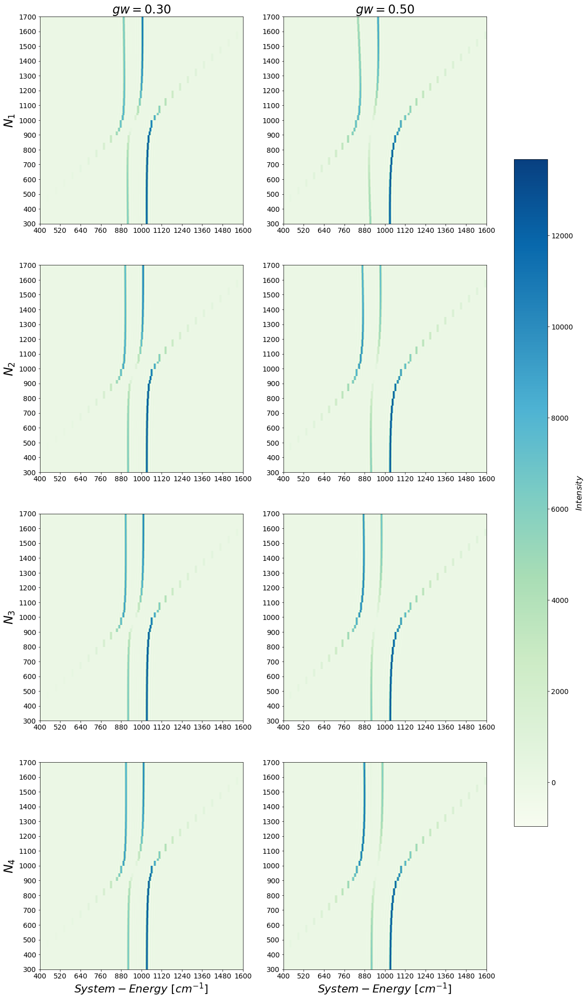

In [59]:
fig, ax = plt.subplots(4,2,figsize=(20,35)) #, sharex=True)

img123=ax[0,0].pcolormesh(xx,yy,zz12,cmap=plt.cm.get_cmap('GnBu'))
ax[0,1].pcolormesh(xx,yy,zz13,cmap=plt.cm.get_cmap('GnBu'))
ax[1,0].pcolormesh(xx,yy,zz22,cmap=plt.cm.get_cmap('GnBu'))
ax[1,1].pcolormesh(xx,yy,zz23,cmap=plt.cm.get_cmap('GnBu'))
ax[2,0].pcolormesh(xx,yy,zz32,cmap=plt.cm.get_cmap('GnBu'))
ax[2,1].pcolormesh(xx,yy,zz33,cmap=plt.cm.get_cmap('GnBu'))
ax[3,0].pcolormesh(xx,yy,zz42,cmap=plt.cm.get_cmap('GnBu'))
ax[3,1].pcolormesh(xx,yy,zz43,cmap=plt.cm.get_cmap('GnBu'))

# bx321=fig.colorbar(img321, ax=ax[:],bbox_to_anchor=(1.05, 0., 1, 1),shrink=0.7,ticklocation = 'top')

bx321=fig.colorbar(img123, ax=ax[:,:], orientation="vertical",shrink=0.7,ticklocation = 'top')
bx321.set_label(r'$Intensity$')

bx321.set_label(r'$Intensity$')
# fig.colorbar(img1, ax=ax[0,0], orientation="horizontal",ticklocation="top")
# inset_axes(img1,width="5%",height="50%",loc="upper right",bbox_to_anchor=(0.05, 0.95, 1))
# ax[0,0].set_title(r'$gw=0.10$',fontsize=24)
ax[0,0].set_title(r'$gw=0.30$',fontsize=24)
ax[0,1].set_title(r'$gw=0.50$',fontsize=24)


for k in (0,1,2,3):
    ax[k,0].set_ylabel(r'$N_{}$'.format(k+1),fontsize=24)
    for q in (0,1):
        ax[k,q].set_yticks(arange(300,1700.1,step=100))
        ax[k,q].set_xticks(arange(400,1600.1,step=120))

for p in (0,1):
    ax[3,p].set_xlabel(r'$System-Energy$ [$cm^{-1}$]',fontsize=22)
#     ax[0,p].set_title(r'$\hbar w_{c}$ [$cm^{-1}$]',fontsize=22)
    
#     ax[0,0].plot(t,expecM[i,2,0,1],label=r'N={}'.format(A[i]))     

    
# ax[0,2].set_title(r'$\alpha_{1}+\alpha_{2}$',fontsize=24)

# ax[0].legend(bbox_to_anchor=(0.01, 1.2,2, -0.05),ncol=7,mode="expand")
# plt.tight_layout()
# plt.subplots_adjust(wspace=.0)
plt.savefig('N1234-gw01.png', dpi=600,bbox_inches='tight')    
# plt.colorbar()
plt.show()

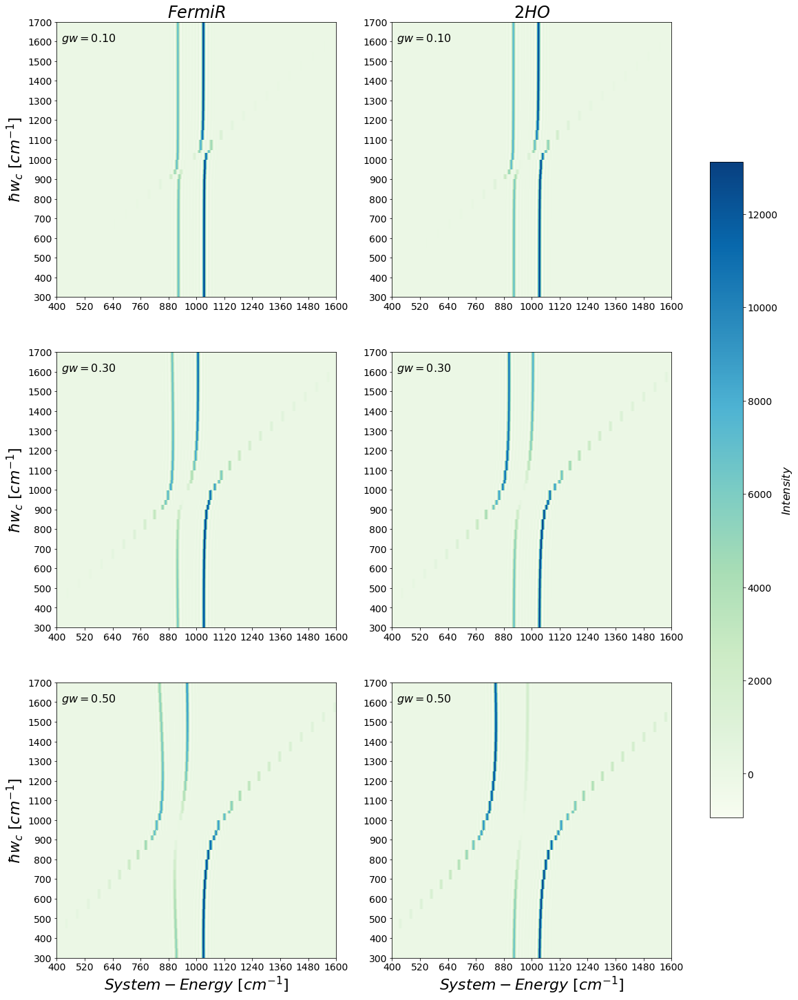

In [51]:
fig, ax = plt.subplots(3,2,figsize=(20,25)) #, sharex=True)

img12=ax[0,0].pcolormesh(xx,yy,zz11,cmap=plt.cm.get_cmap('GnBu'))
ax[1,0].pcolormesh(xx,yy,zz12,cmap=plt.cm.get_cmap('GnBu'))
ax[2,0].pcolormesh(xx,yy,zz13,cmap=plt.cm.get_cmap('GnBu'))
ax[0,1].pcolormesh(xx,yy,zz011,cmap=plt.cm.get_cmap('GnBu'))
ax[1,1].pcolormesh(xx,yy,zz012,cmap=plt.cm.get_cmap('GnBu'))
ax[2,1].pcolormesh(xx,yy,zz013,cmap=plt.cm.get_cmap('GnBu'))
# ax[0,2].pcolormesh(xx,yy,zz41,cmap=plt.cm.get_cmap('GnBu'))
# ax[1,2].pcolormesh(xx,yy,zz51,cmap=plt.cm.get_cmap('GnBu'))
# ax[2,2].pcolormesh(xx,yy,zz61,cmap=plt.cm.get_cmap('GnBu'))

bx12=fig.colorbar(img12, ax=ax[:,:], orientation="vertical",shrink=0.7,ticklocation = 'top')
bx12.set_label(r'$Intensity$')
# fig.colorbar(img1, ax=ax[0,0], orientation="horizontal",ticklocation="top")
# inset_axes(img1,width="5%",height="50%",loc="upper right",bbox_to_anchor=(0.05, 0.95, 1))

ax[0,0].set_title(r'$Fermi R$',fontsize=24)
ax[0,1].set_title(r'$2 HO$',fontsize=24)

for k in (0,1):
    ax[0,k].text(420,1600,r'$gw=0.10$',fontsize=16)
    ax[1,k].text(420,1600,r'$gw=0.30$',fontsize=16)
    ax[2,k].text(420,1600,r'$gw=0.50$',fontsize=16)
    ax[2,k].set_xlabel(r'$System-Energy$ [$cm^{-1}$]',fontsize=22)
    for q in (0,1,2):
        ax[q,k].set_yticks(arange(300,1700.1,step=100))
        ax[q,k].set_xticks(arange(400,1600.1,step=120))
    
for p in (0,1,2):
    ax[p,0].set_ylabel(r'$\hbar w_{c}$ [$cm^{-1}$]',fontsize=22)
# ax[0,2].set_title(r'$\alpha_{1}+\alpha_{2}$',fontsize=24)


# ax[0].legend(bbox_to_anchor=(0.01, 1.2,2, -0.05),ncol=7,mode="expand")
# plt.tight_layout()
# plt.subplots_adjust(wspace=.0)
# plt.savefig('spectra_1MolFer-2HO.png', dpi=600,bbox_inches='tight')    
# plt.colorbar()
plt.show()

# 1.2 Hamiltonian Analysis

In [120]:
# import sympy
# from sympy import * M
# Wc=np.arange(300,1700.50)
Wc=950
W1=1000
g=0.5
B=24.2825

H2Cav=np.array(((Wc,g,0),(g,W1,B),(0,B,W1)))
print(H2Cav)

[[9.50000e+02 5.00000e-01 0.00000e+00]
 [5.00000e-01 1.00000e+03 2.42825e+01]
 [0.00000e+00 2.42825e+01 1.00000e+03]]


In [121]:
H2=np.array(((W1,2*B),(B,W1)))
print(H2)

[[1000.       48.565 ]
 [  24.2825 1000.    ]]


In [123]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.linalg as la

eigvals, eigvecs = la.eig(H2)
print(eigvals)
print(eigvecs)

[1034.34064083+0.j  965.65935917+0.j]
[[ 0.81649658 -0.81649658]
 [ 0.57735027  0.57735027]]


D=np.diag(eigvals)
print(D)

In [30]:
P=eigvecs
M=P @ D @ la.inv(P)
print(M)

[[1.00000000e+03+0.j 5.00000000e-01+0.j 5.32907052e-15+0.j]
 [5.00000000e-01+0.j 1.00000000e+03+0.j 1.00000000e+02+0.j]
 [1.15463195e-14+0.j 1.00000000e+02+0.j 1.00000000e+03+0.j]]


# Extra information - code

## 1.3 PES and spectra

In [6]:
#PES for Molecules gw
NmoleculesM = 6
Nphotons = 1
MaxQuanta = 1
Ecav = 3.81*cv.ev2au
gw = 0.01  # -> g/Ecav
gw = gw/np.sqrt(NmoleculesM)
BM = pol.returnBasis_Qmax(NmoleculesM,Nphotons,MaxQuanta)
v0 = np.zeros(NmoleculesM,float)
v1 = np.zeros(NmoleculesM,float)
mu = np.zeros(NmoleculesM,float)

def potMolCavM(R): # R -> [R0,R1,R2,R3,...]
    for i,r in enumerate(R):
        v0[i] = potV0(r)
        v1[i] = potV1(r)
        mu[i] = dip(r)
    evals,evecs,H = pol.Hmat(BM,Ecav,v0,v1,mu,gw*Ecav,nopol=True)
    mth.sortEigValsVecs(evals,evecs)
    return evals,evecs,H

x0 = 3.8
x1 = 7.5
npoints = 200
XM = np.linspace(x0,x1,npoints)
cutpotM = []
for i,x in enumerate(XM):
    xx = np.zeros(NmoleculesM,float)
    xx[5] = 5.3160737237
    xx[4] = 5.3960737237
    xx[3] = 5.3760737237
    xx[2] = 5.3560737237 
    xx[1] = 5.3360737237 #Real value
    xx[0] = x

    cutpotM.append( potMolCavM(xx)[0] )
cutpotM = np.asarray(cutpotM)

In [7]:
#PES for atoms gw
NmoleculesA = 6
Nphotons = 1
MaxQuanta = 1
Ecav = 3.81*cv.ev2au
gw = 0.01  # -> g/Ecav
gw = gw/np.sqrt(NmoleculesA)
BA = pol.returnBasis_Qmax(NmoleculesA,Nphotons,MaxQuanta)
v0 = np.zeros(NmoleculesA,float)
v1 = np.zeros(NmoleculesA,float)
mu = np.zeros(NmoleculesA,float)
def potMolCavA(R):
    for i,r in enumerate(R):
        v0[i] = potV0(r)
        v1[i] = potV1(r)
        mu[i] = dip(r)
    evals,evecs,H = pol.Hmat(BA,Ecav,v0,v1,mu,gw*Ecav,nopol=True)
    mth.sortEigValsVecs(evals,evecs)
    return evals,evecs,H

x0 = 3.8
x1 = 7.5
npoints = 200
XA = np.linspace(x0,x1,npoints)
cutpotA = []
for i,y in enumerate(XA):
    yy = np.zeros(NmoleculesA,float)
    yy[:] = 5.3360737237
    yy[0] = y
    cutpotA.append( potMolCavA(yy)[0] )
cutpotA = np.asarray(cutpotA)

/home/johana/miniconda3/lib/python3.7/site-packages/numpy/core/numeric.py:538: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


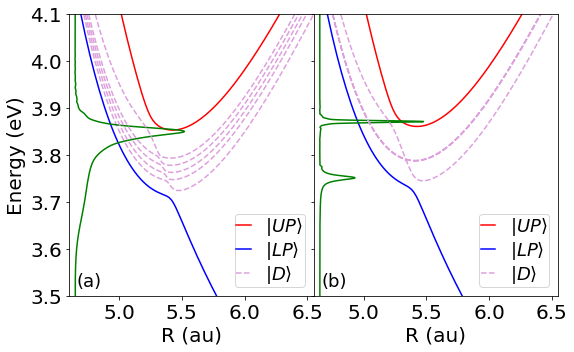

In [9]:
fig, ax = plt.subplots(1,2,figsize=(8,5),sharey=True)

ax[0].plot(XM, cutpotM[:,NmoleculesM+1]*27.21138386-NmoleculesM*emin, color='r',linestyle='-',label=r'$|UP\rangle$')
ax[0].plot(XM, cutpotM[:,1]*27.21138386-NmoleculesM*emin, color='b',linestyle='-',label=r'$|LP\rangle$')
ax[0].plot(XM, cutpotM[:,2]*27.21138386-NmoleculesM*emin, color='plum',linestyle='--',label=r'$|D\rangle$')
ax[0].plot(specM[6,1,1]*0.0018+4.65,Ener,color='g')

ax[1].plot(XA, cutpotA[:,NmoleculesA+1]*27.21138386-NmoleculesA*emin, color='r',linestyle='-',label=r'$|UP\rangle$')
ax[1].plot(XA, cutpotA[:,1]*27.21138386-NmoleculesA*emin, color='b',linestyle='-',label=r'$|LP\rangle$')
ax[1].plot(XA, cutpotA[:,2]*27.21138386-NmoleculesA*emin, color='plum',linestyle='--',label=r'$|D\rangle$')
ax[1].plot(specA[5,1,1]*0.00035+4.65,Ener,color='g')



for k in range(3, NmoleculesM+1):
    ax[0].plot(XM, cutpotM[:,k]*27.21138386-NmoleculesM*emin, color='plum',linestyle='--',marker='')
    ax[1].plot(XA, cutpotA[:,k]*27.21138386-NmoleculesA*emin, color='plum',linestyle='--',)

ax[0].set_xlim(4.6,6.55) # Zoom
ax[1].set_xlim(4.6,6.55) # Zoom
ax[0].set_ylim(3.5,4.1) # Zoom
ax[1].set_ylim(3.5,4.1) # Zoom

myplotparams(ax[0],20,'R (au)','Energy (eV)','lower right')
myplotparams(ax[1],20,'R (au)','','lower right')

ax[0].text(4.66, 3.52,r'(a)',fontsize=18)
ax[1].text(4.66, 3.52,r'(b)',fontsize=18)

fig.tight_layout()
plt.subplots_adjust(wspace=.0)
ax[0].legend(loc='lower right',fontsize=18,borderpad = 0.1, labelspacing = 0.1, handlelength = 0.8)
ax[1].legend(loc='lower right',fontsize=18,borderpad = 0.1, labelspacing = 0.1, handlelength = 0.8)
# ax[0].legend(fontsize=16)
# ax[1].legend(loc='lower right',fontsize=16)
#plt.savefig('AM-Pes1.pdf', dpi=600,bbox_inches='tight')
#plt.savefig('UP-LP1.pdf', dpi=600, bbox_inches='tight')

plt.show()

In [93]:
#PES for atoms 1 gw
Nmolecules = ['2','6','12']
Listmol=list(range(0,13))
print(Listmol)
Nphotons = 1
MaxQuanta = 1
Ecav = 3.81*cv.ev2au

g = 0.01  # -> g/Ecav
g0 = g/np.sqrt(Listmol[4])
g1 = np.sqrt(5)*g/np.sqrt(Listmol[4])
g2 = 0.06/np.sqrt(Listmol[4])

BAw1 = pol.returnBasis_Qmax(NmoleculesAw1,Nphotons,MaxQuanta)
v0 = np.zeros(NmoleculesAw1,float)
v1 = np.zeros(NmoleculesAw1,float)
mu = np.zeros(NmoleculesAw1,float)

#def potMolCavAw1(R): # R -> [R0,R1,R2,R3,...]
#    for i,r in enumerate(R):
#        v0[i] = potV0(r)
#        v1[i] = potV1(r)
#        mu[i] = dip(r)
#    evals,evecs,H = pol.Hmat(BAw1,Ecav,v0,v1,mu,gw*Ecav,nopol=True)
#    mth.sortEigValsVecs(evals,evecs)
#    return evals,evecs,H

#x0 = 3.8
#x1 = 7.5
#npoints = 200
#XAw1 = np.linspace(x0,x1,npoints)
#cutpotAw1 = []
#for i,x in enumerate(XAw1):
#    xx = np.zeros(NmoleculesAw1,float)
#    xx[:] = 5.3360737237
#    xx[0] = x

#    cutpotAw1.append( potMolCavAw1(xx)[0] )
#cutpotAw1 = np.asarray(cutpotAw1)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
gw


In [94]:
#PES for atoms 1 gw
NmoleculesAw1 = 2
Nphotons = 1
MaxQuanta = 1
Ecav = 3.81*cv.ev2au
gw = 0.01  # -> g/Ecav
gw = gw/np.sqrt(NmoleculesAw1)
BAw1 = pol.returnBasis_Qmax(NmoleculesAw1,Nphotons,MaxQuanta)
v0 = np.zeros(NmoleculesAw1,float)
v1 = np.zeros(NmoleculesAw1,float)
mu = np.zeros(NmoleculesAw1,float)

def potMolCavAw1(R): # R -> [R0,R1,R2,R3,...]
    for i,r in enumerate(R):
        v0[i] = potV0(r)
        v1[i] = potV1(r)
        mu[i] = dip(r)
    evals,evecs,H = pol.Hmat(BAw1,Ecav,v0,v1,mu,gw*Ecav,nopol=True)
    mth.sortEigValsVecs(evals,evecs)
    return evals,evecs,H

x0 = 3.8
x1 = 7.5
npoints = 200
XAw1 = np.linspace(x0,x1,npoints)
cutpotAw1 = []
for i,x in enumerate(XAw1):
    xx = np.zeros(NmoleculesAw1,float)
    xx[:] = 5.3360737237
    xx[0] = x

    cutpotAw1.append( potMolCavAw1(xx)[0] )
cutpotAw1 = np.asarray(cutpotAw1)

In [95]:
#PES for atoms 11 gw
NmoleculesA12 = 12
Nphotons = 1
MaxQuanta = 1
Ecav = 3.81*cv.ev2au
gw = 0.01  # -> g/Ecav
gw = gw/np.sqrt(NmoleculesA12)
BA12 = pol.returnBasis_Qmax(NmoleculesA12,Nphotons,MaxQuanta)
v0 = np.zeros(NmoleculesA12,float)
v1 = np.zeros(NmoleculesA12,float)
mu = np.zeros(NmoleculesA12,float)
def potMolCavA12(R):
    for i,r in enumerate(R):
        v0[i] = potV0(r)
        v1[i] = potV1(r)
        mu[i] = dip(r)
    evals,evecs,H = pol.Hmat(BA12,Ecav,v0,v1,mu,gw*Ecav,nopol=True)
    mth.sortEigValsVecs(evals,evecs)
    return evals,evecs,H

x0 = 3.8
x1 = 7.5
npoints = 200
XA12 = np.linspace(x0,x1,npoints)
cutpotA12 = []
for i,y in enumerate(XA12):
    yy = np.zeros(NmoleculesA12,float)
    yy[:] = 5.3360737237
    yy[0] = y
    cutpotA12.append( potMolCavA12(yy)[0] )
cutpotA12 = np.asarray(cutpotA12)

In [96]:
#PES for atoms 1 gs
NmoleculesAs1 = 2
Nphotons = 1
MaxQuanta = 1
Ecav = 3.81*cv.ev2au
gw = 0.01  # -> g/Ecav
gws = np.sqrt(5)*gw/np.sqrt(NmoleculesAs1)
BAs1 = pol.returnBasis_Qmax(NmoleculesAs1,Nphotons,MaxQuanta)
v0 = np.zeros(NmoleculesAs1,float)
v1 = np.zeros(NmoleculesAs1,float)
mu = np.zeros(NmoleculesAs1,float)
def potMolCavAs1(R): # R -> [R0,R1,R2,R3,...]
    for i,r in enumerate(R):
        v0[i] = potV0(r)
        v1[i] = potV1(r)
        mu[i] = dip(r)
    evals,evecs,H = pol.Hmat(BAs1,Ecav,v0,v1,mu,gws*Ecav,nopol=True)
    mth.sortEigValsVecs(evals,evecs)
    return evals,evecs,H

x0 = 3.8
x1 = 7.5
npoints = 200
XAs1 = np.linspace(x0,x1,npoints)
cutpotAs1 = []
for i,x in enumerate(XAs1):
    xx = np.zeros(NmoleculesAs1,float)
    xx[:] = 5.3360737237
    xx[0] = x

    cutpotAs1.append( potMolCavAs1(xx)[0] )
cutpotAs1 = np.asarray(cutpotAs1)

In [97]:
#PES for atoms 11 gs
NmoleculesAs12 = 12
Nphotons = 1
MaxQuanta = 1
Ecav = 3.81*cv.ev2au
gw = 0.01  # -> g/Ecav
gws = np.sqrt(5)*gw/np.sqrt(NmoleculesAs12)
BAs12 = pol.returnBasis_Qmax(NmoleculesAs12,Nphotons,MaxQuanta)
v0 = np.zeros(NmoleculesAs12,float)
v1 = np.zeros(NmoleculesAs12,float)
mu = np.zeros(NmoleculesAs12,float)
def potMolCavAs12(R):
    for i,r in enumerate(R):
        v0[i] = potV0(r)
        v1[i] = potV1(r)
        mu[i] = dip(r)
    evals,evecs,H = pol.Hmat(BAs12,Ecav,v0,v1,mu,gws*Ecav,nopol=True)
    mth.sortEigValsVecs(evals,evecs)
    return evals,evecs,H

x0 = 3.8
x1 = 7.5
npoints = 200
XAs12 = np.linspace(x0,x1,npoints)
cutpotAs12 = []
for i,y in enumerate(XAs12):
    yy = np.zeros(NmoleculesAs12,float)
    yy[:] = 5.3360737237
    yy[0] = y
    cutpotAs12.append( potMolCavAs12(yy)[0] )
cutpotAs12 = np.asarray(cutpotAs12)

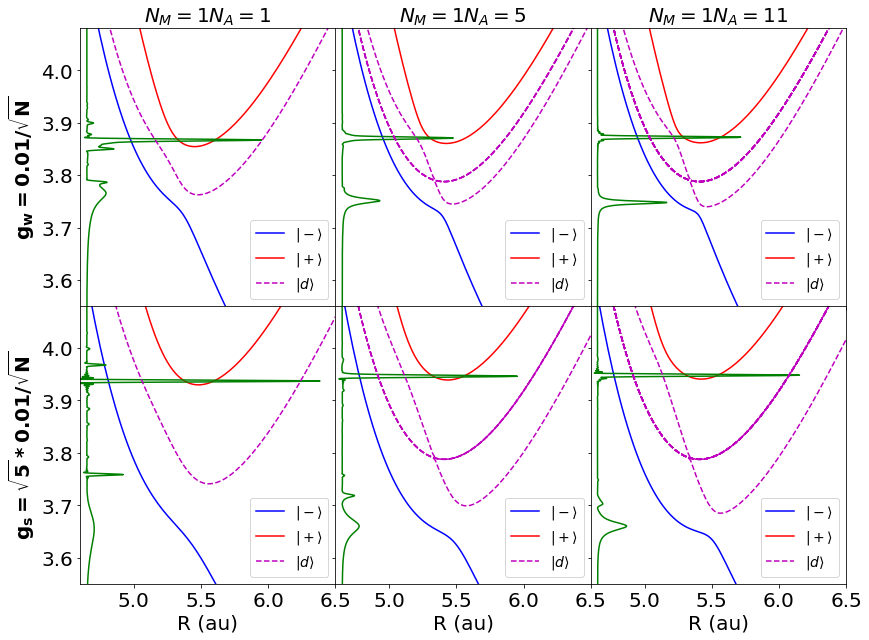

In [98]:
fig, ax = plt.subplots(2,3,figsize=(12,9),sharey=True, sharex=True)

ax[0,0].plot(XAw1, cutpotAw1[:,1]*27.21138386-NmoleculesAw1*emin, color='b',linestyle='-',label=r'$|-\rangle$')
ax[0,0].plot(XAw1, cutpotAw1[:,NmoleculesAw1+1]*27.21138386-NmoleculesAw1*emin, color='r',linestyle='-',label=r'$|+\rangle$')
ax[0,0].plot(specA[1,1,1]*0.0006+4.65,Ener,color='g')


ax[1,0].plot(XAs1, cutpotAs1[:,1]*27.21138386-NmoleculesAs1*emin, color='b',linestyle='-',label=r'$|-\rangle$')
ax[1,0].plot(XAs1, cutpotAs1[:,NmoleculesAs1+1]*27.21138386-NmoleculesAs1*emin, color='r',linestyle='-',label=r'$|+\rangle$')
ax[1,0].plot(specA[1,2,1]*0.00045+4.65,Ener,color='g')


ax[0,1].plot(XA, cutpotA[:,1]*27.21138386-NmoleculesA*emin, color='b',linestyle='-',label=r'$|-\rangle$')
ax[0,1].plot(XA, cutpotA[:,NmoleculesA+1]*27.21138386-NmoleculesA*emin, color='r',linestyle='-',label=r'$|+\rangle$')
ax[0,1].plot(specA[5,1,1]*0.00035+4.65,Ener,color='g')

ax[1,1].plot(XA1, cutpotA1[:,1]*27.21138386-NmoleculesA1*emin, color='b',linestyle='-',label=r'$|-\rangle$')
ax[1,1].plot(XA1, cutpotA1[:,NmoleculesA1+1]*27.21138386-NmoleculesA1*emin, color='r',linestyle='-',label=r'$|+\rangle$')
ax[1,1].plot(specA[5,2,1]*0.00045+4.65,Ener,color='g')

ax[0,2].plot(XA12, cutpotA12[:,1]*27.21138386-NmoleculesA12*emin, color='b',linestyle='-',label=r'$|-\rangle$')
ax[0,2].plot(XA12, cutpotA12[:,NmoleculesA12+1]*27.21138386-NmoleculesA12*emin, color='r',linestyle='-',label=r'$|+\rangle$')
ax[0,2].plot(specA[11,1,1]*0.00035+4.65,Ener,color='g')

ax[1,2].plot(XAs12, cutpotAs12[:,1]*27.21138386-NmoleculesAs12*emin, color='b',linestyle='-',label=r'$|-\rangle$')
ax[1,2].plot(XAs12, cutpotAs12[:,NmoleculesAs12+1]*27.21138386-NmoleculesAs12*emin, color='r',linestyle='-',label=r'$|+\rangle$')
ax[1,2].plot(specA[11,2,1]*0.00045+4.65,Ener,color='g')


ax[0,0].plot(XAw1, cutpotAw1[:,2]*27.21138386-NmoleculesAw1*emin, color='m',linestyle='--',label=r'$|d\rangle$')
ax[1,0].plot(XAs1, cutpotAs1[:,2]*27.21138386-NmoleculesAs1*emin, color='m',linestyle='--',label=r'$|d\rangle$')
ax[0,1].plot(XA, cutpotA[:,2]*27.21138386-NmoleculesA*emin, color='m',linestyle='--',label=r'$|d\rangle$')
ax[1,1].plot(XA1, cutpotA1[:,2]*27.21138386-NmoleculesA1*emin, color='m',linestyle='--',label=r'$|d\rangle$')
ax[0,2].plot(XA12, cutpotA12[:,2]*27.21138386-NmoleculesA12*emin, color='m',linestyle='--',label=r'$|d\rangle$')
ax[1,2].plot(XAs12, cutpotAs12[:,2]*27.21138386-NmoleculesAs12*emin, color='m',linestyle='--',label=r'$|d\rangle$')

for j in range(3, NmoleculesM1+1):
    ax[0,1].plot(XA, cutpotA[:,j]*27.21138386-NmoleculesA*emin, color='m',linestyle='--',)
    ax[1,1].plot(XA1, cutpotA1[:,j]*27.21138386-NmoleculesA1*emin, color='m',linestyle='--',)

for k in range(3, NmoleculesA12+1):
    ax[0,2].plot(XA12, cutpotA12[:,k]*27.21138386-NmoleculesA12*emin, color='m',linestyle='--',)
    ax[1,2].plot(XAs12, cutpotAs12[:,k]*27.21138386-NmoleculesAs12*emin, color='m',linestyle='--',)


ax[0,0].set_xlim(4.6,6.5) # Zoom
ax[0,0].set_ylim(3.55,4.08) # Zoom

ax[0,0].set_title(r'$N_{M}=1 N_{A}=1$',fontsize=20)
ax[0,1].set_title(r'$N_{M}=1 N_{A}=5$',fontsize=20)
ax[0,2].set_title(r'$N_{M}=1 N_{A}=11$',fontsize=20)

myplotparams(ax[0,0],20,'',r'$\mathbf{g_{w}=0.01/ \sqrt{N}}$','lower left')
myplotparams(ax[1,0],20,'R (au)',r'$\mathbf{g_{s}=\sqrt{5}*0.01/ \sqrt{N}}$','lower right')
myplotparams(ax[1,1],20,'R (au)','','lower right')
myplotparams(ax[1,2],20,'R (au)','','lower right')

for l in (0,1,2):
    ax[0,l].legend()
    ax[1,l].legend()

fig.tight_layout()
plt.subplots_adjust(wspace=.0)
plt.subplots_adjust(hspace=.0)

#plt.savefig('PES-A-gsw.png', dpi=600,bbox_inches='tight')
plt.show()

## Table of energies

In [17]:
#Collective Rabi Splitting
gw=0.01 # g/w_c
w_cav=3.81 # eV
# w_cav=3.81/eV2H # au
# print(w_cav)
g = gw*w_cav # ev
dip=1.6954666628  # au
fiv=5**(1/2)

for n in range(1,7):
    sqrt=n**(1/2)
    Rabis1=sqrt*2*g*dip   # Constante effective coupling
    Rabis2=2*g*dip   # Weak different effective coupling
    Rabis3=2*g*dip*fiv   # Strong different effective coupling
    
    print(Rabis1,Rabis2,Rabis3)
    
        Inmax=max(specM[i,j,1])

0.12919455970536 0.12919455970536 0.2888878178243402
0.1827086985201407 0.12919455970536 0.2888878178243402
0.22377154147117428 0.12919455970536 0.2888878178243402
0.25838911941072 0.12919455970536 0.2888878178243402
0.2888878178243402 0.12919455970536 0.2888878178243402
0.3164607488216682 0.12919455970536 0.2888878178243402


# 3. Population GS & Dissociation probability 

In [6]:
#Setting things for expectations values
tfinal = 500.0
dt = 0.5
t = arange(0,tfinal+0.5,dt)
tgrid = int(tfinal/dt+1)

modes = ['GS','dis']
A = ['0','1','2','3','4','5','6','7','8','9','10','11']
str1=['M','A']
str2=['Unc0.01','Uncdif','/Rsmall/','/Rmed/','/Rbig/']
str3=['UP','MP','LP1','LP','LP2','LasUP','UP1']
str4='/expectation'
str5='/worka/johana/Polaritons/MolNaI/'

mymols=len(A)
myplots=len(str2)
myptn=len(str3)
mymodes=len(modes)
num=list(range(mymols))

expecM = zeros((mymols,myplots,myptn,mymodes+1,tgrid))  #Exactly at UP energy
for i in (1,2,3,4,5,6):
    for j in (2,3):
        #for k in (0,1,2,3,4):
         for k in (0,4):
            moles = str5+A[i]+str1[0]+str2[j]+str3[k]+str4  #gs 3.85 & gw 4.92        
            #print(moles)
            ptemp = pd.read_csv(moles, '\s+', header=None,skiprows=3)
            expecM[i,j,k,0]=ptemp[2].values   #GS
            expecM[i,j,k,1]=ptemp[6].values   #Dis
            expecM[i,j,k,0]=expecM[i,j,k,0]/expecM[i,j,k,0,0]          
  #      for l in (0,3,4): 
            GSTot=expecM[i,j,k,0,100]  
            GSM1=GSTot**(1/num[i])
            ESM1=1-GSM1
            expecM[i,j,k,1]=expecM[i,j,k,1]/ESM1

expecA = zeros((mymols,myplots,myptn+2,mymodes+2,tgrid))  #Exactly at UP energy
for l in (1,2,3,4,5,6,7,8,9,10,11):    
    for m in (2,3):
        for k in (0,1,2,3,4):
            atoms = str5+A[1]+str1[0]+A[l]+str1[1]+str2[m]+str3[k]+str4      
            #print(moles)
            ptemp = pd.read_csv(atoms, '\s+', header=None,skiprows=3)
            expecA[l,m,k,0]=ptemp[2].values   #GS
            expecA[l,m,k,1]=ptemp[6].values   #Dis
            expecA[l,m,k,0]=expecA[l,m,k,0]/expecA[l,m,k,0,0]
            GSTota=expecA[l,m,k,0,90]  
            ESM1a=1-GSTota
            expecA[l,m,k,1]=expecA[l,m,k,1]/ESM1a
        
            GSTota1=expecA[l,m,4,0,90]  
            ESM1a1=1-GSTota1    
   

In [7]:
B=['15','20']
myb=len(B)
expecAM = zeros((myb,myplots,myptn,mymodes+1,tgrid))

for i in (0,1):
    atoms15 = A[1]+str1[0]+B[i]+str1[1]+str2[3]+str3[0]+str4      
    ptemp = pd.read_csv(atoms15, '\s+', header=None,skiprows=3)
    expecAM[i,3,0,0]=ptemp[2].values   #GS
    expecAM[i,3,0,1]=ptemp[6].values   #Dis
    expecAM[i,3,0,0]=expecAM[i,3,0,0]/expecAM[i,3,0,0,0]
    GSTota1m=expecAM[i,3,0,0,90]  
    ESM1a1m=1-GSTota1m
    expecAM[i,3,0,1]=expecAM[i,3,0,1]/ESM1a1m    

## 3.1 Molecules NaI

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


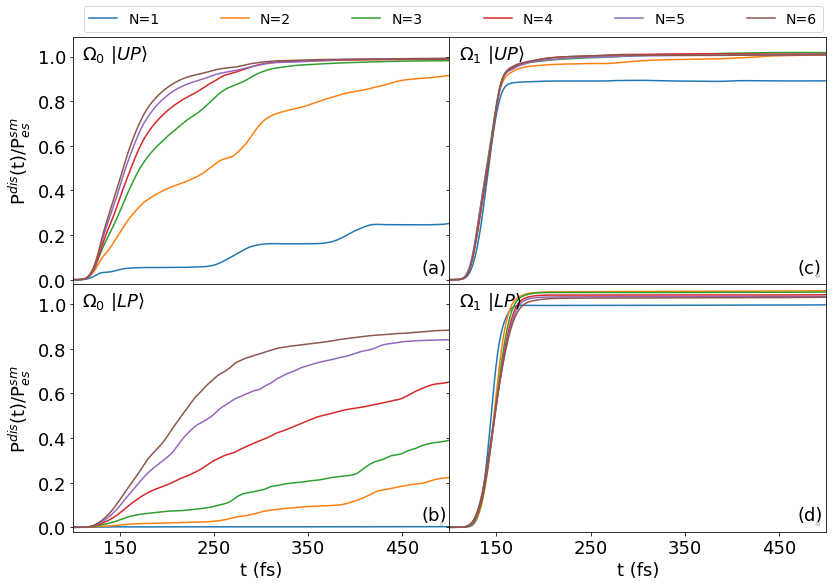

In [109]:
fig, ax = plt.subplots(2,2,figsize=(12,8),sharey=True,sharex=True)

for i in (1,2,3,4,5,6):
    ax[0,0].plot(t,expecM[i,2,0,1],label=r'N={}'.format(A[i])) 
    ax[0,1].plot(t,expecM[i,2,4,1]) 
    ax[1,0].plot(t,expecM[i,3,0,1]) 
    ax[1,1].plot(t,expecM[i,3,4,1]) 
    
for j in (0,1):
    for k in (0,1):
        ax[j,k].set_xlim(100,500)
        ax[j,k].set_ylim(-0.02,1.09)
        ax[j,k].set_xticks(arange(150,450.1, step=100))

myplotparams(ax[0,0],18,'',r'P$^{dis}$(t)/P${_{es}^{sm}}$','lower right')  
myplotparams(ax[0,1],18,'','','lower right')  
myplotparams(ax[1,0],18,'t (fs)',r'P$^{dis}$(t)/P${_{es}^{sm}}$','lower right')  
myplotparams(ax[1,1],18,'t (fs)','','lower right')  

ax[0,0].text(110, 0.99,r'$\Omega_{0}$ $|UP\rangle$',fontsize=18)
ax[1,0].text(110, 0.99,r'$\Omega_{0}$ $|LP\rangle$',fontsize=18)
ax[0,1].text(110, 0.99,r'$\Omega_{1}$ $|UP\rangle$',fontsize=18)   
ax[1,1].text(110, 0.99,r'$\Omega_{1}$ $|LP\rangle$',fontsize=18)

ax[0,0].text(470, 0.03,r'(a)',fontsize=18)
ax[1,0].text(470, 0.03,r'(b)',fontsize=18)
ax[0,1].text(470, 0.03,r'(c)',fontsize=18)
ax[1,1].text(470, 0.03,r'(d)',fontsize=18)


plt.tight_layout()
ax[0,0].legend(bbox_to_anchor=(0.01, 1.2,2, -0.05),ncol=7,mode="expand")
plt.subplots_adjust(hspace=.0)
plt.subplots_adjust(wspace=.0)
# plt.savefig('DisM2.png', dpi=800,bbox_inches='tight')

plt.show()

## 3.2 Atoms & Molecule NaI

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


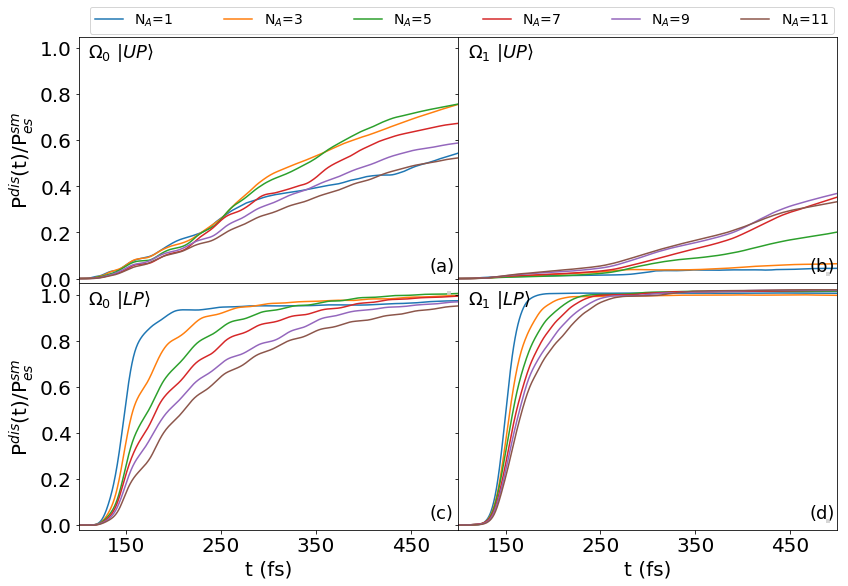

In [164]:
# fig, ax = plt.subplots(3,2,figsize=(12,12), sharey=True,sharex=True)
fig, ax = plt.subplots(2,2,figsize=(12,8), sharey=True,sharex=True)

for i in (1,3,5,7,9,11):
    ax[0,0].plot(t,expecA[i,2,0,1],label=r'N$_A$={}'.format(A[i])) 
    ax[1,0].plot(t,expecA[i,2,4,1])
    ax[0,1].plot(t,expecA[i,3,0,1]) 
    ax[1,1].plot(t,expecA[i,3,4,1])
#     ax[2,0].plot(t,expecA[i,4,0,1])
    
# for j in (0,1,2):
for j in (0,1):
    for k in (0,1):
        ax[j,k].set_xlim(100,500)
        ax[j,k].set_ylim(-0.02,1.05)
        ax[j,k].set_xticks(arange(150,450.1, step=100))
        
myplotparams(ax[0,0],20,'',r'P$^{dis}$(t)/P${_{es}^{sm}}$','lower right')   
myplotparams(ax[0,1],20,'','','lower right')  
myplotparams(ax[1,0],20,'t (fs)',r'P$^{dis}$(t)/P${_{es}^{sm}}$','upper right')   
myplotparams(ax[1,1],20,'t (fs)','','lower right')
# myplotparams(ax[2,0],18,'t (fs)',r'P$^{dis}$(t)/P${_{es}^{sm}}$','upper right')   
# myplotparams(ax[2,1],18,'t (fs)','','lower right')

ax[0,0].text(110, 0.96,r'$\Omega_{0}$ $|UP\rangle$',fontsize=18)
ax[1,0].text(110, 0.96,r'$\Omega_{0}$ $|LP\rangle$',fontsize=18)

ax[0,1].text(110, 0.96,r'$\Omega_{1}$ $|UP\rangle$',fontsize=18)
ax[1,1].text(110, 0.96,r'$\Omega_{1}$ $|LP\rangle$',fontsize=18)

# ax[2,0].text(110, 0.96,r'$g_{2}$ $|UP\rangle$',fontsize=18)
# ax[2,1].text(110, 0.96,r'$g_{2}$ $|LP\rangle$',fontsize=18)

ax[0,0].text(470, 0.03,r'(a)',fontsize=18)
ax[0,1].text(470, 0.03,r'(b)',fontsize=18)
ax[1,0].text(470, 0.03,r'(c)',fontsize=18)
ax[1,1].text(470, 0.03,r'(d)',fontsize=18)
# ax[2,0].text(470, 0.03,r'(e)',fontsize=18)
# ax[2,1].text(470, 0.03,r'(f)',fontsize=18)

plt.tight_layout()
ax[0,0].legend(bbox_to_anchor=(0.01, 1.2,2, -0.05),ncol=7,mode="expand")
plt.subplots_adjust(hspace=.0)
plt.subplots_adjust(wspace=.0)
# plt.savefig('DisA2.png', dpi=800,bbox_inches='tight')
plt.show()

When adding atoms to the system and coupling them with the cavity and the laser pulse, the probability of the system being in the ground state or in the excited state in the same for every particle in the system. This is because the laser can only give one quanta of energy to the system and this can either excite the cavity, an atoms or the molecule. Therefore, the probability of the population being in the ground state  

# Population of UP and LP

# Constant rates

In [9]:
t_short = arange(0, 360+0.5, 0.5)
t_grid = int(360/0.5+1)

RatesA = zeros((mymols,myplots,t_grid)) 
for i in range(1,12):
    for k in (2,3):
        #for w in range(270,1001):
        atoms = str5+A[1]+str1[0]+A[i]+str1[1]+str2[k]+str3[4]+str4 
        ptemp = pd.read_csv(atoms, '\s+', header=None,skiprows=283)
        RatesA[i,k]=ptemp[6].values   #DIs
        GSTota1=expecA[i,k,4,0,90]  
        ESM1a1=1-GSTota1
        RatesA[i,k]=RatesA[i,k]/ESM1a1
        #print(ESM1a1)

In [10]:
from scipy import optimize

def test_func(x,b):
    return  1-exp(-b * x)

params = zeros((mymols,myplots))

for i in range(1,12):
    for j in (2,3):
        params[i,j], params_covariance = optimize.curve_fit(test_func, t_short, RatesA[i,j])
#        print(params)

In [10]:
from scipy import optimize

def test1_func(x,a,b):
    return  a*x*x+b*x

In [11]:
from scipy import optimize
x_val=(1,2,3)
y_val=(1,2,4)

params, params_covariance = optimize.curve_fit(test1_func, x_val, y_val,p0=[2, 2])

print(params)

[0.23684211 0.60526316]


TypeError: can't multiply sequence by non-int of type 'float'

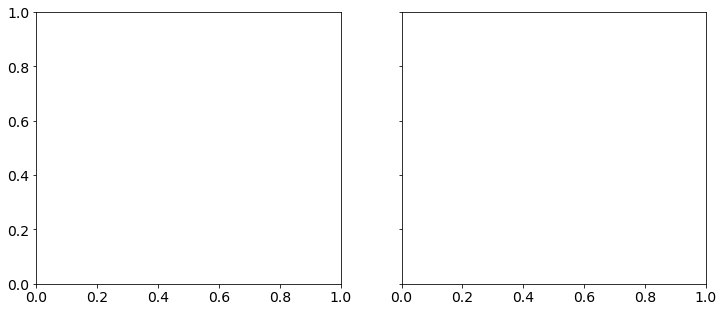

In [12]:
fig, ax = plt.subplots(1,2,figsize=(12,5), sharey=True)

ax[0].plot(x_val,test1_func(x_val,0.23684211,0.60526316), alpha=0.5)

In [152]:
nums = arange(0,mymols,1)
nums1 = 1//nums
print(nums)

def new_test(x,a,b):
    return  (a/x)+b

# params1 = zeros((myplots))

#for i in range(1,12):
#    for j in (2,3):
#        params1[j-2], params_covariance = optimize.curve_fit(new_test, nums, params[i,j])
#        print(params)

[ 0  1  2  3  4  5  6  7  8  9 10 11]


/home/johana/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in floor_divide
  


In [111]:
print(params1)

[1. 1. 0. 0. 0.]


In [152]:
from  astropy.table import Table, Column
import numpy as np

my_g0 = []
my_g1 = []
my_num = []
my_dif = []

for i in range(1,12):
    my_g0.append(round(params[i,2],5))
    my_g1.append(round(params[i,3],5))
    my_num.append(A[i])
    Diff=params[i,3]-params[i,2]
    my_dif.append(round(Diff,5))
    
t=Table([my_num,my_g0,my_g1,my_dif],names=(r'N$_A$',r'g$_0$',r'g$_1$','Dif'))
#        print(params)

[ 0  1  2  3  4  5  6  7  8  9 10 11]


/home/johana/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in floor_divide
  


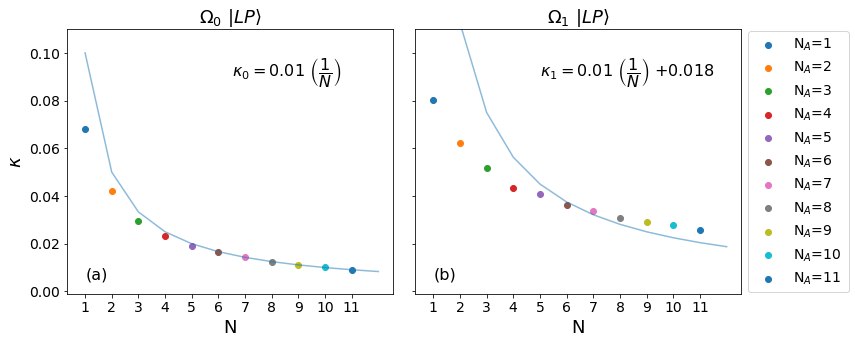

In [222]:
fig, ax = plt.subplots(1,2,figsize=(12,5), sharey=True)

ax[0].plot(nums,new_test(nums+1,0.10,0.0), alpha=0.5)
ax[1].plot(nums,new_test(nums+1,0.225,0.0), alpha=0.5)

for i in range(1,12):
    for j in (2,3):
        ax[j-2].scatter(A[i],params[i,j],label=r'N$_A$={}'.format(A[i]))
#         ax[j-2].legend()        
ax[0].set_ylim(-0.001,0.11)

ax[1].legend(bbox_to_anchor=(1.,1.0,0.35, 0.02),mode="expand")

ax[0].text(5.5, 0.09,r'$\kappa_{0}=0.01$ $\left( \dfrac{1}{N} \right)$',fontsize=16)
ax[1].text(4, 0.09,r'$\kappa_{1}=0.01$ $\left( \dfrac{1}{N} \right)$ $+0.018$',fontsize=16)

ax[0].text(0.005, 0.0051,'(a)',fontsize=16)
ax[1].text(0.005, 0.0051,'(b)',fontsize=16)

ax[0].set_ylabel(r'$\kappa$',fontsize=18)
ax[0].set_xlabel('N',fontsize=18)
ax[1].set_xlabel('N',fontsize=18)        
ax[0].set_title(r'$\Omega_{0}$ $|LP\rangle$',fontsize=18)
ax[1].set_title(r'$\Omega_{1}$ $|LP\rangle$',fontsize=18)

plt.tight_layout()
# plt.savefig('Ratesfit1.pdf', dpi=80T0,bbox_inches='tight')
plt.show()


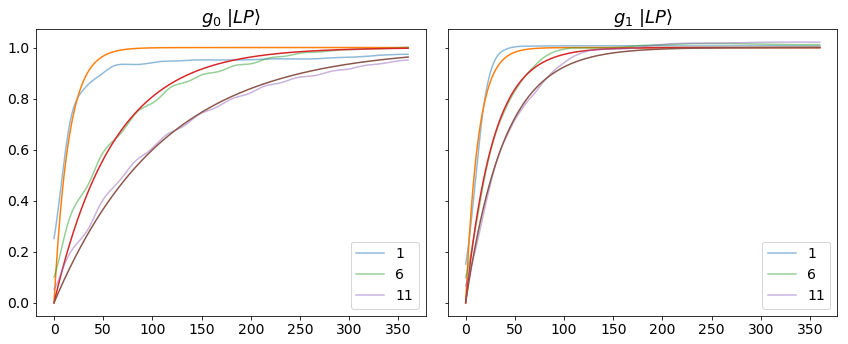

In [12]:
fig, ax = plt.subplots(1,2,figsize=(12,5), sharey=True)

for i in (1,6,11):
    for j in (2,3):
        ax[j-2].plot(t_short,RatesA[i,j],label='{}'.format(A[i]), alpha=0.5)
        ax[j-2].plot(t_short,test_func(t_short, params[i,j]))
        ax[j-2].legend()
        
ax[0].set_title(r'$g_{0}$ $|LP\rangle$',fontsize=18)
ax[1].set_title(r'$g_{1}$ $|LP\rangle$',fontsize=18)

plt.tight_layout()
plt.show()


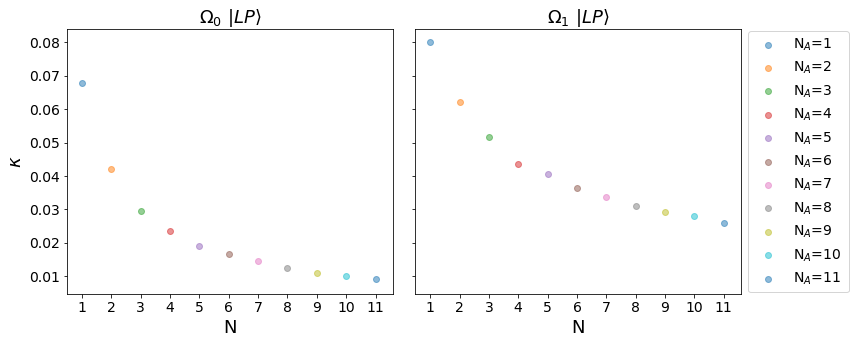

In [21]:
fig, ax = plt.subplots(1,2,figsize=(12,5), sharey=True)

for i in range(1,12):
    for j in (2,3):
        ax[j-2].scatter(A[i],params[i,j],label=r'N$_A$={}'.format(A[i]), alpha=0.5)

#     ax[0].plot(i,1//i,color='grey', linestyle='-')

# ax[1].legend(fontsize=10, loc='upper right')
ax[1].legend(bbox_to_anchor=(1.,1.0,0.35, 0.02),mode="expand")

ax[0].set_title(r'$\Omega_{0}$ $|LP\rangle$',fontsize=18)
ax[1].set_title(r'$\Omega_{1}$ $|LP\rangle$',fontsize=18)
ax[0].set_ylabel(r'$\kappa$',fontsize=18)
ax[0].set_xlabel('N',fontsize=18)
ax[1].set_xlabel('N',fontsize=18)
        
plt.tight_layout()
# plt.savefig('RatesA2.png', dpi=800,bbox_inches='tight')
plt.show()

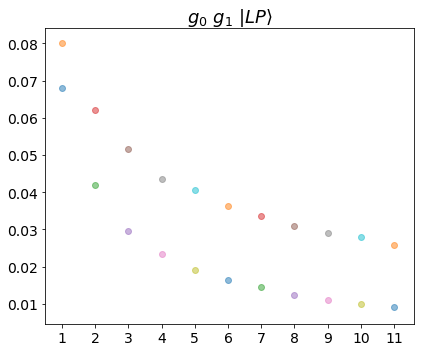

In [61]:
 fig, ax1 = plt.subplots(figsize=(6,5))

for i in range(1,12):
    for j in (2,3):
        ax1.scatter(A[i],params[i,j],label='{}'.format(A[i]), alpha=0.5)
        #ax1.legend(fontsize=11,loc='outside')

ax1.set_title(r'$g_{0}$ $g_{1}$ $|LP\rangle$',fontsize=18)
        
plt.tight_layout()
plt.show()

In [77]:
my_list = []

for w in range(270,1001):
    my_list.append(expecA[11,2,4,1,w])

y_data = np.asarray(my_list)
x_data = arange(0, 365+0.5, 0.5)

#print(len(x_data))

731


## Different laser frequencies used for only molecules system

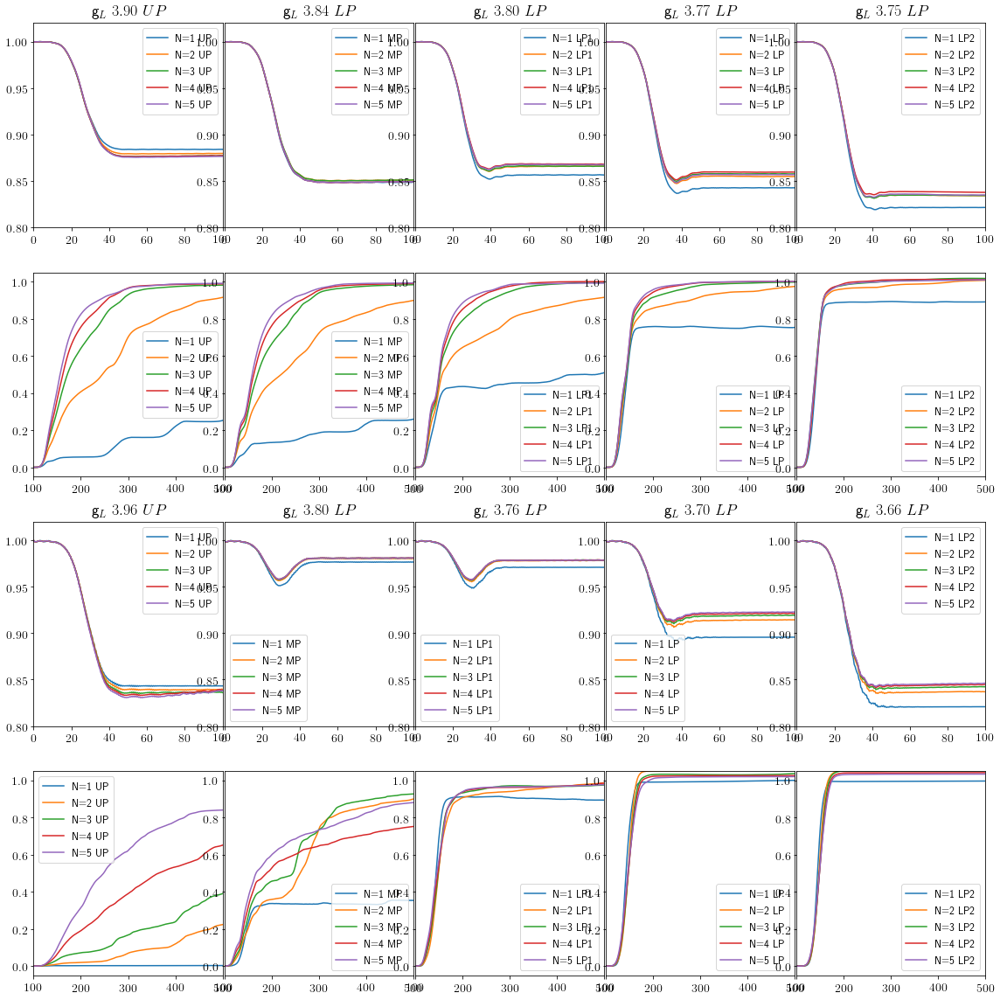

In [70]:
fig, ax = plt.subplots(4,5,figsize=(16,16))

for i in (1,2,3,4,5):
    for k in (0,1,2,3,4):
        for j in (0,1):
            ax[j,k].plot(t,expecM[i,2,k,j],label=r'N={} {}'.format(A[i],str3[k]))
            ax[j+2,k].plot(t,expecM[i,3,k,j],label=r'N={} {}'.format(A[i],str3[k]))
            ax[j,k].legend(fontsize=12)
            ax[j+2,k].legend(fontsize=12) 
        
        ax[0,k].set_xlim(0.0,100)
        ax[2,k].set_xlim(0.0,100)
        ax[1,k].set_xlim(100,500)
        ax[3,k].set_xlim(100,500)
        
        ax[0,k].set_ylim(0.8,1.02)
        ax[2,k].set_ylim(0.8,1.02)
        ax[1,k].set_ylim(-0.05,1.05)
        ax[3,k].set_ylim(-0.05,1.05)
        
#ax[0,0].set_title(r'g$_{w}~UP$',fontsize=22)
ax[0,0].set_title(r'g$_{L}~3.90~UP$',fontsize=18)
ax[0,1].set_title(r'g$_{L}~3.84~LP$',fontsize=18)
ax[0,2].set_title(r'g$_{L}~3.80~LP$',fontsize=18)
ax[0,3].set_title(r'g$_{L}~3.77~LP$',fontsize=18)
ax[0,4].set_title(r'g$_{L}~3.75~LP$',fontsize=18)
        
ax[2,0].set_title(r'g$_{L}~3.96~UP$',fontsize=18)
ax[2,1].set_title(r'g$_{L}~3.80~LP$',fontsize=18)
ax[2,2].set_title(r'g$_{L}~3.76~LP$',fontsize=18)
ax[2,3].set_title(r'g$_{L}~3.70~LP$',fontsize=18)
ax[2,4].set_title(r'g$_{L}~3.66~LP$',fontsize=18)
               
#myplotparams(ax[0,0],18,'',r'g$_{w}$')
#myplotparams(ax[1,0],18,'',r'g$_{w}$')
#myplotparams(ax[2,0],18,'',r'g$_{s}$')
#myplotparams(ax[2,0],18,'',r'g$_{s}$')
        
plt.tight_layout()
#plt.subplots_adjust(hspace=.0)
plt.subplots_adjust(wspace=.01)
#plt.savefig('TODOGS-DisMoldif.png', dpi=600,bbox_inches='tight')
plt.show()           

## Different laser frequencies used for atoms & a molecule system

The option of "-E" in showd1d85 shows the population of all grid-point over time. Therefore, when use over the electronical degree of freedom, it plots the population on both the ground and excited states of the molecule or particule in question. By doing this, there is a graph of the population in each state. 

## Dissociation probability curves separeted by dynamical phenomena

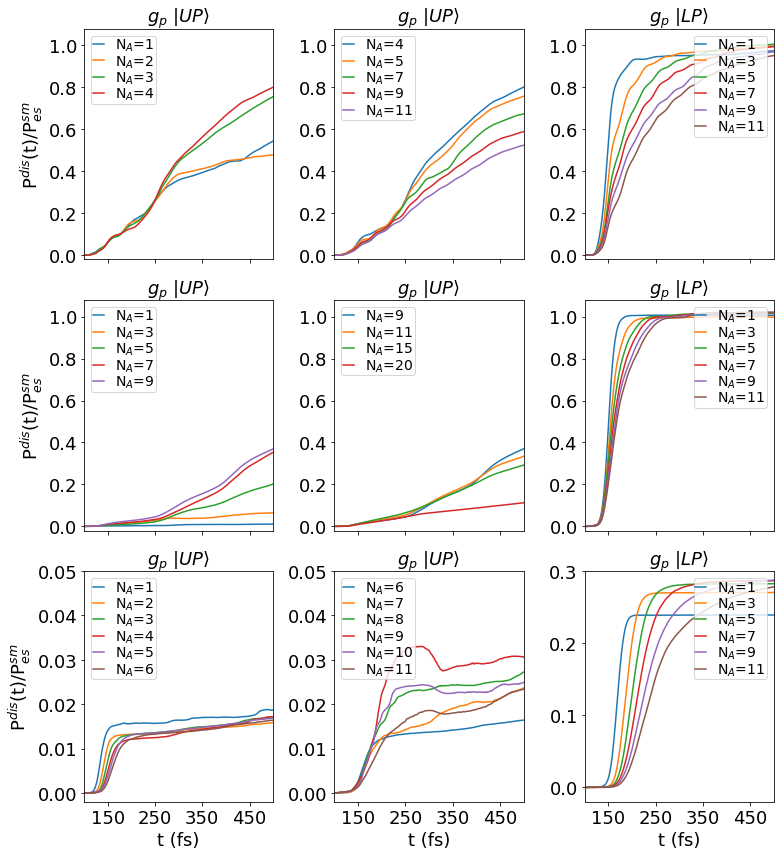

In [84]:
fig, ax = plt.subplots(3,3,figsize=(11,12),sharex=True)

for i in (1,2,3,4):
    ax[0,0].plot(t,expecA[i,2,0,1],label=r'N$_A$={}'.format(A[i])) 

for i in (4,5,7,9,11):    
    ax[0,1].plot(t,expecA[i,2,0,1],label=r'N$_A$={}'.format(A[i]))

for i in (1,3,5,7,9):
    ax[1,0].plot(t,expecA[i,3,0,1],label=r'N$_A$={}'.format(A[i])) 

for i in (9,11):
    ax[1,1].plot(t,expecA[i,3,0,1],label=r'N$_A$={}'.format(A[i]))
    
for i in (1,2,3,4,5,6):
    ax[2,0].plot(t,expecA[i,4,0,1],label=r'N$_A$={}'.format(A[i])) 

for i in (6,7,8,9,10,11):
    ax[2,1].plot(t,expecA[i,4,0,1],label=r'N$_A$={}'.format(A[i]))


for i in (1,3,5,7,9,11):
    ax[0,2].plot(t,expecA[i,2,4,1],label=r'N$_A$={}'.format(A[i])) 
    ax[1,2].plot(t,expecA[i,3,4,1],label=r'N$_A$={}'.format(A[i]))
    ax[2,2].plot(t,expecA[i,4,3,1],label=r'N$_A$={}'.format(A[i]))
    
ax[1,1].plot(t,expecAM[0,3,0,1],label=r'N$_A$=15')
ax[1,1].plot(t,expecAM[1,3,0,1],label=r'N$_A$=20')

for j in (0,1):
    ax[2,j].set_ylim(-0.002,0.05)
    myplotparams(ax[j,0],18,'',r'P$^{dis}$(t)/P${_{es}^{sm}}$','upper left')   
    myplotparams(ax[j,1],18,'','','upper left') 
    myplotparams(ax[j,2],18,'','','upper right')       
    for k in (0,1,2):
        ax[j,k].set_xlim(100,500)
        ax[j,k].set_ylim(-0.02,1.08)
        ax[j,k].set_xticks(arange(150,450.1, step=100))

ax[2,2].set_ylim(-0.02,0.3)
myplotparams(ax[2,0],18,'t (fs)',r'P$^{dis}$(t)/P${_{es}^{sm}}$','upper left')   
myplotparams(ax[2,1],18,'t (fs)','','upper left') 
myplotparams(ax[2,2],18,'t (fs)','','upper right') 

for p in (0,1,2):
    ax[p,0].set_title(r'$g_{p}$ $|UP\rangle$',fontsize=18)
    ax[p,1].set_title(r'$g_{p}$ $|UP\rangle$',fontsize=18)
    ax[p,2].set_title(r'$g_{p}$ $|LP\rangle$',fontsize=18)

plt.tight_layout()
#plt.subplots_adjust(hspace=.1)
#plt.subplots_adjust(wspace=.0)
#plt.savefig('DisA1.pdf', dpi=800,bbox_inches='tight')
plt.show()

In [1]:
# from functools import reduce

import array
import numpy as np
import pandas as pd
import scipy.interpolate as spi
import matplotlib.pyplot as plt
#import CDTK.Tools.Polariton as pol
#import CDTK.Tools.Iterators as itr
#import CDTK.Tools.Conversion as cv
#import CDTK.Tools.Mathematics as mth

#from importlib import reload
#reload(pol)

from numpy import *
eV2H=1/27.21138386
au2fs=0.0241888
def myplotparams(myplot,myfont,mystring1,mystring2,mystring3='upper right'):
    myplot.xaxis.set_tick_params(labelsize=myfont)
    myplot.yaxis.set_tick_params(labelsize=myfont)
    myplot.set_xlabel(mystring1,fontsize=myfont)
    myplot.set_ylabel(mystring2,fontsize=myfont)
    
    legend = myplot.legend(loc=mystring3, shadow=False,fontsize=myfont-4,borderpad = 0.1, labelspacing = 0, handlelength = 0.8)

SMALL_SIZE = 14
MEDIUM_SIZE = 16
BIGGER_SIZE = 20

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

#plt.rc('text', usetex=True)

In [6]:
efinalCr = 2200
dtCr = 1.998001998
EnerCr = arange(200,efinalCr-1,dtCr)
# EnerC = arange(400,efinalC,dtC)
EgridCr = int(((efinalCr-200)/dtCr))
#print(EgridC)

G = ['/Relax/','Coeff/']
H = ['/Cav/','/IR1/','/Rm1/']
I = ['Cav','IR1','Rm1']
# I = ['Cav2','IR12','Rm12']
''
myCross=len(I)

CrossC = zeros((mycav,mymol,mygw,myCross,2,EgridCr))
for l in range(mycav):
    for m in range(mygw):
        for n in range(myCross):
            CrossCorr=str1+A[l]+B[0]+G[1]+D[m]+H[n]+A[l]+F[3]+D[m]+F[4]    
#         ptemp = pd.read_csv(CrossCorr,header=None,skiprows=8,skipfooter=1,delim_whitespace=True)
#         ptemp = pd.read_csv(CrossCorr,'\t',header=None,skiprows=8,nrows=2400)
            ptemp = pd.read_csv(CrossCorr,'\s+',header=None,skiprows=3)
#         print(ptemp)
#         ptemp = pd.read_csv(CrossCorr,'\s+',header=None,skiprows=[0,1,2,3,4,5,6,7,2409])
            CrossC[l,0,m,n,0]=ptemp[0].values
            CrossC[l,0,m,n,1]=ptemp[2].values        

In [2]:
F_au = 41.341374575751  # 1 fs in a.u.
eV2H=1/27.21138386
au2fs=0.0241888

#Modefiable variables
alp = 2.0      # Alpha - Morse Potential (MP)
A_D = 0.018    # Effective Potential Energy - Counter Potentail        
M_1 = 100000   # Mass of Molecule
z_M = 0.09129  # Displacement - MP - Counter Potential
W_m = 0.001286 # Frequency of MP

N_k = 60       # Number of HO in the Bath
W_f = 0.003    # Wn Frequency - Last highest frequency of the bath
B_1 = 10000    # Mass of each HO in the bath

I_G = 500      # Inverso de Gamma [fs] --> Coupling strength

Kap = arange(1,N_k+1)  # Counter for HO in the Bath k=1,...,N

z_0 = z_M*2            # Displacement of HO - Counter Potential
D_w = W_f/N_k          # Delta frequency
W_k = D_w*Kap          # Frecuency for each HO in the Bath
IGau = I_G*F_au        # Inverso de Gamma [au]
nc_k = Kap/N_k         # Kappa / N 

C_z = W_f*((2*B_1*M_1*D_w)/(IGau*pi))**0.5       # C-z --> Constant 
c_1 = Kap*C_z/N_k                                # C_k check
C_k = Kap*((2*B_1*M_1*(D_w**3))/(pi*IGau))**0.5  # C_k

x_0 = (C_k/(B_1*(W_k**2)))*((1-(e**(-alp*z_0)))/alp)  # Displacement HO in Bath